<a href="https://colab.research.google.com/github/NataliaBlueCloud/traffic-latency-simulator/blob/main/simulation_MM1_Milano.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
system('git clone https://github.com/NataliaBlueCloud/traffic-latency-simulator.git')

In [ ]:
install.packages("igraph")
install.packages("simmer")
install.packages("SciViews")
install.packages("hrbrthemes")
install.packages("viridis")
install.packages("googledrive")
install.packages("readxl")
install.packages("openxlsx")

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

also installing the dependency ‘Rcpp’


Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

also installing the dependency ‘ellipse’


Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

also installing the dependencies ‘triebeard’, ‘httpuv’, ‘xtable’, ‘sourcetools’, ‘later’, ‘promises’, ‘urltools’, ‘httpcode’, ‘shiny’, ‘crul’, ‘fontBitstreamVera’, ‘fontLiberation’, ‘extrafontdb’, ‘Rttf2pt1’, ‘gfonts’, ‘fontquiver’, ‘extrafont’, ‘gdtools’


Warning message in install.packages("hrbrthemes"):
“installation of package ‘gdtools’ had non-zero exit status”
Warning message in install.packages("hrbrthemes"):
“installation of package ‘hrbrthemes’ had non-zero exit status”
Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

also installing t

In [ ]:
library(ggplot2)
library(igraph)
library(stringr)
library(simmer)
library(tidyverse)
library(readr)
library(SciViews)
library(dplyr)
library(viridis)
library(readxl)
library(openxlsx)


Attaching package: ‘igraph’


The following objects are masked from ‘package:stats’:

    decompose, spectrum


The following object is masked from ‘package:base’:

    union


── Attaching core tidyverse packages ──────────────────────── tidyverse 2.0.0 ──
✔ dplyr     1.1.3     ✔ readr     2.1.4
✔ forcats   1.0.0     ✔ tibble    3.2.1
✔ lubridate 1.9.3     ✔ tidyr     1.3.0
✔ purrr     1.0.2     
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ lubridate::%--%()      masks igraph::%--%()
✖ dplyr::as_data_frame() masks tibble::as_data_frame(), igraph::as_data_frame()
✖ purrr::compose()       masks igraph::compose()
✖ tidyr::crossing()      masks igraph::crossing()
✖ dplyr::filter()        masks stats::filter()
✖ dplyr::lag()           masks stats::lag()
✖ lubridate::now()       masks simmer::now()
✖ lubridate::rollback()  masks simmer::rollback()
✖ dplyr::select()        masks simmer::select()
✖ tidyr::separate()      masks simmer::separate()
✖ purrr:

In [ ]:
source("/content/traffic-latency-simulator/func/igraph_function_base.R")
source("/content/traffic-latency-simulator/func/igraph_functions.R")
source("/content/traffic-latency-simulator/func/igraph_functions_techno_economic.R")
source("/content/traffic-latency-simulator/func/simmer_function_base.R")
source("/content/traffic-latency-simulator/func/general_function_base.R")

#Input data

The **average packet size** is taken from: Amsterdam Internet Exchange Ethernet Frame Size Distribution, statistics available online at https://stats.ams-ix.net/sflow/size.html, accessed on July 2023

Packet sizes in Bytes: 64-127, 128-511, 512 - 1023, 1024 - 1513, 1514, more than 1515.


With their probabilities: 0.332, 0.054, 0.033, 0.037, 0.346, 0.146, 0.052

In [ ]:
  PS_size=c((64+127)/2,(128+255)/2,(256+511)/2, (512+1023)/2, (1024+1513)/2, 1514, (1515+9100)/2)
  PS_weights=c(33.2/100, 5.4/100, 3.3/100, 3.7/100, 34.6/100, 14.6/100, 5.2/100)
  N = sum(PS_size*PS_weights)
  N

[1] 1019.035

Input excel file with topology information: links, nodes, traffic

In [ ]:
#Milano
file_name_v2 <- "/content/traffic-latency-simulator/input_files/Metro_topology_full_Milano.xlsx"

In [ ]:
nodes_info <- readxl::read_excel(file_name_v2, sheet = 1)
links_info <- readxl::read_excel(file_name_v2, sheet = 2)
traffic_file <- readxl::read_excel(file_name_v2, sheet = 3)

In [ ]:
print(links_info)
print(nodes_info)
print(traffic_file)

# A tibble: 202 × 4
   sourceID destinationID distanceKm capacityGbps
   <chr>    <chr>              <dbl>        <dbl>
 1 Node1    Node2                1             0 
 2 Node1    Node3                1             0 
 3 Node1    Node4                1             0 
 4 Node1    Node8                1          3824.
 5 Node2    Node1                1             0 
 6 Node2    Node5                1          3998.
 7 Node2    Node6                1             0 
 8 Node2    Node7                1             0 
 9 Node3    Node1                1             0 
10 Node3    Node4                0.8           0 
# ℹ 192 more rows
# A tibble: 52 × 11
   node_name node_code `Node Type`  `Central office type` Reference Regional C…¹
   <chr>     <chr>     <chr>        <chr>                 <chr>                 
 1 Node1     HL2       Metro Core   Regional CO           Node1                 
 2 Node2     HL2       Metro Core   Regional CO           Node2                 
 3 Node3     HL2  

Definition of national and regional Cental Offices (COs).


Prefix base - the common name for the nodes in the file.

In [ ]:
national_nodes <- c()
regional_nodes <- c()

for (i in seq_along(nodes_info$node_code)) {
  if (nodes_info$node_code[i] == "HL3") {
    national_nodes <- c(national_nodes, i)
  }
    if (nodes_info$node_code[i] == "HL2") {
    regional_nodes <- c(regional_nodes, i)
  }
}

cat("National nodes:", national_nodes, "\n")
cat("Regional nodes:", regional_nodes, "\n")

National nodes: 9 10 11 12 13 14 15 16 17 18 19 20 40 41 42 43 44 
Regional nodes: 1 2 3 4 5 6 7 8 21 22 23 24 


In [ ]:
prefix_base <- "Node"


#Functions

##Calculation e2e delays theoretically

In [ ]:
prop_queue_tr_delay_e2e <- function(g, traffic_file){
  ###################################################
  E(g)$Queue_Delay <- ifelse(E(g)$Traffic == 0, 0, E(g)$Ni/E(g)$Traffic) #MM1
  ###################################calc e2e delay as summing the delays of all links in the path
  latencyPropTransQueuing_theor_s <- rep(0, nrow(traffic_file))
  latencyPercentile99_theor_s <- rep(0, nrow(traffic_file))
  for (line in 1:nrow(traffic_file))
  {
    if(traffic_file$traffic_ps[line] != 0){
      vertex_sourse <- which(V(g)$name==traffic_file$sourceID[line])
      vertex_destination<- which(V(g)$name==traffic_file$destinationID[line])
      path <- shortest_paths(g, vertex_sourse, vertex_destination,
                             weights = NULL,
                             output = "both",
                             algorithm = c("automatic"))
      latencyPropTransQueuing_theor_s[line] = sum(E(g)[path[["epath"]][[1]]]$Queue_Delay) + sum(E(g)[path[["epath"]][[1]]]$Prop_Delay)
      latencyPercentile99_theor_s[line] <- func_bounds_hoeffding(sum(E(g)[path[["epath"]][[1]]]$Queue_Delay) + sum(E(g)[path[["epath"]][[1]]]$Prop_Delay), 0.99, E(g)[path[["epath"]][[1]]]$Queue_Delay, E(g)[path[["epath"]][[1]]]$Prop_Delay, 0.99)
    }
    else {
      latencyPropTransQueuing_theor_s[line] <- 0
      latencyPercentile99_theor_s[line] <- 0
    }
  }
  return(list(g, latencyPropTransQueuing_theor_s, latencyPercentile99_theor_s))
}

##Calculations delays and traffic values for given loads and capacities



**Arguments**:

*nodes_info, links_info, traffic_file* - input data from excel file;

*Capacity* - of the links Gbps;

*Load_local*, *Load_regional*,*Load_national* - difine the load in Loacal, Regional, and National COs;

*prefix_base* - the common name for the nodes in the file;

*national_nodes, regional_nodes* - difine nodes that are Regional or National CO (the rest are Local by default);

*N* - average packet size.


**Return values**:
*g* - the graph, with the edges (and attributes) added;
*data_av* - numeric vector of average delay of all traffic flows;
*data_99* - numeric vector of 99th hoeffdinf upper bound of all traffic flows;

In [ ]:
simulation_igraph <- function(nodes_info, links_info, traffic_file, Capacity = 10, calc_dist =  FALSE, distance = 5, Load_local = 0.3, Load_regional = 0.5, Load_national = 0.4, prefix_base, national_nodes, regional_nodes, N){

  traffic_file$traffic_ps <- traffic_file$trafficGbps*10^9/(8*N)
  g = graph.data.frame(links_info, directed = TRUE)
  E(g)$capacityGbps <- Capacity
  for (NCO in national_nodes){
    a <- (filter(traffic_file, traffic_file$destinationID == paste0(prefix_base,NCO)))
    size <- length(a$destinationID)
    E(g)$capacityGbps[incident(g, NCO, mode = c("in"))] <- Capacity*size
    }


  #######################

  E(g)$Capacity <- E(g)$capacityGbps*10^9/(8*N) #p/s

  ############distance put original distance(calc_dist = 1) or custom distance (calc_dist = 1) with paramentr "distance" in km
  if( calc_dist == TRUE ) {
    E(g)$Distance = E(g)$distanceKm * distance
  }
  else {
    E(g)$Distance <- E(g)$distanceKm
  }
  ####Load of the links
  #for Local CO
  E(g)$Load <- Load_local
  #national COs
  for (NCO in national_nodes){
    E(g)$Load[incident(g, NCO, mode = c("in"))] <- Load_national
  }
  #regional COs
  for (RCO in regional_nodes){
    E(g)$Load[incident(g, RCO, mode = c("in"))] <- Load_regional
  }

  E(g)$Traffic <- E(g)$Capacity * E(g)$Load
  E(g)$Ni = E(g)$Load/(1-E(g)$Load) # average number of packets in each system
  E(g)$Prop_Delay <- 5*10^(-6)*E(g)$Distance

  c(g, traffic_file$latencyPropTransQueuing_theor_s_mm1, traffic_file$latencyPercentile99_theor_s_mm1) := prop_queue_tr_delay_e2e(g, traffic_file)

  data_av <- traffic_file$latencyPropTransQueuing_theor_s_mm1

  data_99 <- traffic_file$latencyPercentile99_theor_s_mm1
  #removing the local traffic
  data_av <- data_av[data_av != 0]
  data_99 <- data_99[data_99 != 0]
  return(list(g, data_av, data_99))

}



#Igraph calculations


##Building the graph:


In [ ]:
g <- graph.data.frame(links_info, directed = TRUE, vertices = nodes_info)

##Calculations of the capacity in p/s



In [ ]:
E(g)$Distance <- E(g)$distanceKm
E(g)$Definition <- paste0(get.edgelist(g)[,1],"->",get.edgelist(g)[,2])
E(g)$Capacity <- E(g)$capacityGbps*10^9/(8*N)

##Plot graph

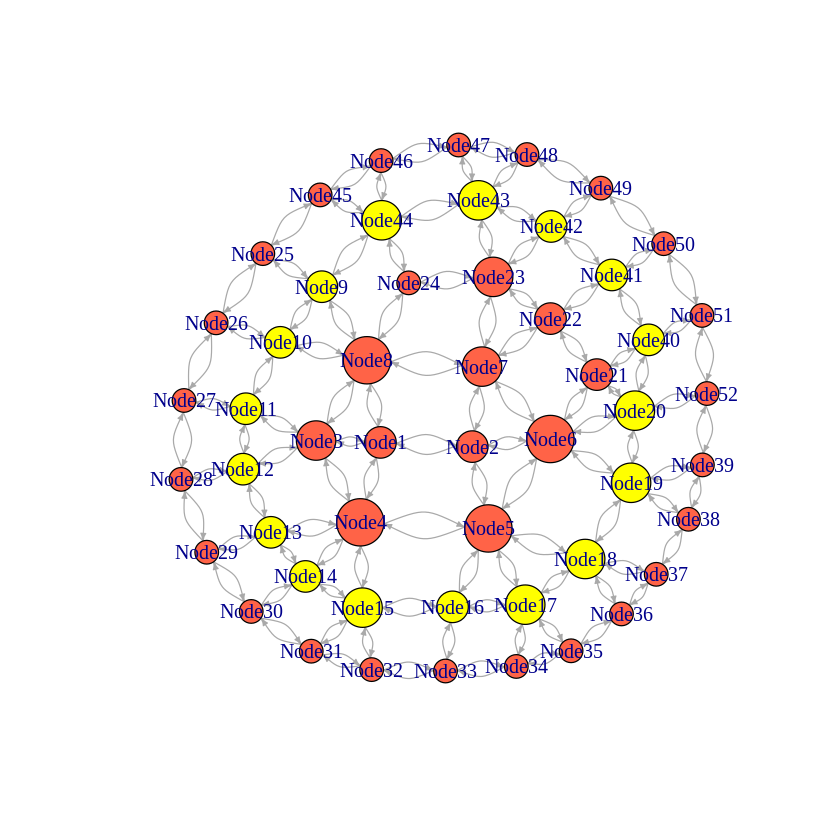

In [ ]:
#plot graph
V(g)$color <- "tomato"
V(g)$color[national_nodes] <- "yellow"


deg <- degree(g, mode="all")
V(g)$size <- deg*1.5
l <- layout.auto(g)
plot(g, edge.arrow.size=.3, vertex.label = V(g)$name, edge.curved=.5, layout=l)

## Total traffic calculatons


In [ ]:

traffic_file$traffic_ps <- traffic_file$trafficGbps*10^9/(8*N)
matrix_traffic <- matrix(0, nrow = length(V(g)), ncol = length(V(g)), dimnames = list(V(g), V(g)))
for (line in 1:nrow(traffic_file))
{
  vertex_source <- which(V(g)$name==traffic_file$sourceID[line])
  vertex_destination<- which(V(g)$name==traffic_file$destinationID[line])
  matrix_traffic[vertex_source, vertex_destination] <- matrix_traffic[vertex_source, vertex_destination] + traffic_file$traffic_ps[line]
}
g <- calc_full_traffic_for_matrix(g, matrix_traffic, N)

print("Total traffic for each link:")
print(paste("Link ",E(g)$Definition,"=",E(g)$Traffic))


[1] "Total traffic for each link:"
  [1] "Link  Node1->Node2 = 0"                 
  [2] "Link  Node1->Node3 = 0"                 
  [3] "Link  Node1->Node4 = 0"                 
  [4] "Link  Node1->Node8 = 238580127.277277"  
  [5] "Link  Node2->Node1 = 0"                 
  [6] "Link  Node2->Node5 = 204961556.766941"  
  [7] "Link  Node2->Node6 = 0"                 
  [8] "Link  Node2->Node7 = 0"                 
  [9] "Link  Node3->Node1 = 0"                 
 [10] "Link  Node3->Node4 = 0"                 
 [11] "Link  Node3->Node8 = 0"                 
 [12] "Link  Node3->Node11 = 183784904.345778" 
 [13] "Link  Node3->Node12 = 0"                
 [14] "Link  Node4->Node1 = 0"                 
 [15] "Link  Node4->Node3 = 0"                 
 [16] "Link  Node4->Node5 = 0"                 
 [17] "Link  Node4->Node13 = 369880450.622403" 
 [18] "Link  Node4->Node14 = 0"                
 [19] "Link  Node4->Node15 = 0"                
 [20] "Link  Node5->Node2 = 22773506.3074379"  
 [21]

## Calculations of the load, average number of packets, queueing and propagation delays:

In [ ]:
E(g)$Load <- ifelse(E(g)$Traffic !=0, E(g)$Traffic/E(g)$Capacity, 0)

In [ ]:
########################load and delays calc
E(g)$Ni = E(g)$Load/(1-E(g)$Load) # average number of packets in each system
#E(g)$Queue_Delay = E(g)$Ni/E(g)$Traffic
E(g)$Queue_Delay <- ifelse(E(g)$Traffic == 0, 0, E(g)$Ni/E(g)$Traffic)
E(g)$Prop_Delay <- 5*10^(-6)*E(g)$Distance

In [ ]:
#av load except zero
load <- dplyr::filter(data_frame(E(g)$Load), data_frame(E(g)$Load) != 0)
prop_delay <- dplyr::filter(data_frame(E(g)$Prop_Delay), data_frame(E(g)$Load) != 0)
capacity <- dplyr::filter(data_frame(E(g)$Capacity), data_frame(E(g)$Load) != 0)
traffic <- dplyr::filter(data_frame(E(g)$Traffic), data_frame(E(g)$Load) != 0)
sourceID = dplyr::filter(data_frame(ends(g, E(g))[,1]), data_frame(E(g)$Load) != 0)
destination = dplyr::filter(data_frame(ends(g, E(g))[,2]), data_frame(E(g)$Load) != 0)
df <- data.frame(sourceID = sourceID$`ends(g, E(g))[, 1]`, destinationID = destination$`ends(g, E(g))[, 2]`,
traffic_ps = traffic$`E(g)$Traffic`, capacity_ps = capacity$`E(g)$Capacity`, load = load$`E(g)$Load`, prop_delay_s = prop_delay$`E(g)$Prop_Delay`)
#safe log file
links_info_df <- df[order(df$load, decreasing = TRUE),]



#Output table with links information: traffic, load, propagation delay

In [ ]:
links_info_df

,sourceID,destinationID,traffic_ps,capacity_ps,load,prop_delay_s
,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>
6,Node5,Node16,426326132,641391043,0.6646899,3e-06
69,Node49,Node42,359342908,543142159,0.6616001,2e-06
4,Node4,Node13,369880451,560031339,0.6604638,3e-06
20,Node14,Node30,55133779,83693261,0.6587601,2e-06
57,Node41,Node50,6147605,9514079,0.6461588,2e-06
36,Node22,Node41,352461765,546091419,0.6454263,3e-06
17,Node12,Node28,25955929,40592270,0.6394303,2e-06
37,Node23,Node42,306705977,484363138,0.6332149,3e-06
21,Node15,Node31,39568685,63571051,0.6224325,2e-06


#Simmer simultion

Including queuing, transmission, propagation delay

In [ ]:
simulation_simmer <- function(g, traffic_file){
  E(g)$Queue_Delay_sim <- 0
  E(g)$Queue_Delay_theor_hoeff99 <- 0
  E(g)$Queue_Delay_sim_99p <- 0

  #####################################simmer
  queue_delay_tr_flow <- c()
  prop_delay_tr_flow <- c()
  delay_tr_flow <- c()
  delay_tr_flow_p_99 <- c()
  exp_delay_igraph <- c()
  delay_tr_flow_hoeffd_p_99_100 <- c()
  digits = 10
  print("start simulation in simmer")
  for (line in 1:nrow(traffic_file))
  {
    print(line)
    #env <- simmer("SuperDuperSim") #creating the simmer environment

    if(traffic_file$sourceID[line] != traffic_file$destinationID[line] && traffic_file$traffic_ps[line] != 0)
    {
      env <- simmer()
      lambda_simmer <- traffic_file$traffic_ps[line]
      set.seed(42)
      env <- simmer_resources(g, env) # add resources for all nodes of igraph (func is in the file simmer_fictions)
      env <- simmer_crosstrajectory_simulation(env, g, traffic_file$sourceID[line], traffic_file$destinationID[line], lambda_simmer) #creating cross trajectories with theirs generator  (func is in the file simmer_fictions)



      c(env, traffic_traj_name, delay_queue, delay_prop) := simmer_simulation(env, traffic_file$sourceID[line], traffic_file$destinationID[line], g, traffic_val=lambda_simmer, log_info = "") #creation main trajectory with its generator


      env %>% #env execution
        run(20000/lambda_simmer) #10000 packets of the main lambda trajectory



      #########################delay results processing
      all_arrivals_res <- data.frame(env %>%
                                       get_mon_arrivals(per_resource = TRUE) %>%
                                       transform(waiting_time_in_queue = round(end_time - start_time - activity_time)) %>%
                                       transform(spending_time = end_time - start_time))


      ############################plots for each node (only with queuing delay)
      ##########computing the bounds and parameters (mean, variance, and etc)
      path <- shortest_paths(g, traffic_file$sourceID[line], traffic_file$destinationID[line] ,weights = NULL, output = "both", algorithm = c("automatic"))
      path_size <- length(path[["vpath"]][[1]])
      n=1
      for (node in path[["vpath"]][[1]][-path_size])
      {
        traffic <- dplyr::filter(all_arrivals_res, paste0("node_", node) == all_arrivals_res$resource)
        if (length(traffic$spending_time) != 0)
        {
          print(node)
          delay_nodes <- mean(traffic$spending_time)
          p_99_result <- unname(quantile(traffic$spending_time, probs = 0.99))
          ####################
          print(paste("Node - ", node, ":"))
          bounds_function_node(delay_queue[node], traffic$spending_time, digits, info = paste("Node - ", node, ";","For the traffic flow:from",traffic_file$sourceID[line],"to", traffic_file$destinationID[line]))#plot the results for each node
          E(g)[get.edge.ids(g, c(path[["vpath"]][[1]][n],path[["vpath"]][[1]][n+1]), multi=TRUE)]$Queue_Delay_sim <- delay_nodes
          E(g)[get.edge.ids(g, c(path[["vpath"]][[1]][n],path[["vpath"]][[1]][n+1]), multi=TRUE)]$Queue_Delay_sim_99p <- p_99_result
          E(g)[get.edge.ids(g, c(path[["vpath"]][[1]][n],path[["vpath"]][[1]][n+1]), multi=TRUE)]$Queue_Delay_theor_hoeff99 <- func_bounds_hoeffding(delay_queue[node], 0.99,delay_queue[node], 0, 0.99)

          print(E(g)[get.edge.ids(g, c(path[["vpath"]][[1]][n],path[["vpath"]][[1]][n+1]), multi=TRUE)])
          n=n+1

        }

      }

      ###########################plots for each traffic flow (prop + queuing delays)
      #########################delay results processing
      all_arrivals_res <- data.frame(env %>%
                                       get_mon_arrivals(per_resource = FALSE) %>%
                                       transform(waiting_time_in_queue = round(end_time - start_time - activity_time)) %>%
                                       transform(spending_time = end_time - start_time))
      traffic <- dplyr::filter(all_arrivals_res, grepl(traffic_traj_name , all_arrivals_res$name))
      exp_delay = sum(delay_prop,delay_queue)
      exp_delay_igraph <- append(exp_delay_igraph,exp_delay)

      bounds_function_1w_path(sum(delay_prop), sum(delay_queue), traffic$spending_time, digits, info = paste("For the traffic flow:from",traffic_file$sourceID[line],"to", traffic_file$destinationID[line]))#plot the results for tr flow
      queue_delay_tr_flow <- append(queue_delay_tr_flow, sum(delay_queue))
      prop_delay_tr_flow <- append(prop_delay_tr_flow, sum(delay_prop))
      delay_tr_flow <- append(delay_tr_flow, mean(traffic$spending_time))
      delay_tr_flow_p_99 <- append(delay_tr_flow_p_99, unname(quantile(traffic$spending_time, probs = 0.99)))
      hoeff <- func_bounds_hoeffding(sum(delay_queue, delay_prop), 0.99, delay_queue, delay_prop, 0.99)
      delay_tr_flow_hoeffd_p_99_100 <- append(delay_tr_flow_hoeffd_p_99_100, hoeff)

    } else{
      print("no info of traffic")
      exp_delay_igraph <- append(exp_delay_igraph,0)
      queue_delay_tr_flow <- append(queue_delay_tr_flow, 0)
      prop_delay_tr_flow <- append(prop_delay_tr_flow, NaN)
      delay_tr_flow <- append(delay_tr_flow, 0)
      delay_tr_flow_p_99 <- append(delay_tr_flow_p_99, 0)
      delay_tr_flow_hoeffd_p_99_100 <- append(delay_tr_flow_hoeffd_p_99_100, 0)
      print(delay_tr_flow)
    }
  }


  df <- data_frame(exp_delay_igraph, delay_tr_flow, delay_tr_flow_p_99, delay_tr_flow_hoeffd_p_99_100)

  return(list(delay_tr_flow, exp_delay_igraph, delay_tr_flow_p_99, delay_tr_flow_hoeffd_p_99_100, g))
}



##Simulation of all traffic flows, comparision of experimental with theretical

[1] "start simulation in simmer"
[1] 1
[1] "node_8"
[1] 1559380856
[1] 0.5096308
[1] 556128347
+ 1/202 edge from edd41aa (vertex names):
[1] Node1->Node8
+ 1/202 edge from edd41aa (vertex names):
[1] Node8->Node9
[1] "traffic_Node1_Node9_"
[1] 1
[1] "Node -  1 :"
[1] "variance= 1.72490615223489e-17"
[1] "sigma2= 4.15319895048972e-09"
[1] "igraph E(T) = 4.33854487246831e-09"
[1] "simmer E(T) = 4.27104095416573e-09"
+ 1/202 edge from edd41aa (vertex names):
[1] Node1->Node8
[1] 8
[1] "Node -  8 :"
[1] "variance= 1.64066320425542e-18"
[1] "sigma2= 1.28088375907239e-09"
[1] "igraph E(T) = 1.30774959792856e-09"
[1] "simmer E(T) = 1.28911313152336e-09"


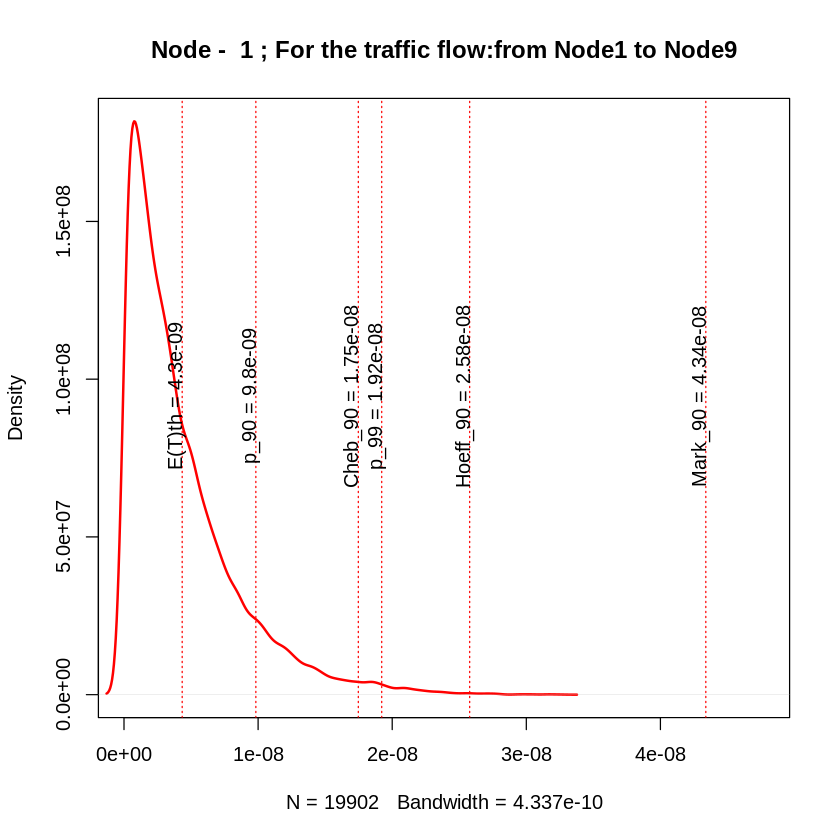

+ 1/202 edge from edd41aa (vertex names):
[1] Node8->Node9
[1] "variance= 1.8830073087874e-17"
[1] "sigma2= 4.33936321225523e-09"
[1] "igraph E(T) = 8.0056462944704e-06"
[1] "simmer E(T) = 8.00553938074551e-06"


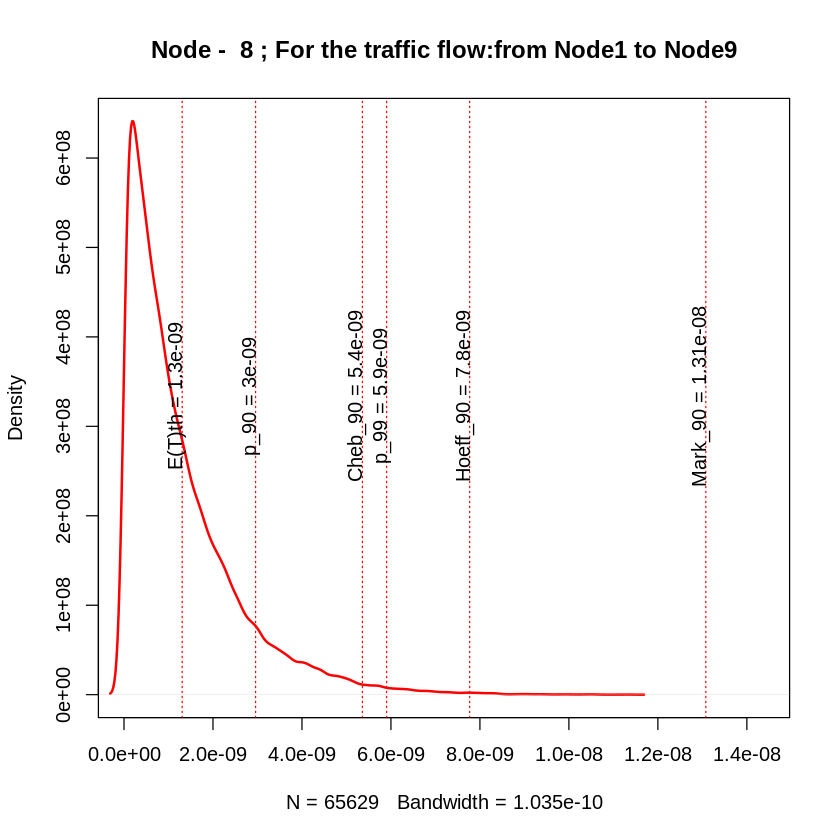

[1] 2
[1] "node_5"
[1] 641391043
[1] 0.6646899
[1] 221364575
+ 1/202 edge from edd41aa (vertex names):
[1] Node2->Node5
+ 1/202 edge from edd41aa (vertex names):
[1] Node5->Node16
[1] "traffic_Node2_Node16_"
[1] 2
[1] "Node -  2 :"
[1] "variance= 1.12973784999675e-17"
[1] "sigma2= 3.36115731556372e-09"
[1] "igraph E(T) = 3.50392996298468e-09"
[1] "simmer E(T) = 3.45275258571449e-09"


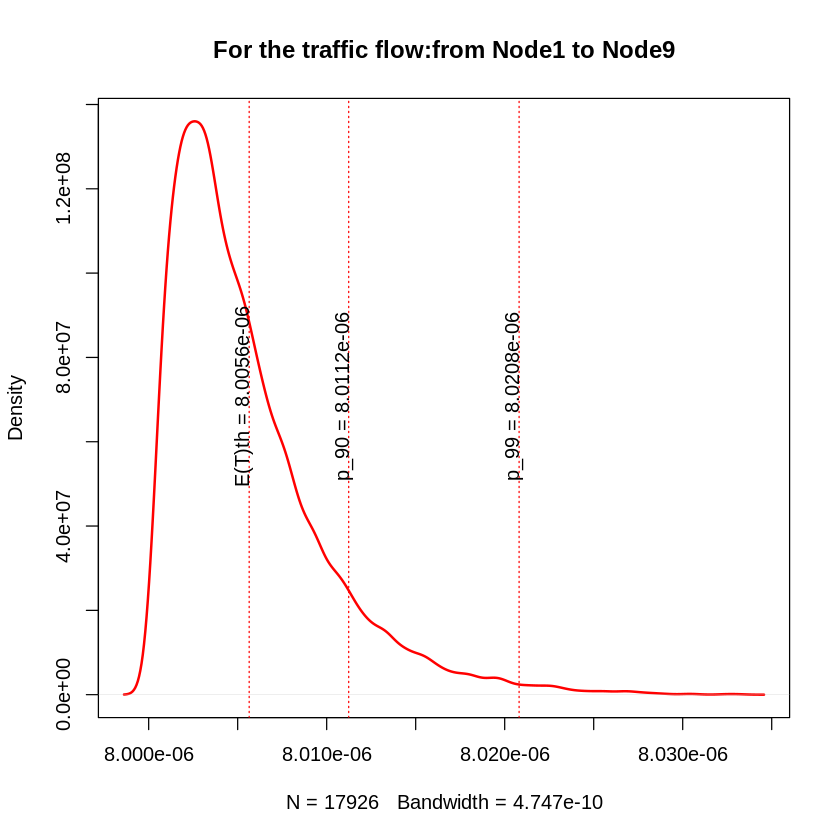

+ 1/202 edge from edd41aa (vertex names):
[1] Node2->Node5
[1] 5
[1] "Node -  5 :"
[1] "variance= 2.14091677619565e-17"
[1] "sigma2= 4.62700418866857e-09"
[1] "igraph E(T) = 4.64975897070471e-09"
[1] "simmer E(T) = 4.6824289360944e-09"


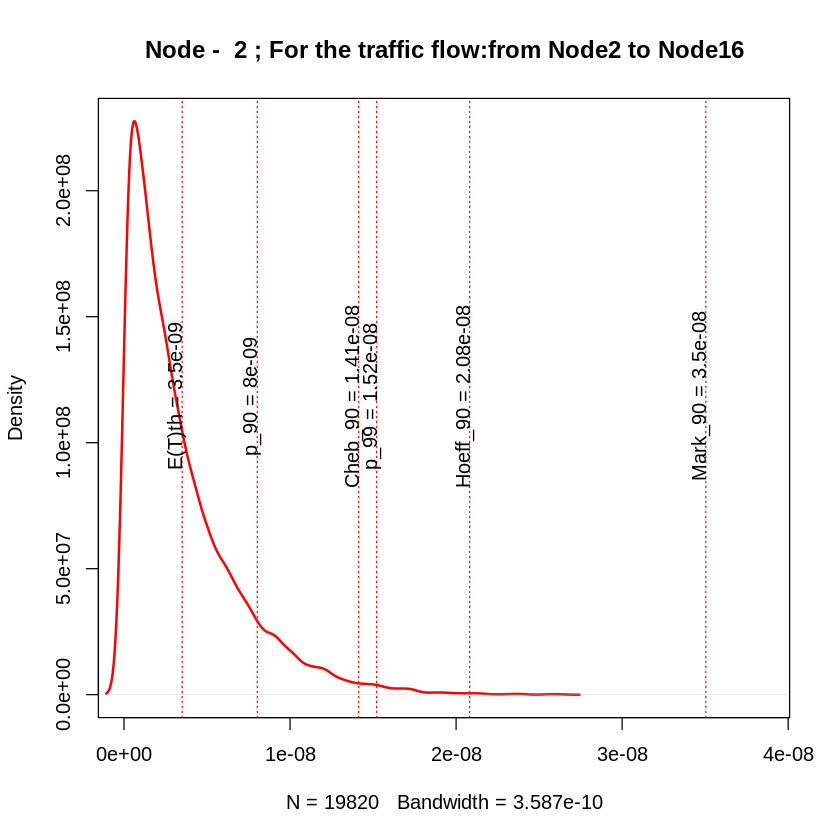

+ 1/202 edge from edd41aa (vertex names):
[1] Node5->Node16
[1] "variance= 3.13741660982442e-17"
[1] "sigma2= 5.60126468739375e-09"
[1] "igraph E(T) = 8.00815368893369e-06"
[1] "simmer E(T) = 8.00818413357149e-06"


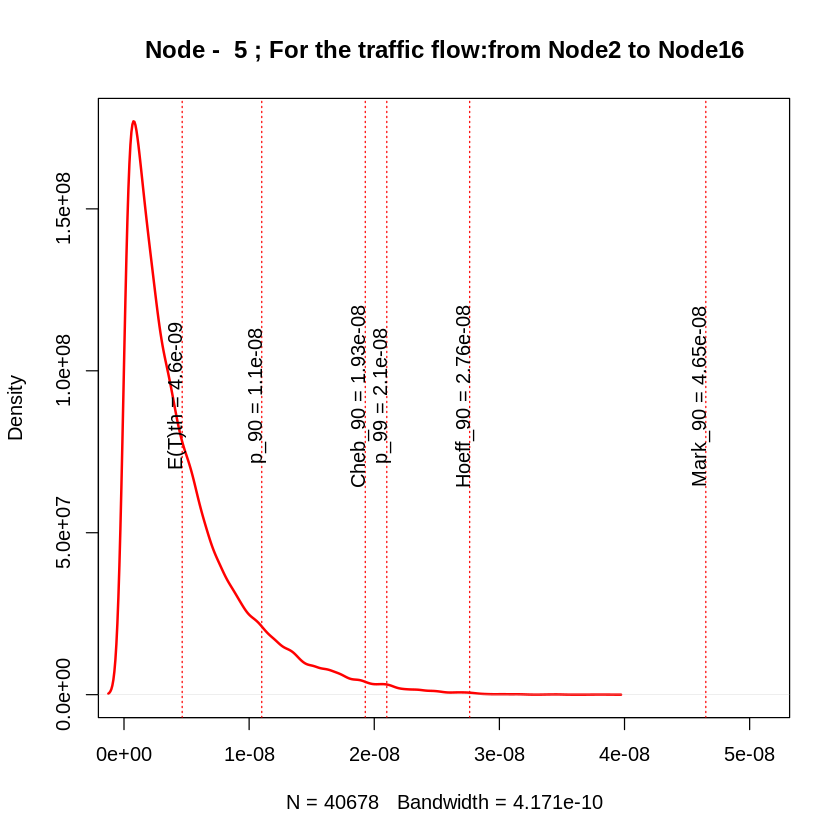

[1] 3
+ 1/202 edge from edd41aa (vertex names):
[1] Node3->Node11
[1] "traffic_Node3_Node11_"
[1] 3
[1] "Node -  3 :"
[1] "variance= 4.069516299723e-17"
[1] "sigma2= 6.37927605588832e-09"
[1] "igraph E(T) = 5.89497706373012e-09"
[1] "simmer E(T) = 6.1505218235801e-09"


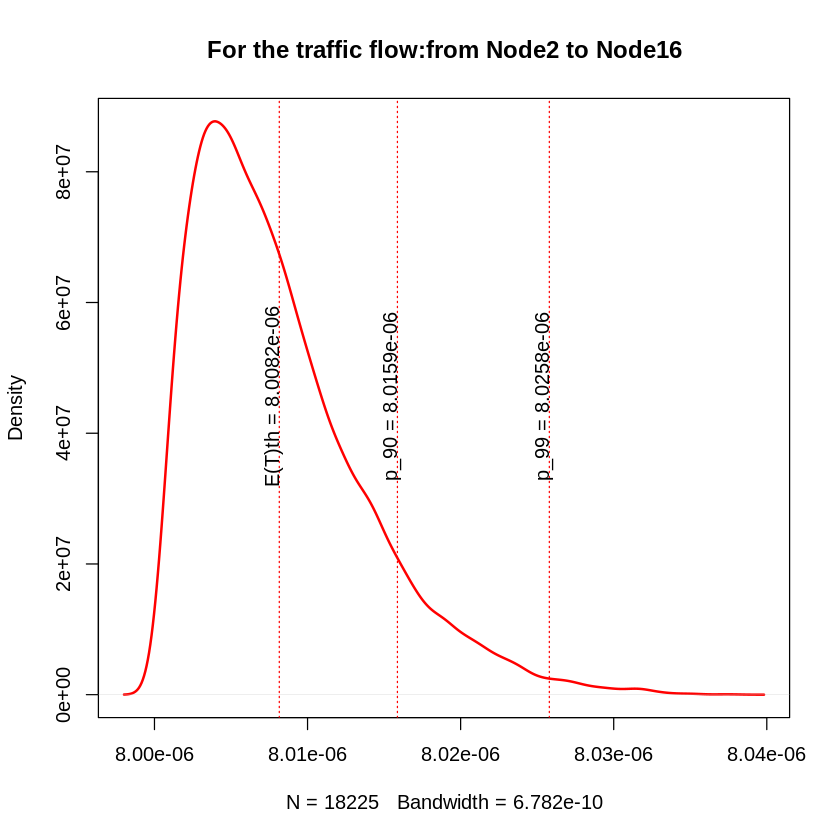

+ 1/202 edge from edd41aa (vertex names):
[1] Node3->Node11
[1] "variance= 4.00759789967566e-17"
[1] "sigma2= 6.33055913776631e-09"
[1] "igraph E(T) = 3.00589497706373e-06"
[1] "simmer E(T) = 3.00611079611431e-06"


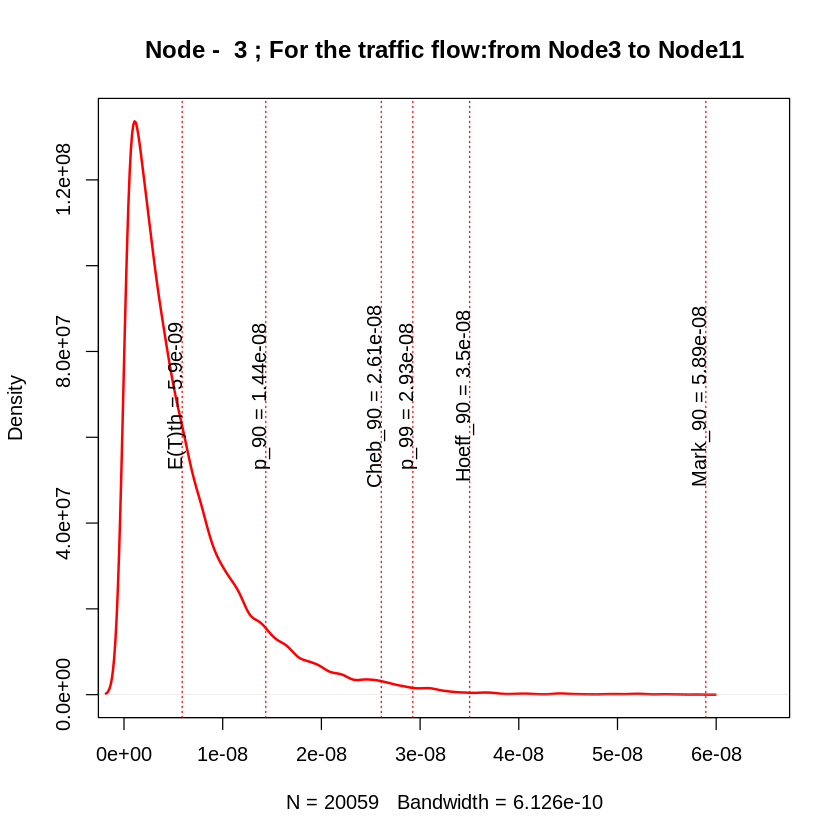

[1] 4
+ 1/202 edge from edd41aa (vertex names):
[1] Node4->Node13
[1] "traffic_Node4_Node13_"
[1] 4
[1] "Node -  4 :"
[1] "variance= 3.09259807644607e-17"
[1] "sigma2= 5.56111326664551e-09"
[1] "igraph E(T) = 5.2589814712843e-09"
[1] "simmer E(T) = 5.44572882587558e-09"


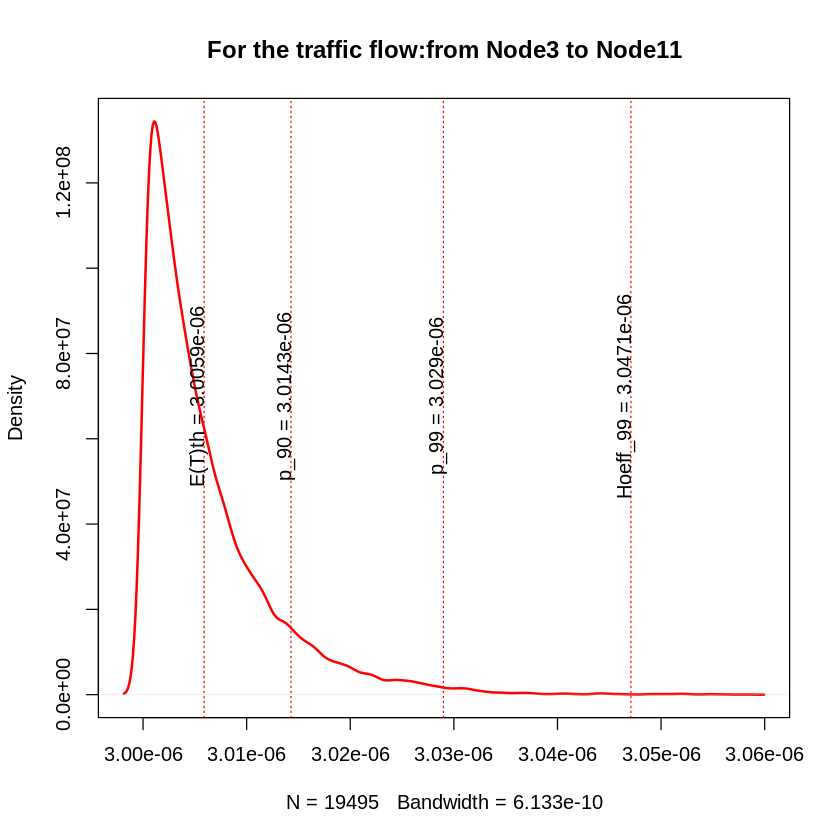

+ 1/202 edge from edd41aa (vertex names):
[1] Node4->Node13
[1] "variance= 2.93482403881785e-17"
[1] "sigma2= 5.41740162699596e-09"
[1] "igraph E(T) = 3.00525898147128e-06"
[1] "simmer E(T) = 3.0053494055689e-06"


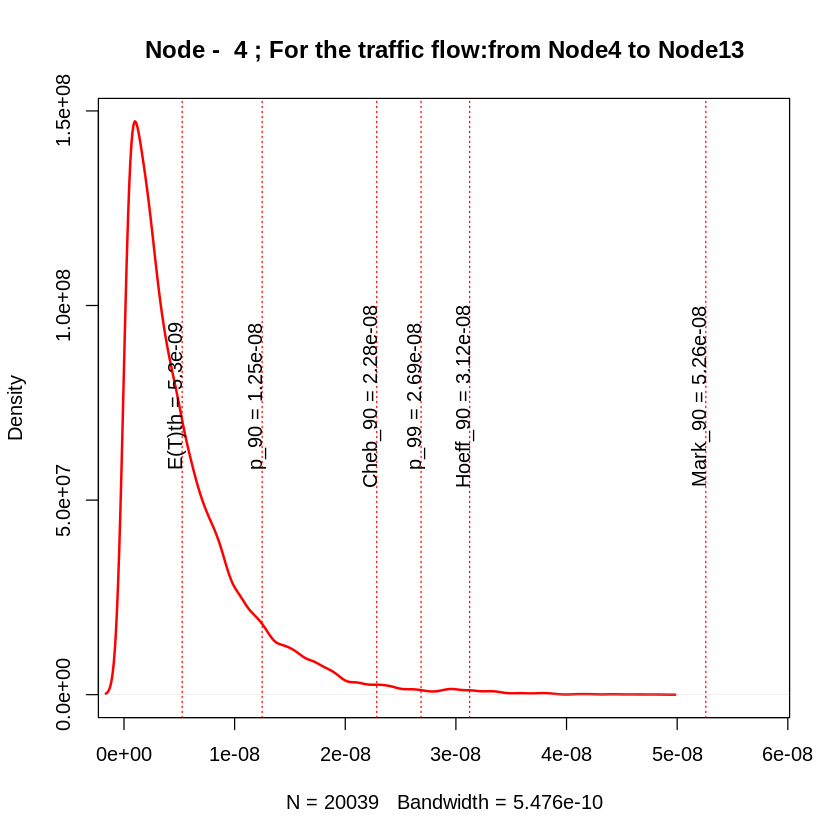

[1] 5
[1] "node_5"
[1] 641391043
[1] 0.6646899
[1] 204961557
+ 1/202 edge from edd41aa (vertex names):
[1] Node5->Node16
[1] "traffic_Node5_Node16_"
[1] 5
[1] "Node -  5 :"
[1] "variance= 2.1288298014219e-17"
[1] "sigma2= 4.6139243615624e-09"
[1] "igraph E(T) = 4.64975897070471e-09"
[1] "simmer E(T) = 4.65677839640533e-09"


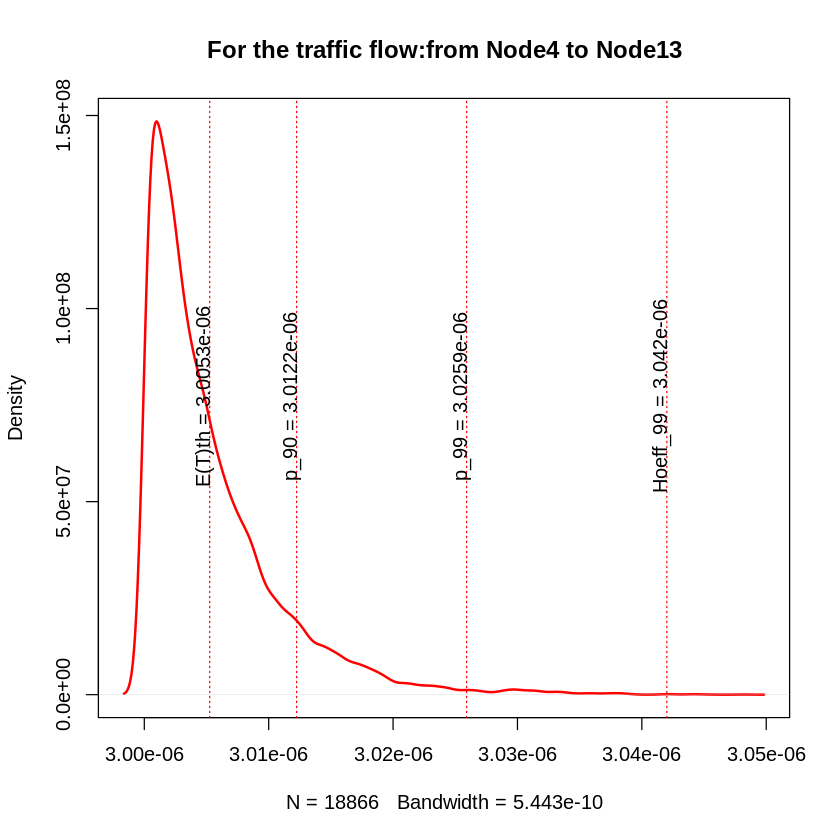

+ 1/202 edge from edd41aa (vertex names):
[1] Node5->Node16
[1] "variance= 2.11081923428868e-17"
[1] "sigma2= 4.59436528183021e-09"
[1] "igraph E(T) = 3.0046497589707e-06"
[1] "simmer E(T) = 3.00461589097587e-06"


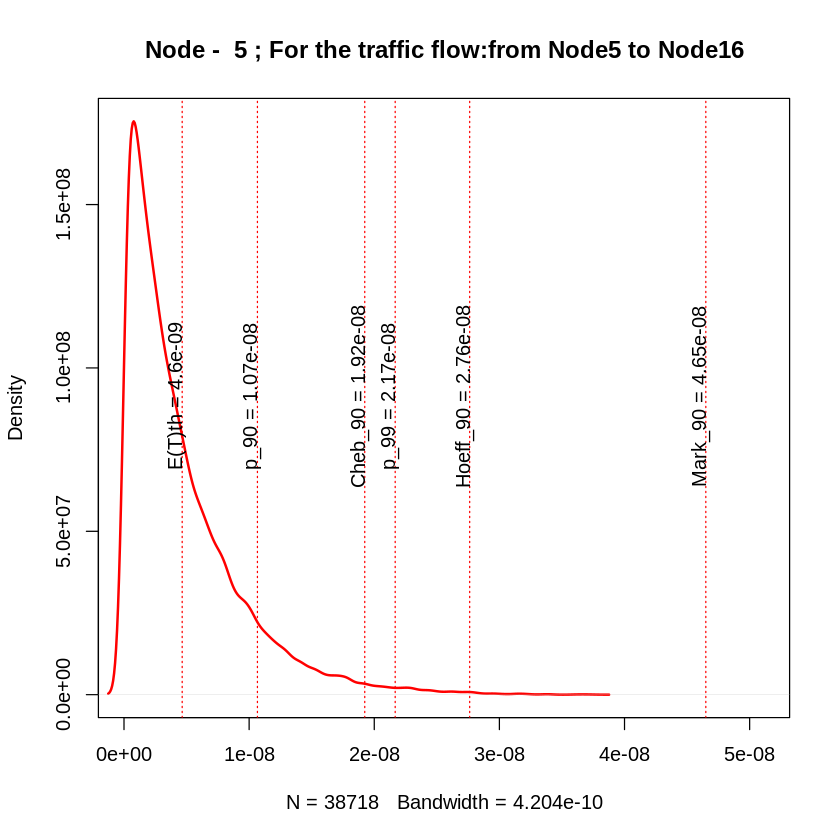

[1] 6
+ 1/202 edge from edd41aa (vertex names):
[1] Node6->Node19
[1] "traffic_Node6_Node19_"
[1] 6
[1] "Node -  6 :"
[1] "variance= 1.03164313120785e-17"
[1] "sigma2= 3.21192019080153e-09"
[1] "igraph E(T) = 3.01735811614548e-09"
[1] "simmer E(T) = 3.09253003876377e-09"


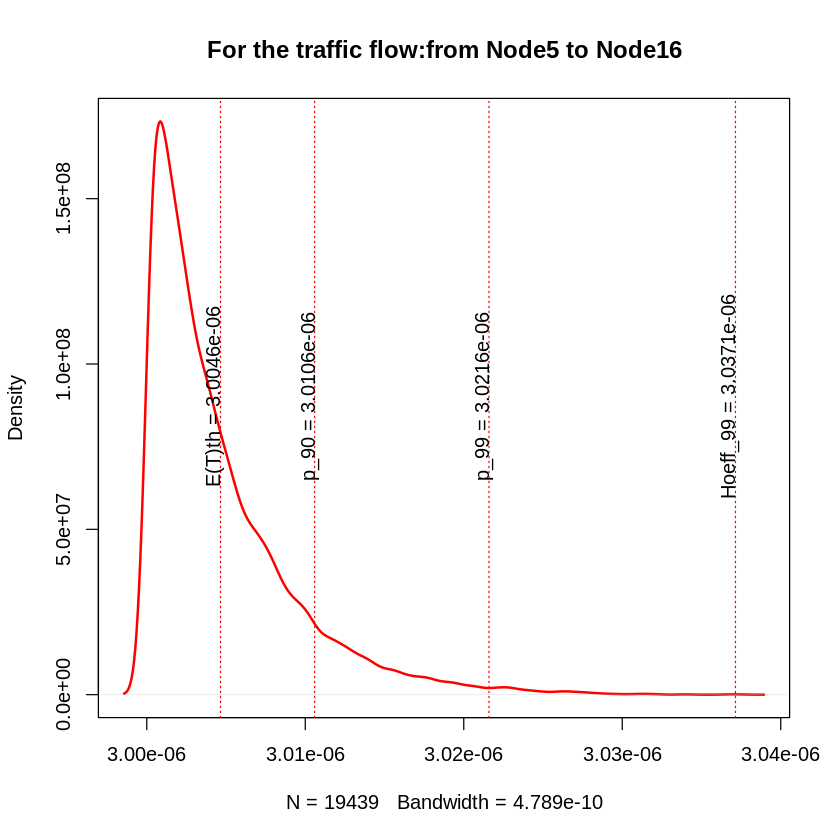

+ 1/202 edge from edd41aa (vertex names):
[1] Node6->Node19
[1] "variance= 1.01297807201506e-17"
[1] "sigma2= 3.18273164438201e-09"
[1] "igraph E(T) = 3.00301735811615e-06"
[1] "simmer E(T) = 3.00306244206074e-06"


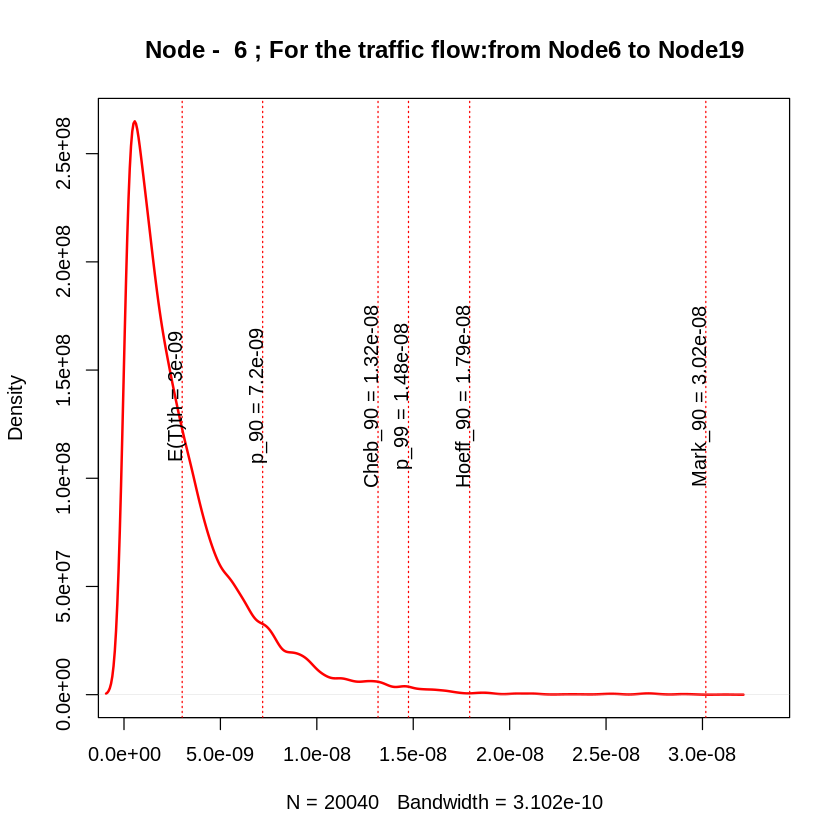

[1] 7
[1] "node_8"
[1] 1559380856
[1] 0.5096308
[1] 473554637
+ 1/202 edge from edd41aa (vertex names):
[1] Node7->Node8
+ 1/202 edge from edd41aa (vertex names):
[1] Node8->Node9
[1] "traffic_Node7_Node9_"
[1] 7
[1] "Node -  7 :"
[1] "variance= 5.07974084907135e-18"
[1] "sigma2= 2.25382804336785e-09"
[1] "igraph E(T) = 2.20502979988337e-09"
[1] "simmer E(T) = 2.20108442214996e-09"


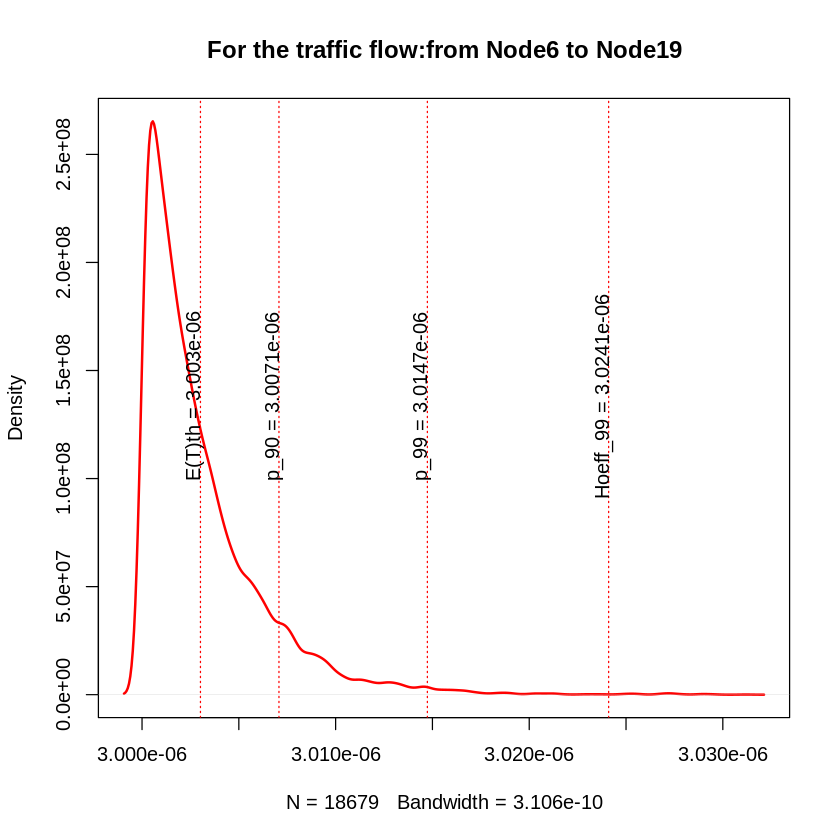

+ 1/202 edge from edd41aa (vertex names):
[1] Node7->Node8
[1] 8
[1] "Node -  8 :"
[1] "variance= 1.81104762246819e-18"
[1] "sigma2= 1.34575169420967e-09"
[1] "igraph E(T) = 1.30774959792856e-09"
[1] "simmer E(T) = 1.31436750738834e-09"


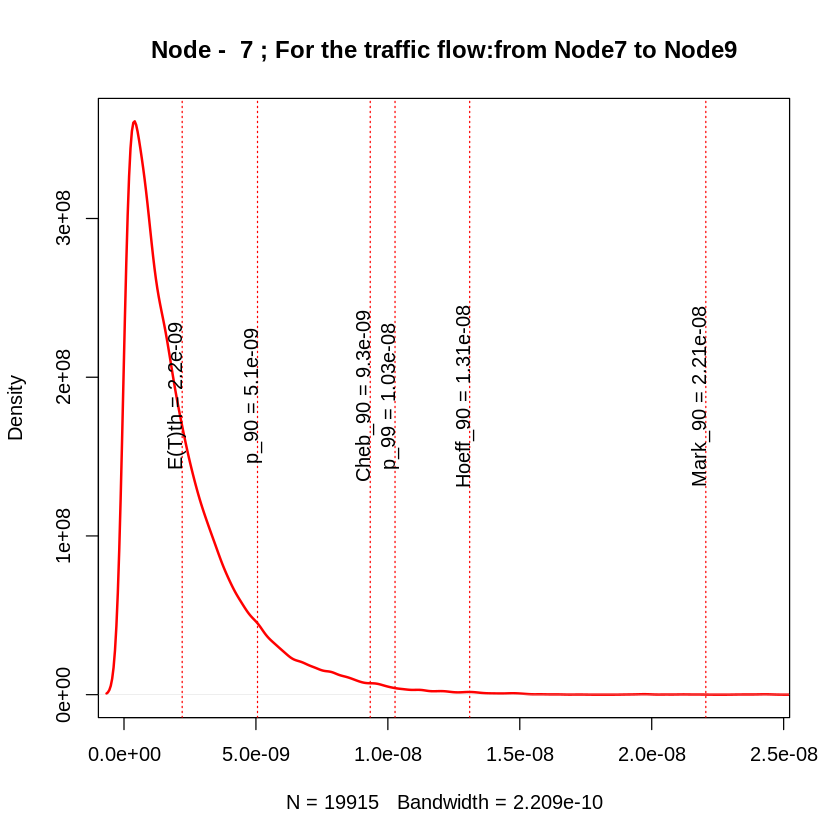

+ 1/202 edge from edd41aa (vertex names):
[1] Node8->Node9
[1] "variance= 6.90899330722364e-18"
[1] "sigma2= 2.62849639665411e-09"
[1] "igraph E(T) = 7.00351277939781e-06"
[1] "simmer E(T) = 7.00353941390884e-06"


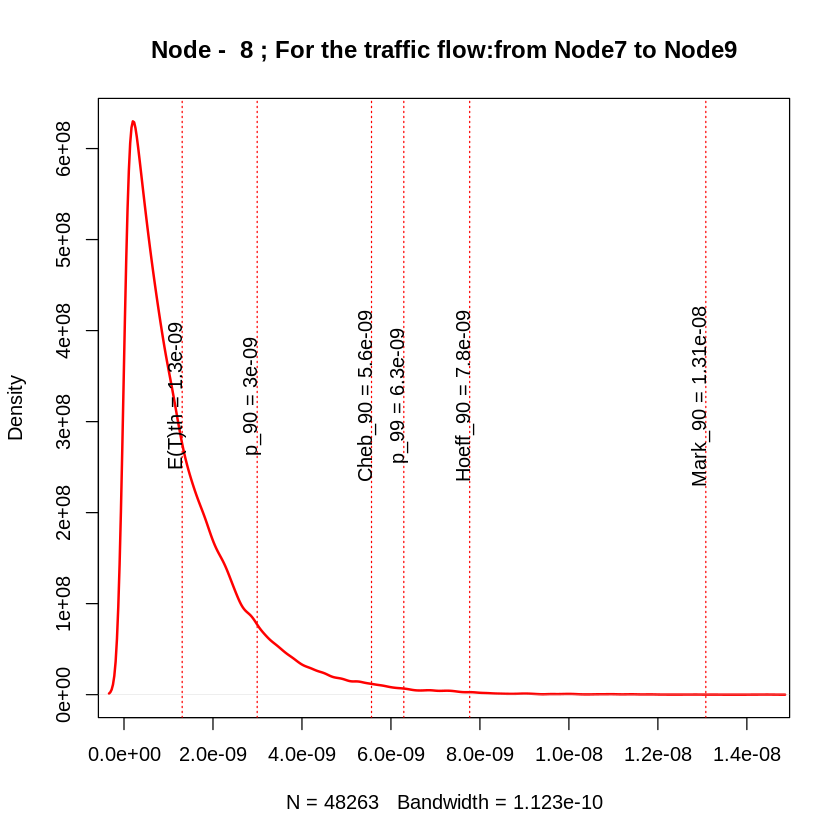

[1] 8
[1] "node_8"
[1] 1559380856
[1] 0.5096308
[1] 559733964
+ 1/202 edge from edd41aa (vertex names):
[1] Node8->Node9
[1] "traffic_Node8_Node9_"
[1] 8
[1] "Node -  8 :"
[1] "variance= 1.80230823841855e-18"
[1] "sigma2= 1.34250074056536e-09"
[1] "igraph E(T) = 1.30774959792856e-09"
[1] "simmer E(T) = 1.31974799114536e-09"


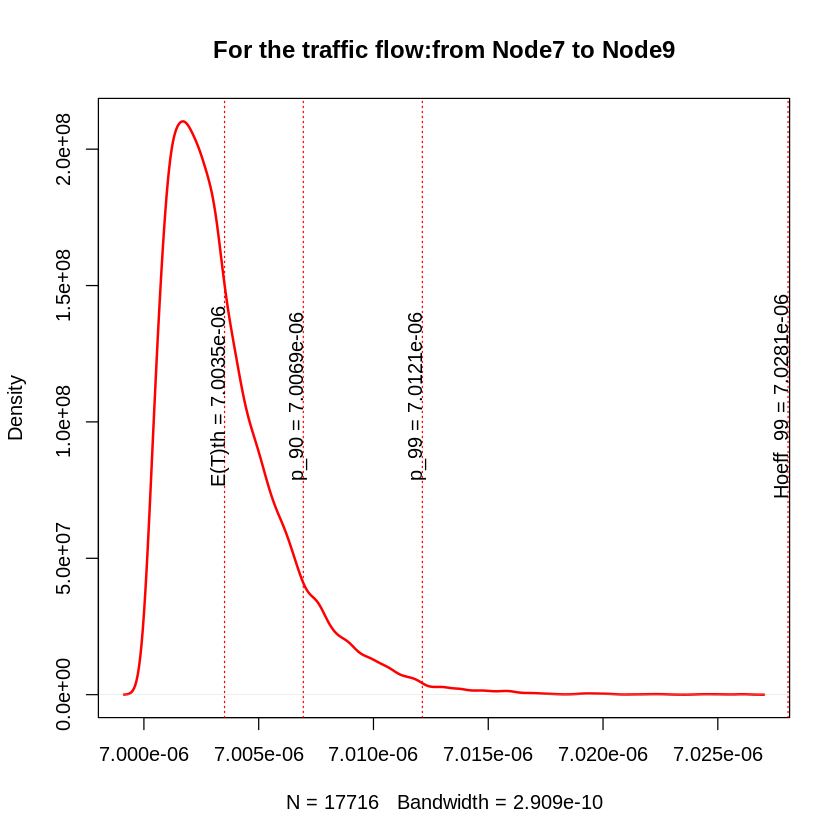

+ 1/202 edge from edd41aa (vertex names):
[1] Node8->Node9
[1] "variance= 1.69476867319606e-18"
[1] "sigma2= 1.30183281307396e-09"
[1] "igraph E(T) = 3.00130774959793e-06"
[1] "simmer E(T) = 3.00129919808449e-06"


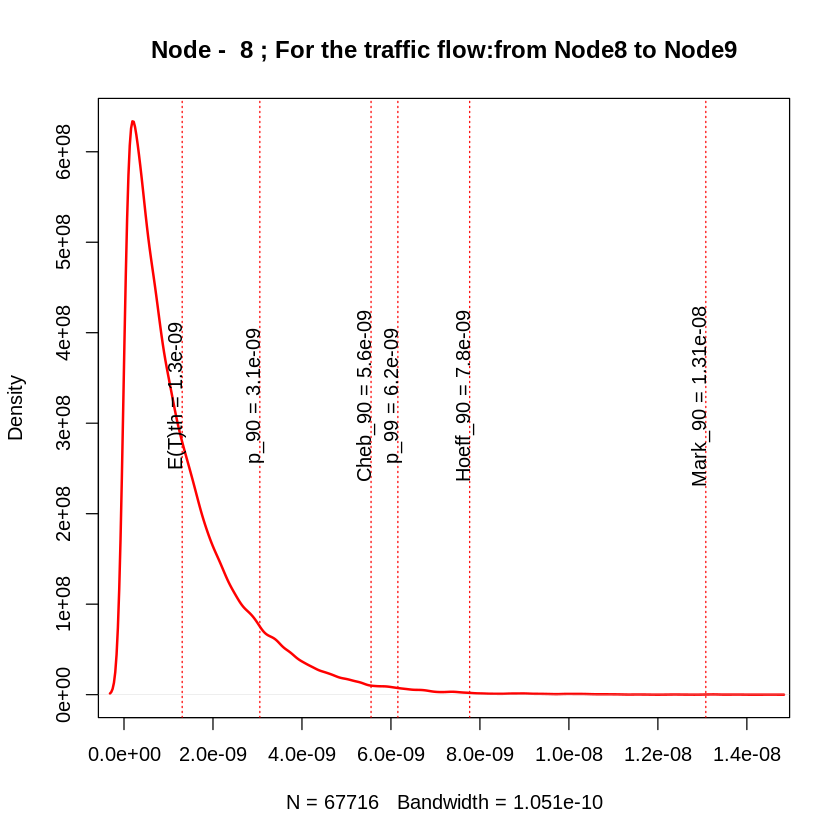

[1] 9
[1] "no info of traffic"
[1] 8.005539e-06 8.008184e-06 3.006111e-06 3.005349e-06 3.004616e-06
[6] 3.003062e-06 7.003539e-06 3.001299e-06 0.000000e+00
[1] 10
[1] "no info of traffic"
 [1] 8.005539e-06 8.008184e-06 3.006111e-06 3.005349e-06 3.004616e-06
 [6] 3.003062e-06 7.003539e-06 3.001299e-06 0.000000e+00 0.000000e+00
[1] 11
[1] "no info of traffic"
 [1] 8.005539e-06 8.008184e-06 3.006111e-06 3.005349e-06 3.004616e-06
 [6] 3.003062e-06 7.003539e-06 3.001299e-06 0.000000e+00 0.000000e+00
[11] 0.000000e+00
[1] 12
[1] "no info of traffic"
 [1] 8.005539e-06 8.008184e-06 3.006111e-06 3.005349e-06 3.004616e-06
 [6] 3.003062e-06 7.003539e-06 3.001299e-06 0.000000e+00 0.000000e+00
[11] 0.000000e+00 0.000000e+00
[1] 13
[1] "no info of traffic"
 [1] 8.005539e-06 8.008184e-06 3.006111e-06 3.005349e-06 3.004616e-06
 [6] 3.003062e-06 7.003539e-06 3.001299e-06 0.000000e+00 0.000000e+00
[11] 0.000000e+00 0.000000e+00 0.000000e+00
[1] 14
[1] "no info of traffic"
 [1] 8.005539e-06 8.008184e-06 

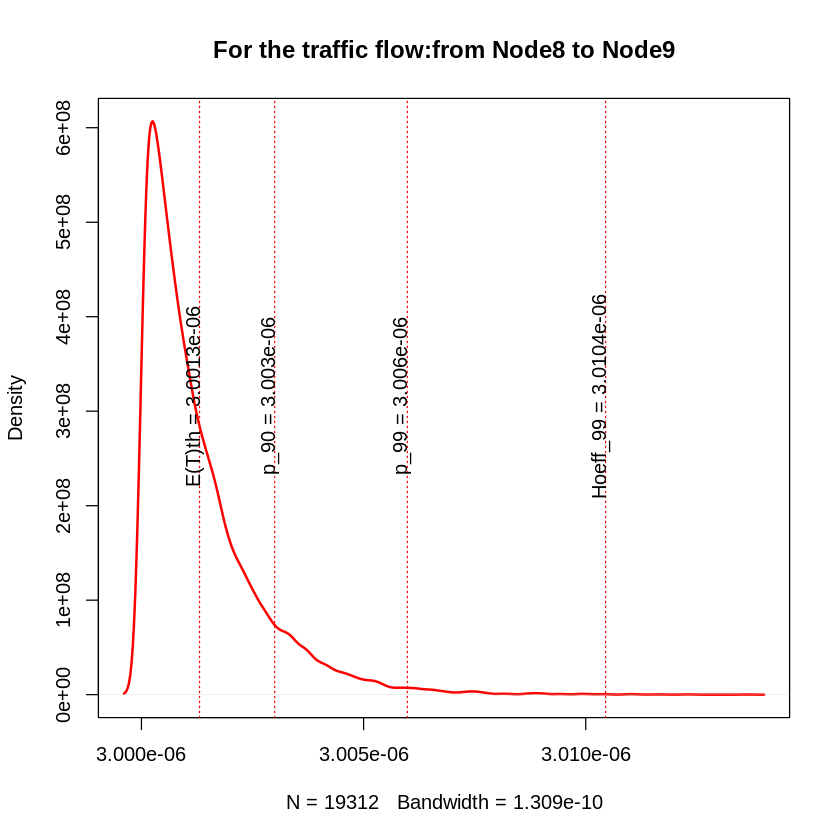

+ 1/202 edge from edd41aa (vertex names):
[1] Node20->Node19
[1] "variance= 2.79827088879255e-18"
[1] "sigma2= 1.67280330248136e-09"
[1] "igraph E(T) = 3.00167402245587e-06"
[1] "simmer E(T) = 3.00168885559707e-06"


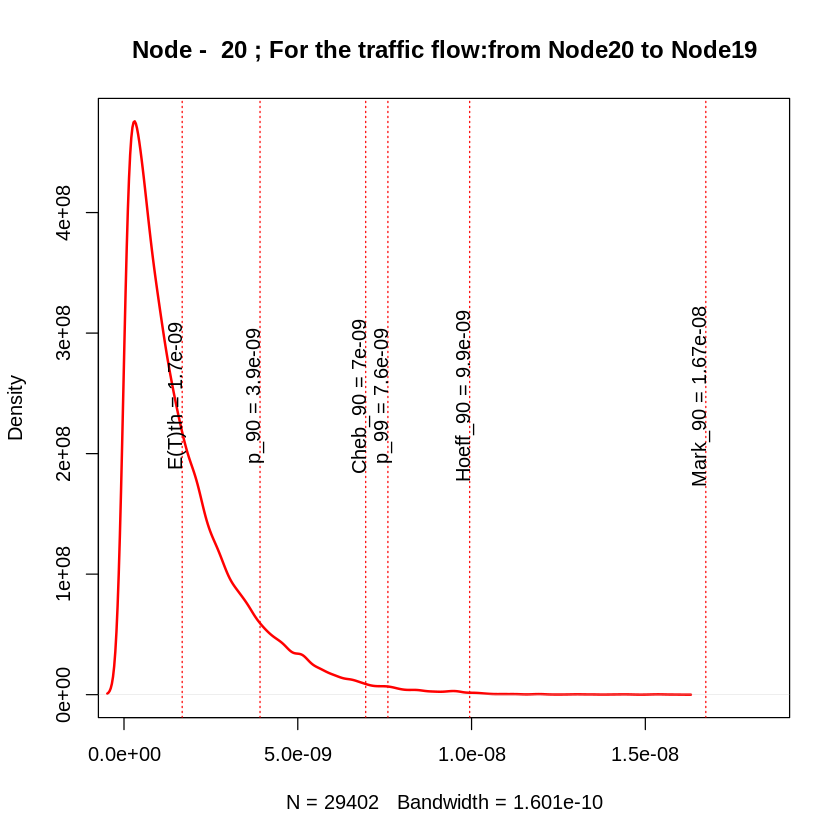

[1] 21
+ 1/202 edge from edd41aa (vertex names):
[1] Node21->Node40
[1] "traffic_Node21_Node40_"
[1] 21
[1] "Node -  21 :"
[1] "variance= 5.38648450135265e-18"
[1] "sigma2= 2.32088011352432e-09"
[1] "igraph E(T) = 2.22708607125196e-09"
[1] "simmer E(T) = 2.26655352566725e-09"


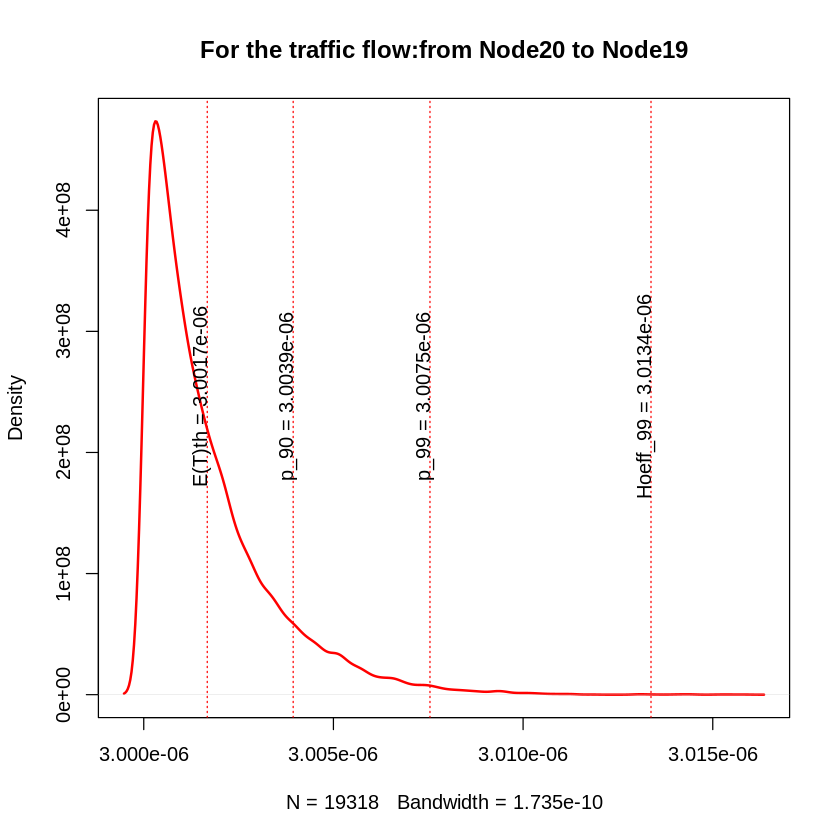

+ 1/202 edge from edd41aa (vertex names):
[1] Node21->Node40
[1] "variance= 5.44063376073038e-18"
[1] "sigma2= 2.33251661531711e-09"
[1] "igraph E(T) = 3.00222708607125e-06"
[1] "simmer E(T) = 3.0022729883446e-06"


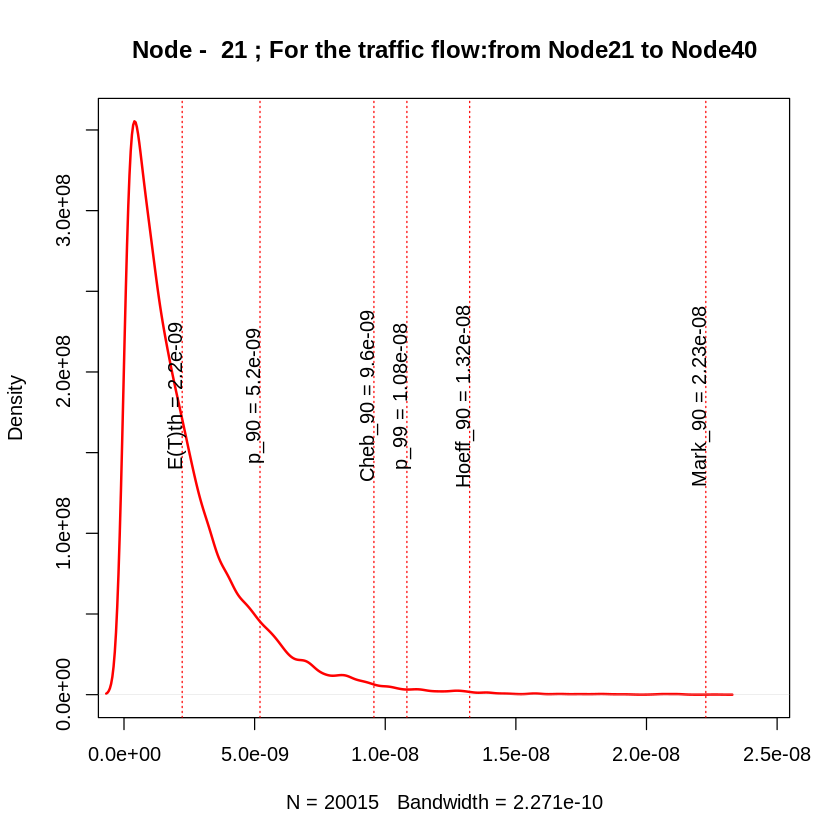

[1] 22
+ 1/202 edge from edd41aa (vertex names):
[1] Node22->Node41
[1] "traffic_Node22_Node41_"
[1] 22
[1] "Node -  22 :"
[1] "variance= 2.9850405102122e-17"
[1] "sigma2= 5.46355242512799e-09"
[1] "igraph E(T) = 5.16449820616992e-09"
[1] "simmer E(T) = 5.30542291184968e-09"


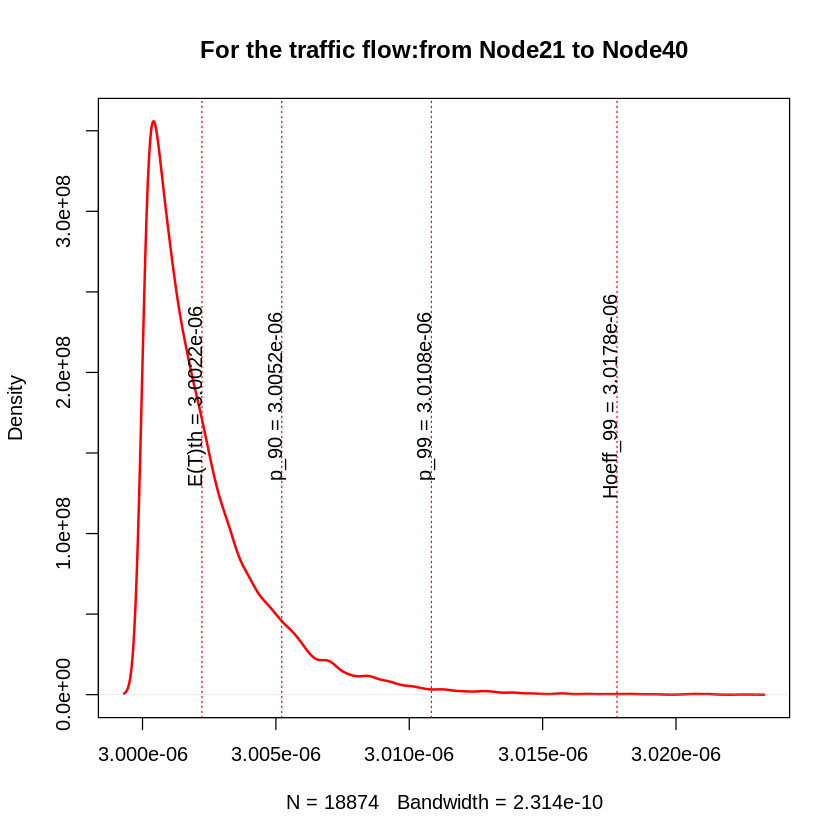

+ 1/202 edge from edd41aa (vertex names):
[1] Node22->Node41
[1] "variance= 2.85249962744341e-17"
[1] "sigma2= 5.34087972851235e-09"
[1] "igraph E(T) = 3.00516449820617e-06"
[1] "simmer E(T) = 3.00524161181924e-06"


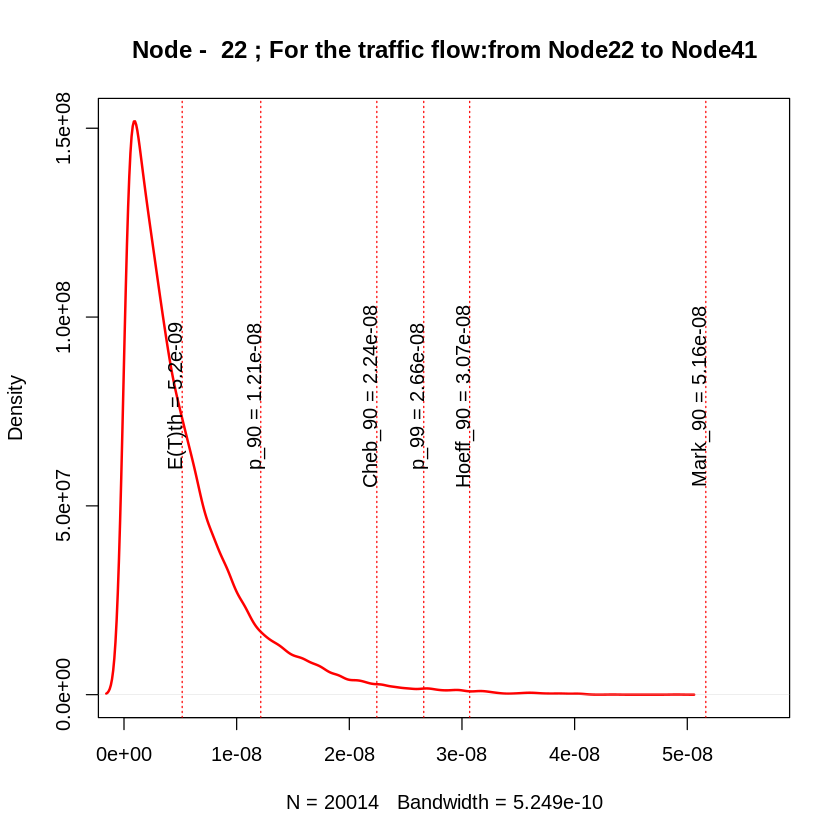

[1] 23
+ 1/202 edge from edd41aa (vertex names):
[1] Node23->Node42
[1] "traffic_Node23_Node42_"
[1] 23
[1] "Node -  23 :"
[1] "variance= 3.09688465339079e-17"
[1] "sigma2= 5.56496599575486e-09"
[1] "igraph E(T) = 5.62881898322217e-09"
[1] "simmer E(T) = 5.61559741304321e-09"


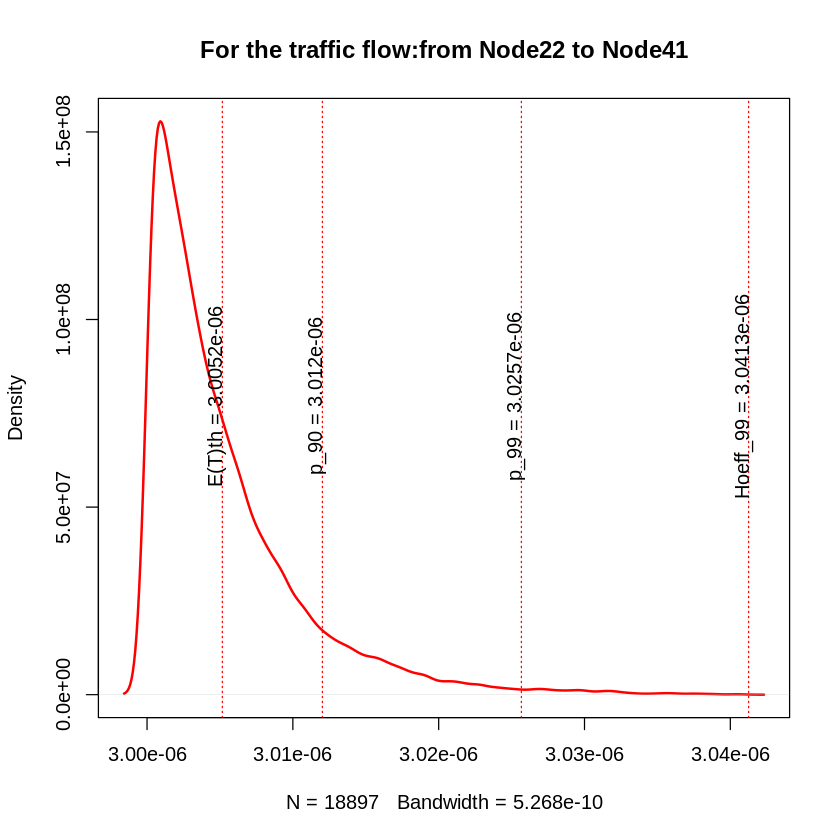

+ 1/202 edge from edd41aa (vertex names):
[1] Node23->Node42
[1] "variance= 3.06535622954238e-17"
[1] "sigma2= 5.53656592983627e-09"
[1] "igraph E(T) = 3.00562881898322e-06"
[1] "simmer E(T) = 3.0056046411405e-06"


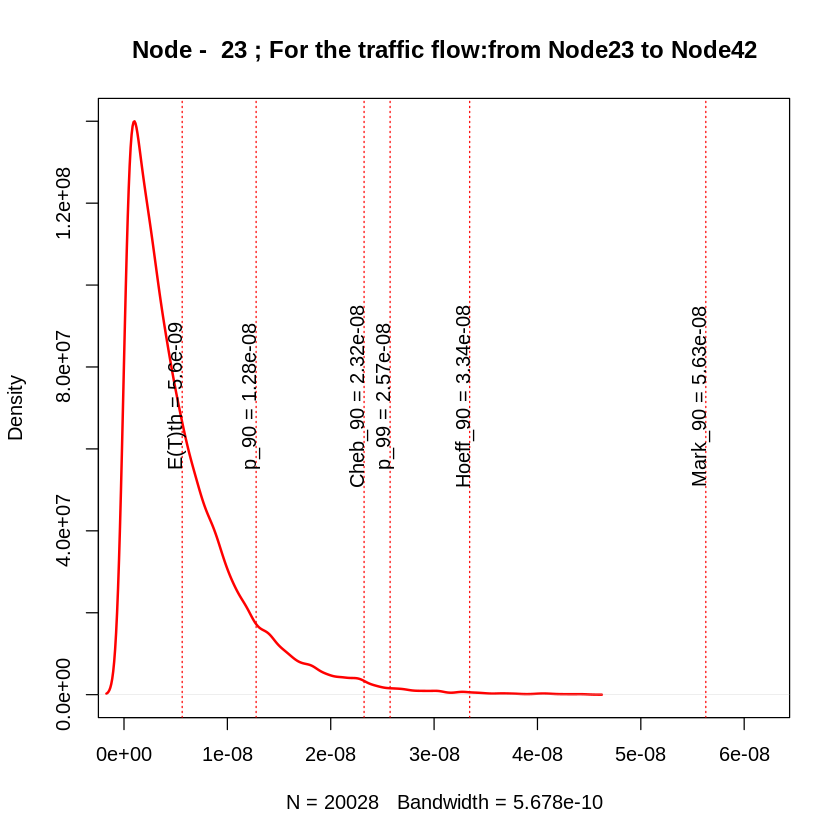

[1] 24
+ 1/202 edge from edd41aa (vertex names):
[1] Node24->Node44
[1] "traffic_Node24_Node44_"
[1] 24
[1] "Node -  24 :"
[1] "variance= 1.04940969535553e-17"
[1] "sigma2= 3.23945936130635e-09"
[1] "igraph E(T) = 3.16085449531728e-09"
[1] "simmer E(T) = 3.24712869142061e-09"


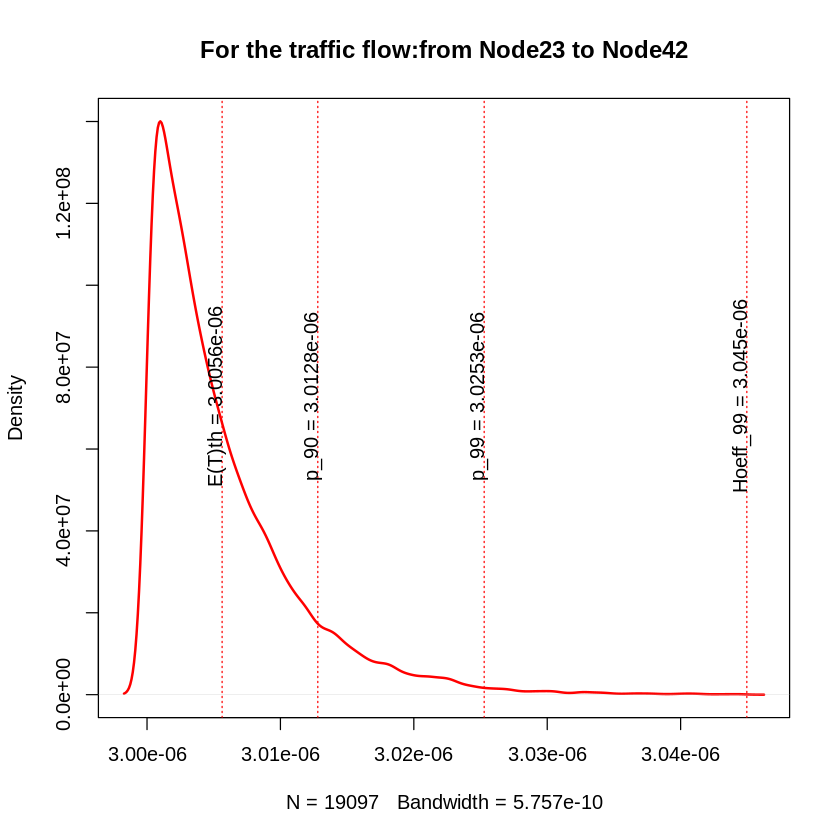

+ 1/202 edge from edd41aa (vertex names):
[1] Node24->Node44
[1] "variance= 1.03566781644151e-17"
[1] "sigma2= 3.21817932446517e-09"
[1] "igraph E(T) = 3.00316085449532e-06"
[1] "simmer E(T) = 3.00323893076569e-06"


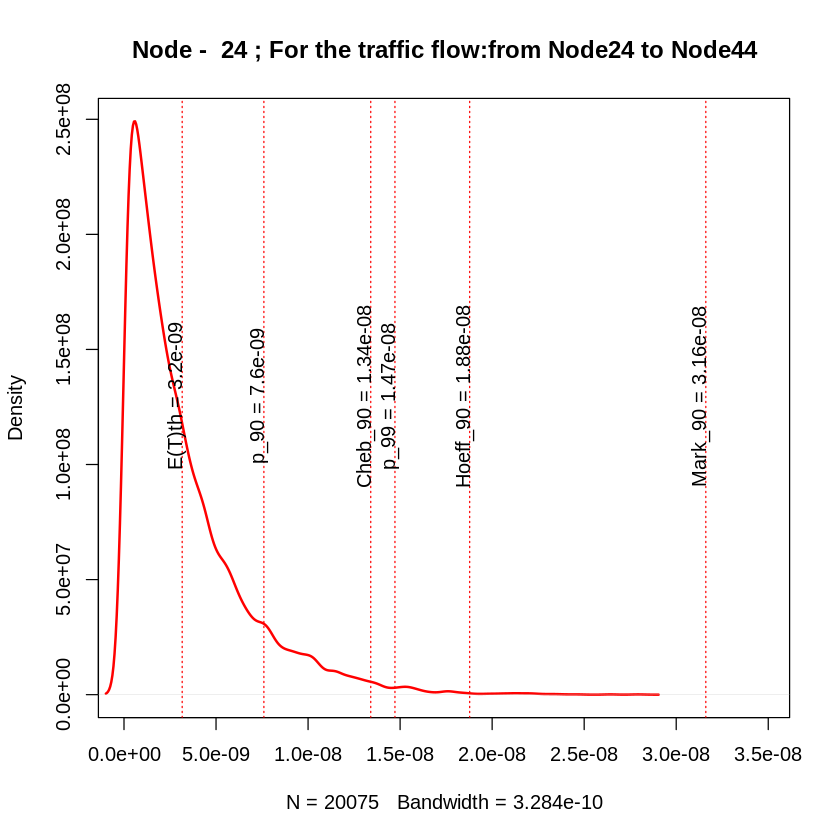

[1] 25
+ 1/202 edge from edd41aa (vertex names):
[1] Node25->Node9
[1] "traffic_Node25_Node9_"
[1] 25
[1] "Node -  25 :"
[1] "variance= 2.17390858650405e-18"
[1] "sigma2= 1.4744180501147e-09"
[1] "igraph E(T) = 1.46228880267894e-09"
[1] "simmer E(T) = 1.4839642759991e-09"


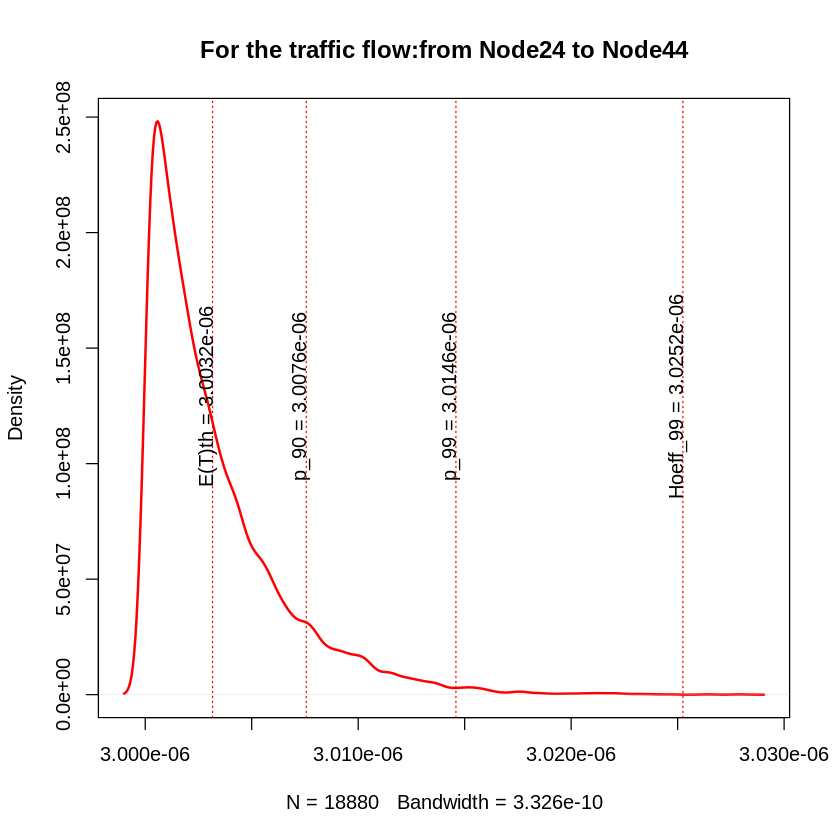

+ 1/202 edge from edd41aa (vertex names):
[1] Node25->Node9
[1] "variance= 2.18434254293725e-18"
[1] "sigma2= 1.47795214500919e-09"
[1] "igraph E(T) = 2.00146228880268e-06"
[1] "simmer E(T) = 2.00148657917244e-06"


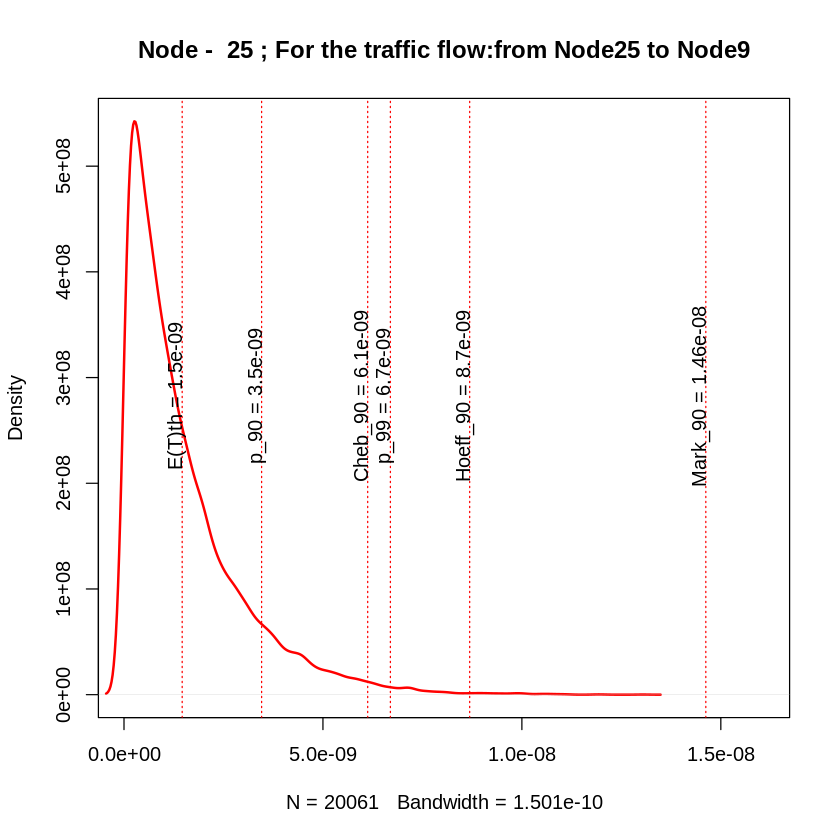

[1] 26
+ 1/202 edge from edd41aa (vertex names):
[1] Node26->Node10
[1] "traffic_Node26_Node10_"
[1] 26
[1] "Node -  26 :"
[1] "variance= 3.36320561491285e-17"
[1] "sigma2= 5.79931514483637e-09"
[1] "igraph E(T) = 5.5631497796972e-09"
[1] "simmer E(T) = 5.67364521609895e-09"


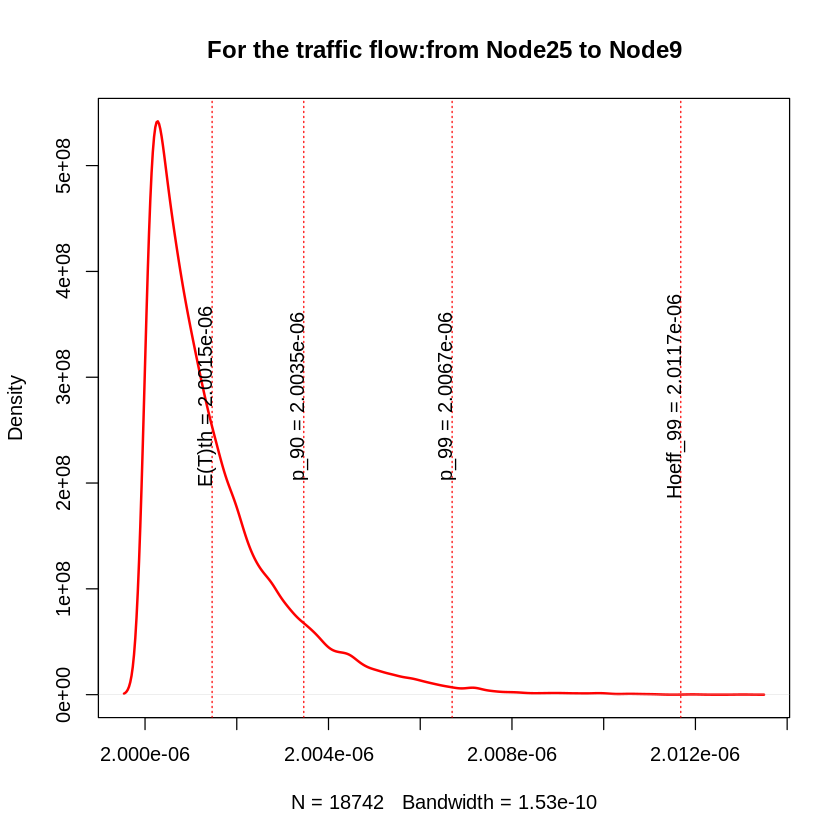

+ 1/202 edge from edd41aa (vertex names):
[1] Node26->Node10
[1] "variance= 3.35174444761271e-17"
[1] "sigma2= 5.7894252284771e-09"
[1] "igraph E(T) = 2.0055631497797e-06"
[1] "simmer E(T) = 2.0056590322991e-06"


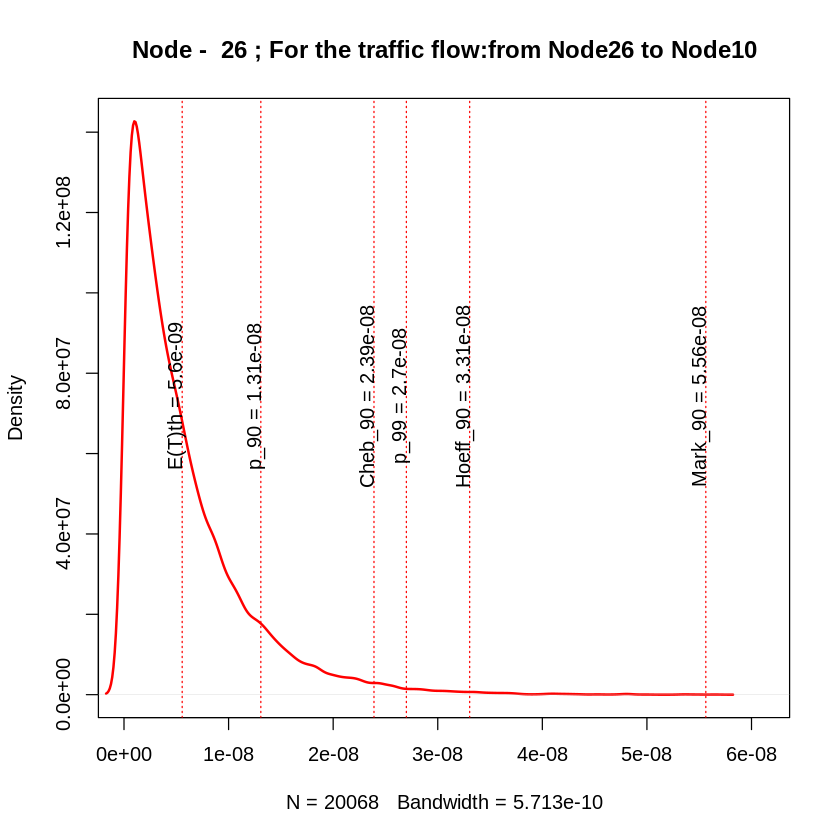

[1] 27
+ 1/202 edge from edd41aa (vertex names):
[1] Node27->Node11
[1] "traffic_Node27_Node11_"
[1] 27
[1] "Node -  27 :"
[1] "variance= 1.93823248277305e-17"
[1] "sigma2= 4.40253618130851e-09"
[1] "igraph E(T) = 4.19001539836377e-09"
[1] "simmer E(T) = 4.27732004529225e-09"


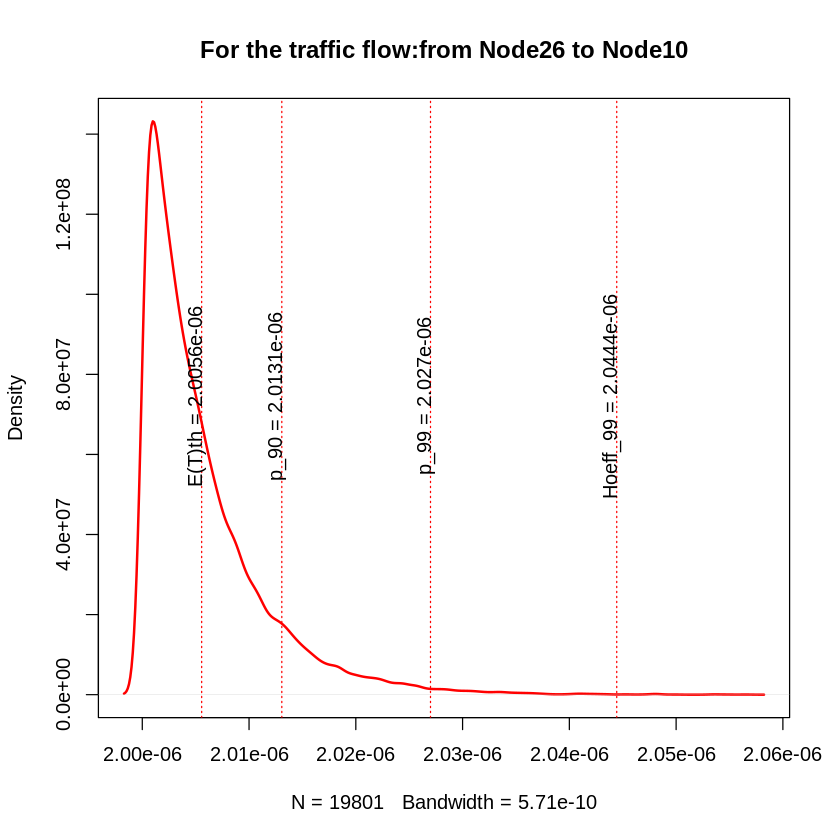

+ 1/202 edge from edd41aa (vertex names):
[1] Node27->Node11
[1] "variance= 1.89058514186134e-17"
[1] "sigma2= 4.34808594885306e-09"
[1] "igraph E(T) = 2.00419001539836e-06"
[1] "simmer E(T) = 2.00424465843239e-06"


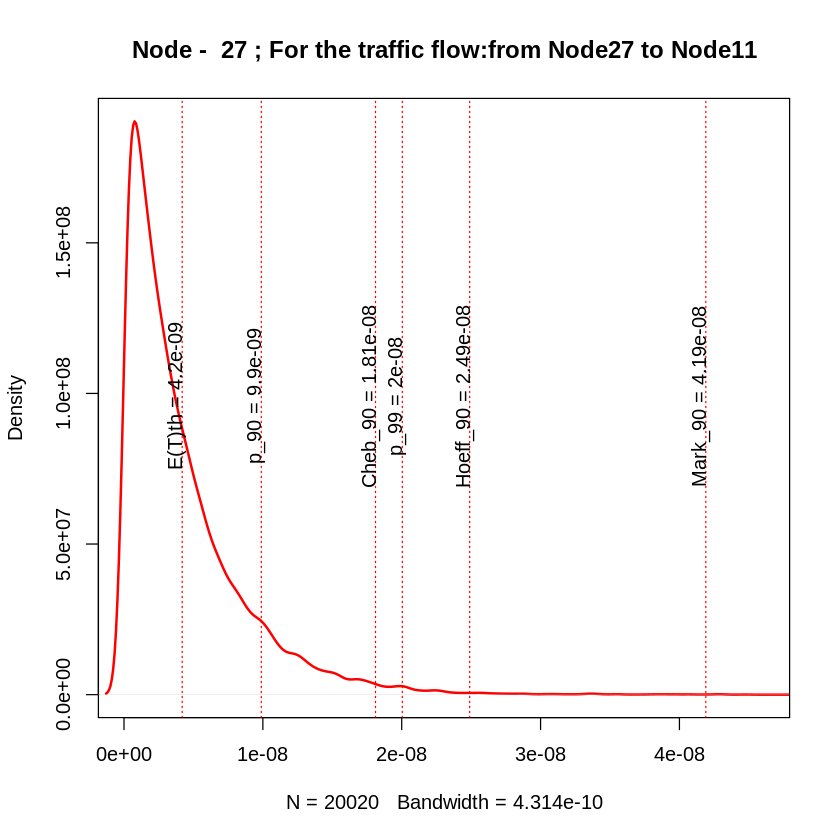

[1] 28
+ 1/202 edge from edd41aa (vertex names):
[1] Node28->Node12
[1] "traffic_Node28_Node12_"
[1] 28
[1] "Node -  28 :"
[1] "variance= 3.7208783841079e-17"
[1] "sigma2= 6.09990031402801e-09"
[1] "igraph E(T) = 5.50030342257364e-09"
[1] "simmer E(T) = 5.78140261524257e-09"


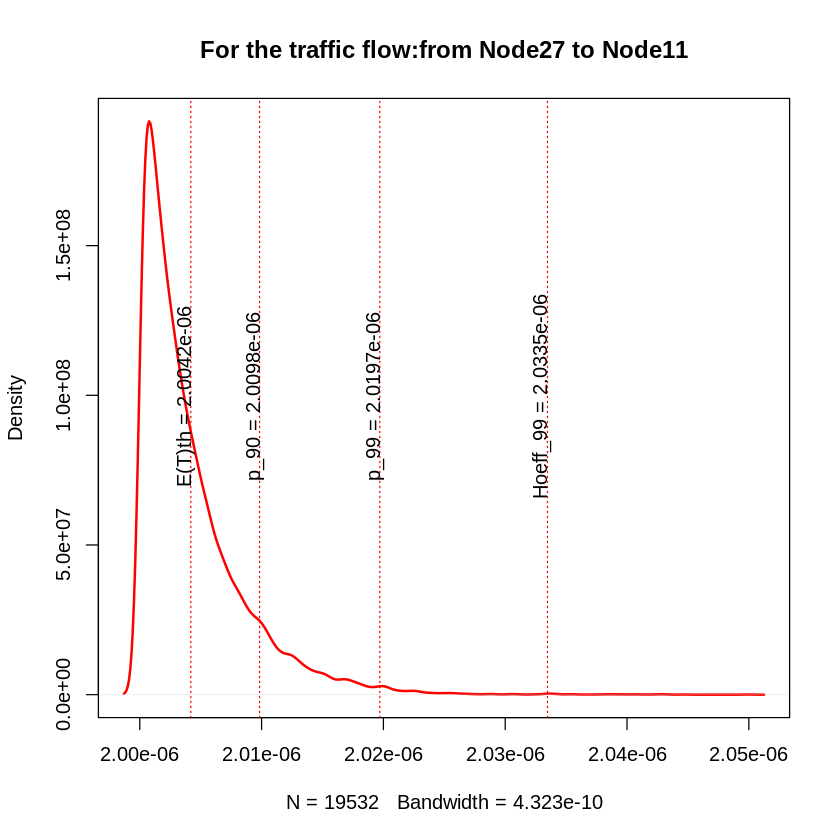

+ 1/202 edge from edd41aa (vertex names):
[1] Node28->Node12
[1] "variance= 3.6900354698783e-17"
[1] "sigma2= 6.0745662148653e-09"
[1] "igraph E(T) = 2.00550030342257e-06"
[1] "simmer E(T) = 2.00575208214292e-06"


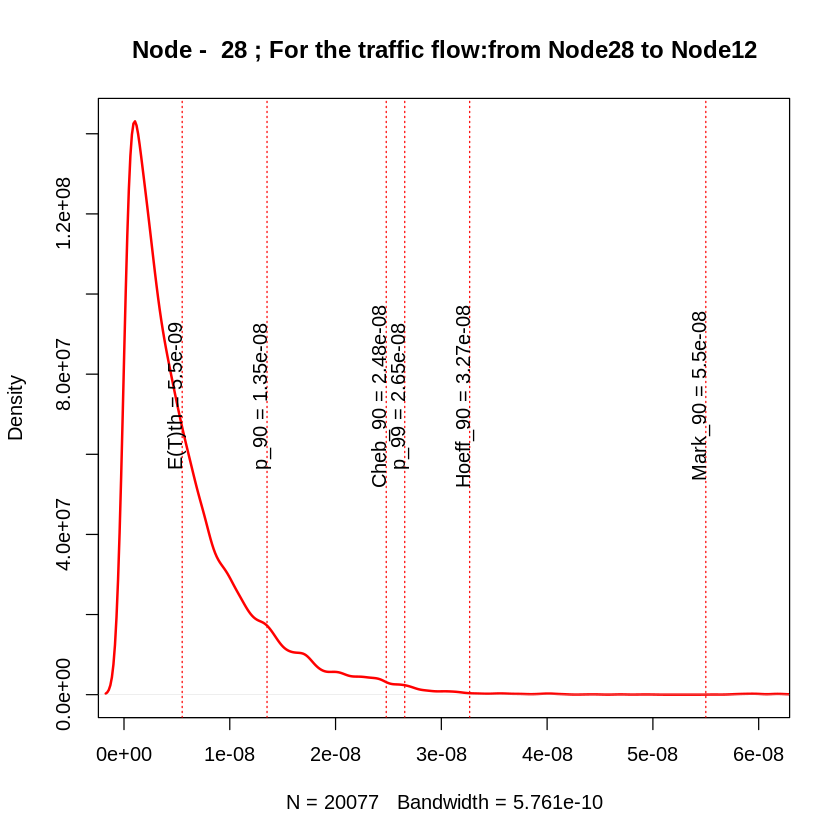

[1] 29
+ 1/202 edge from edd41aa (vertex names):
[1] Node29->Node13
[1] "traffic_Node29_Node13_"
[1] 29
[1] "Node -  29 :"
[1] "variance= 2.97509732319789e-17"
[1] "sigma2= 5.45444527261745e-09"
[1] "igraph E(T) = 5.32072304771787e-09"
[1] "simmer E(T) = 5.47028145480579e-09"


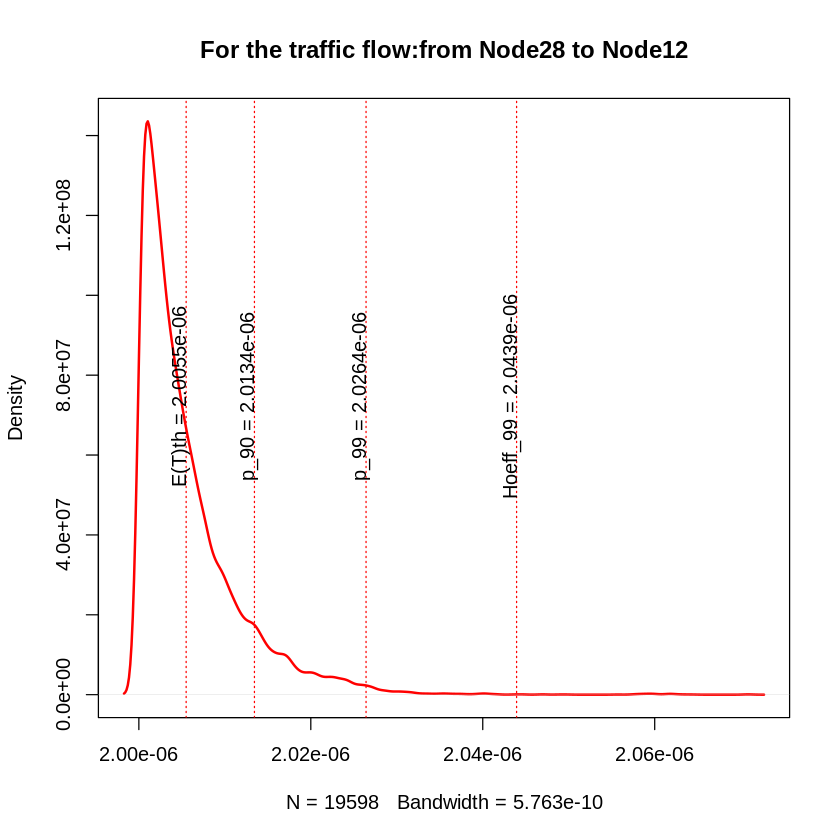

+ 1/202 edge from edd41aa (vertex names):
[1] Node29->Node13
[1] "variance= 2.90457136401924e-17"
[1] "sigma2= 5.38940754074067e-09"
[1] "igraph E(T) = 2.00532072304772e-06"
[1] "simmer E(T) = 2.00541969498357e-06"


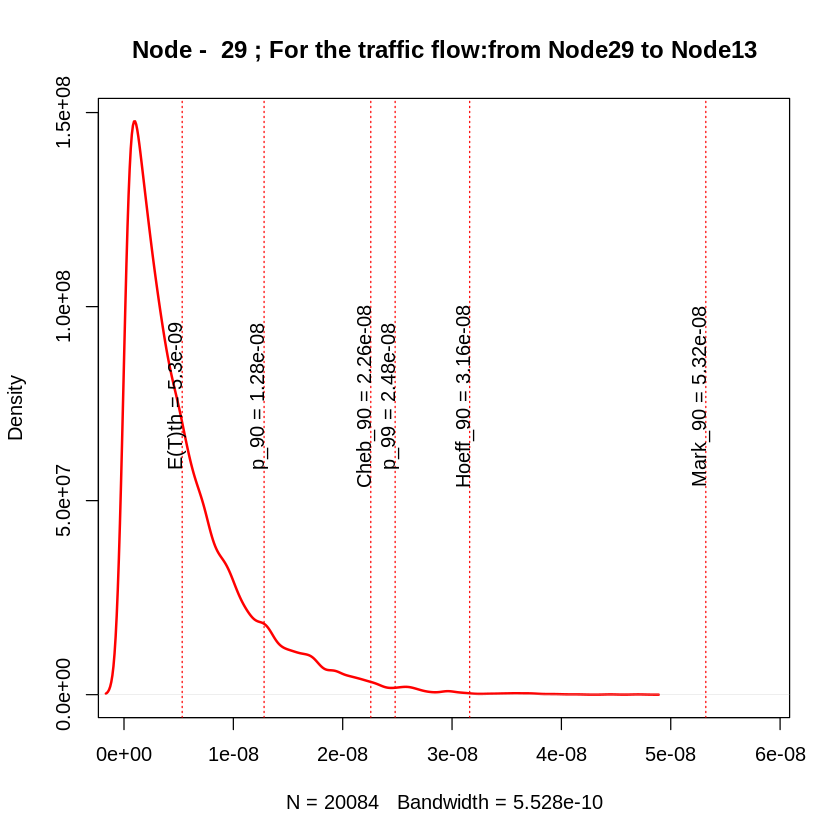

[1] 30
+ 1/202 edge from edd41aa (vertex names):
[1] Node30->Node14
[1] "traffic_Node30_Node14_"
[1] 30
[1] "Node -  30 :"
[1] "variance= 8.91019546531557e-18"
[1] "sigma2= 2.98499505281258e-09"
[1] "igraph E(T) = 2.6976340740939e-09"
[1] "simmer E(T) = 2.8180512867023e-09"


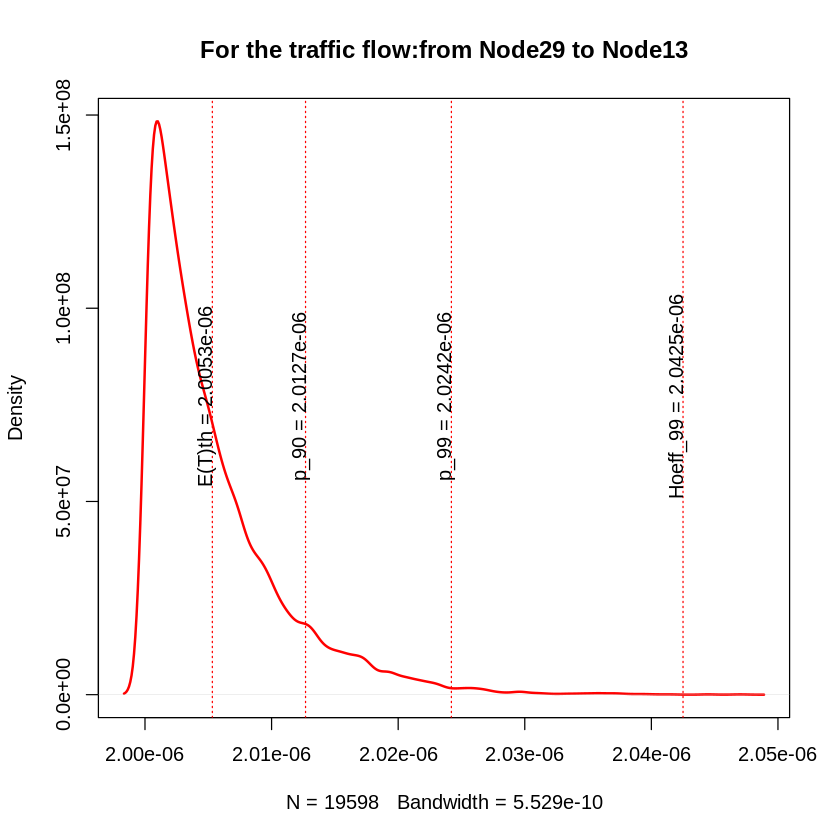

+ 1/202 edge from edd41aa (vertex names):
[1] Node30->Node14
[1] "variance= 8.95078763102792e-18"
[1] "sigma2= 2.99178669544269e-09"
[1] "igraph E(T) = 2.00269763407409e-06"
[1] "simmer E(T) = 2.00280676379906e-06"


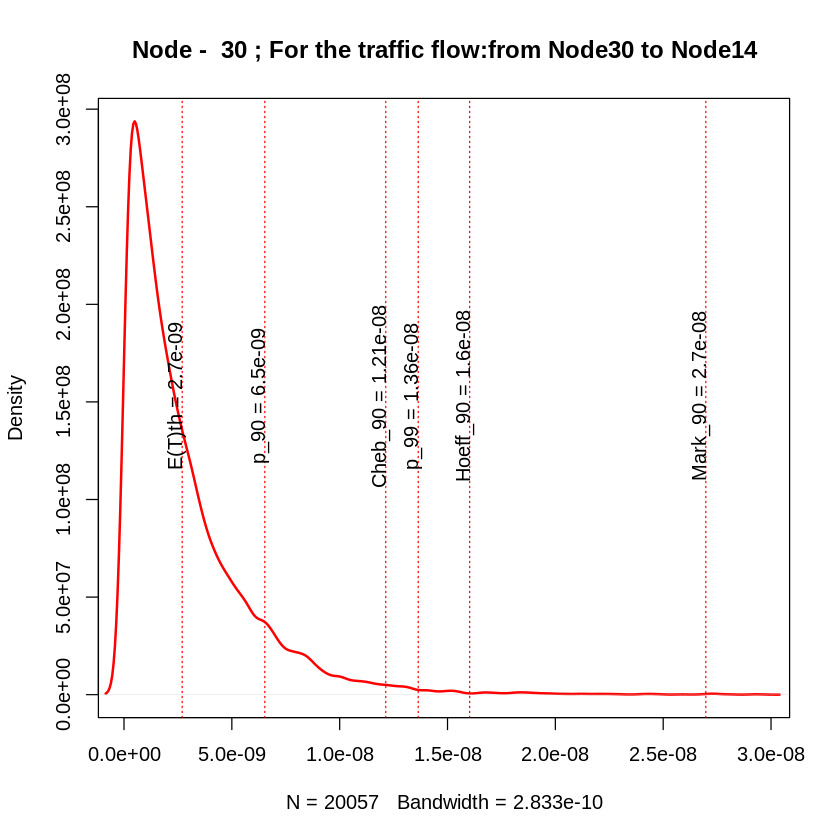

[1] 31
+ 1/202 edge from edd41aa (vertex names):
[1] Node31->Node15
[1] "traffic_Node31_Node15_"
[1] 31
[1] "Node -  31 :"
[1] "variance= 6.055052897282e-18"
[1] "sigma2= 2.46070170831046e-09"
[1] "igraph E(T) = 2.3475197564679e-09"
[1] "simmer E(T) = 2.4010757323207e-09"


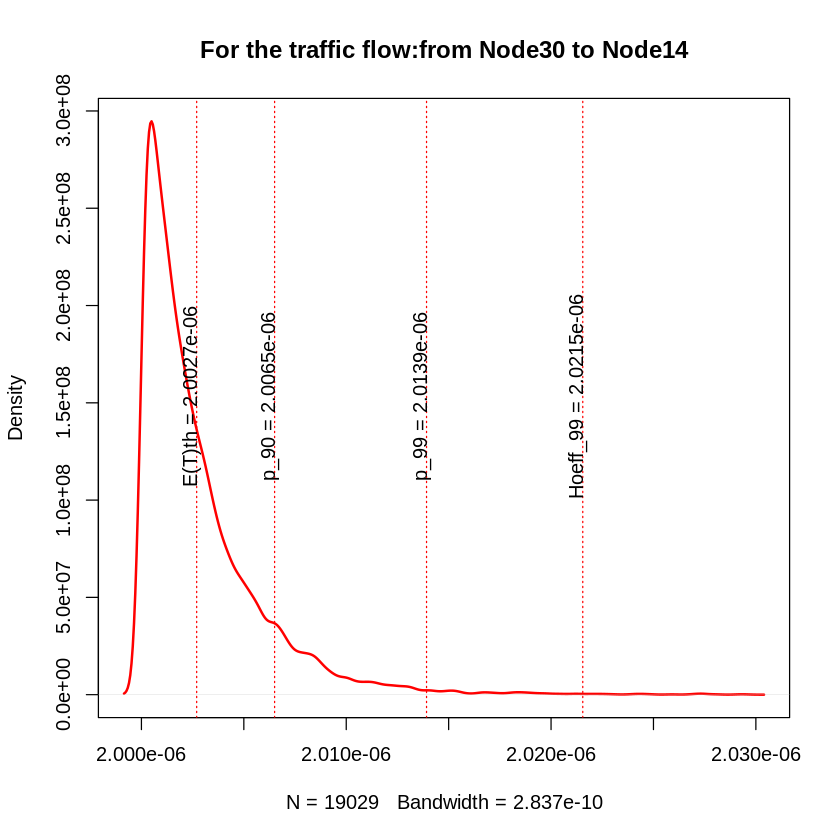

+ 1/202 edge from edd41aa (vertex names):
[1] Node31->Node15
[1] "variance= 6.02758969978763e-18"
[1] "sigma2= 2.45511500744622e-09"
[1] "igraph E(T) = 2.00234751975647e-06"
[1] "simmer E(T) = 2.00239303486847e-06"


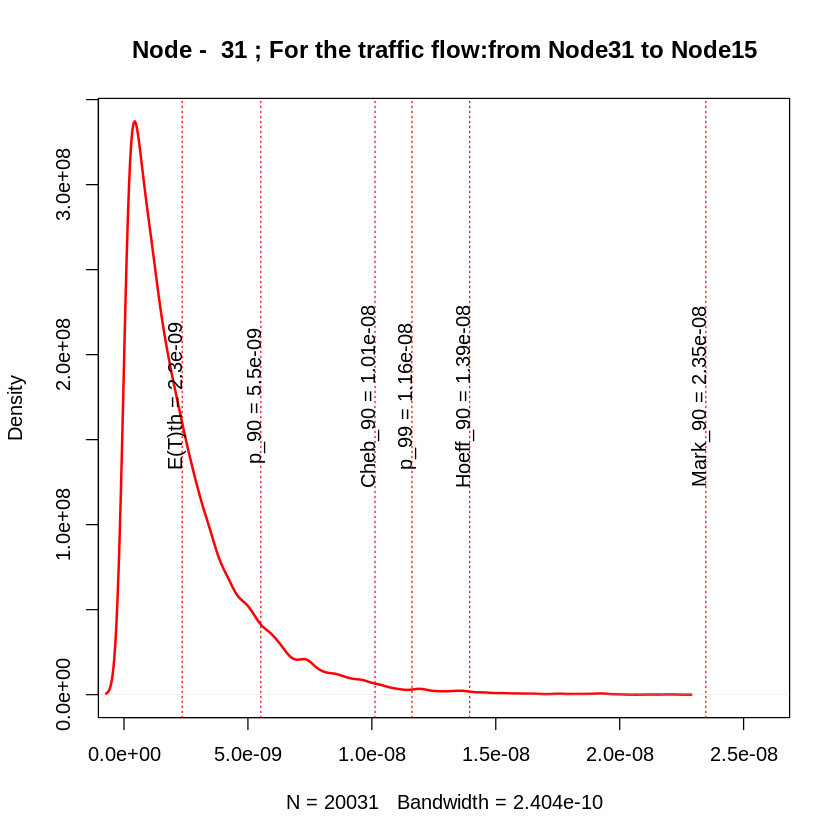

[1] 32
+ 1/202 edge from edd41aa (vertex names):
[1] Node32->Node15
[1] "traffic_Node32_Node15_"
[1] 32
[1] "Node -  32 :"
[1] "variance= 3.68333753071111e-18"
[1] "sigma2= 1.91920231625306e-09"
[1] "igraph E(T) = 1.80632988911686e-09"
[1] "simmer E(T) = 1.85449684172929e-09"


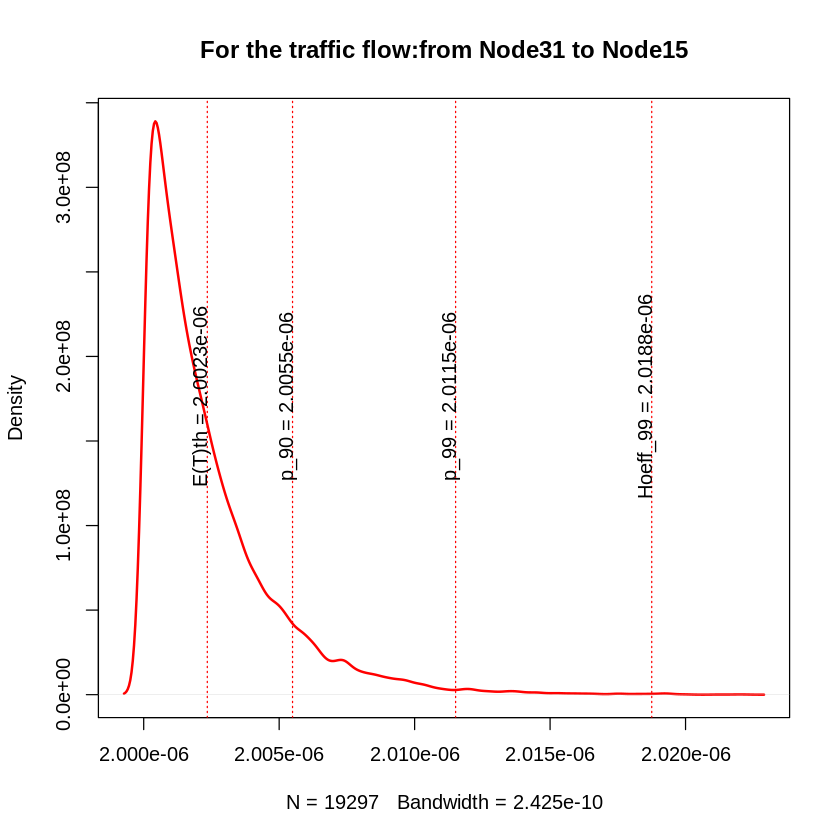

+ 1/202 edge from edd41aa (vertex names):
[1] Node32->Node15
[1] "variance= 3.64827964608015e-18"
[1] "sigma2= 1.91004702719073e-09"
[1] "igraph E(T) = 2.00180632988912e-06"
[1] "simmer E(T) = 2.00184798373567e-06"


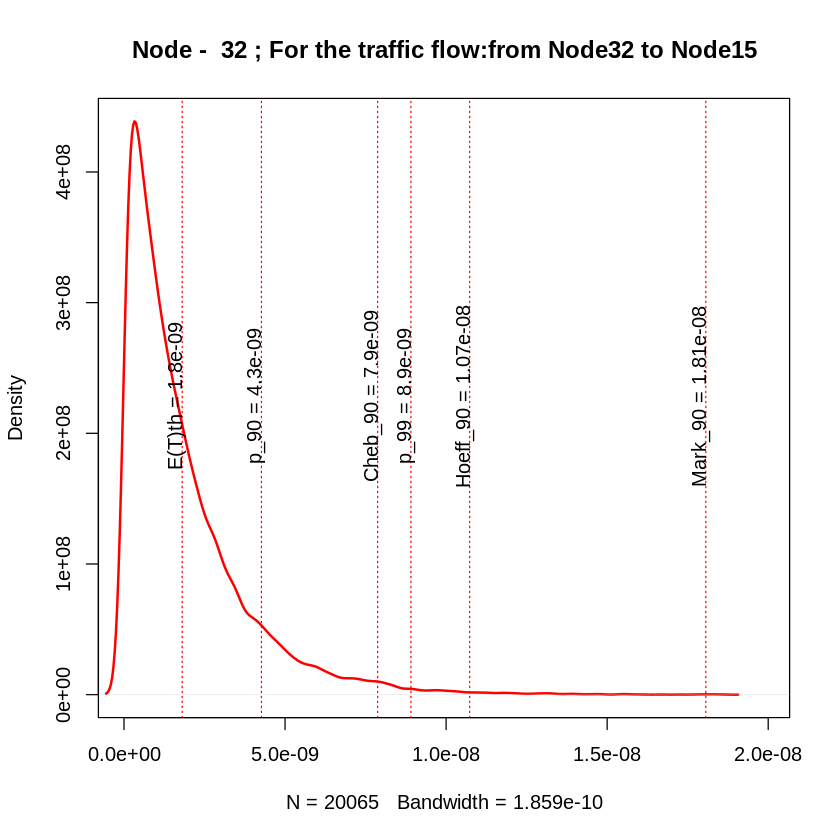

[1] 33
+ 1/202 edge from edd41aa (vertex names):
[1] Node33->Node16
[1] "traffic_Node33_Node16_"
[1] 33
[1] "Node -  33 :"
[1] "variance= 6.54964295960661e-17"
[1] "sigma2= 8.09298644482159e-09"
[1] "igraph E(T) = 7.75015072503624e-09"
[1] "simmer E(T) = 7.90655796789395e-09"


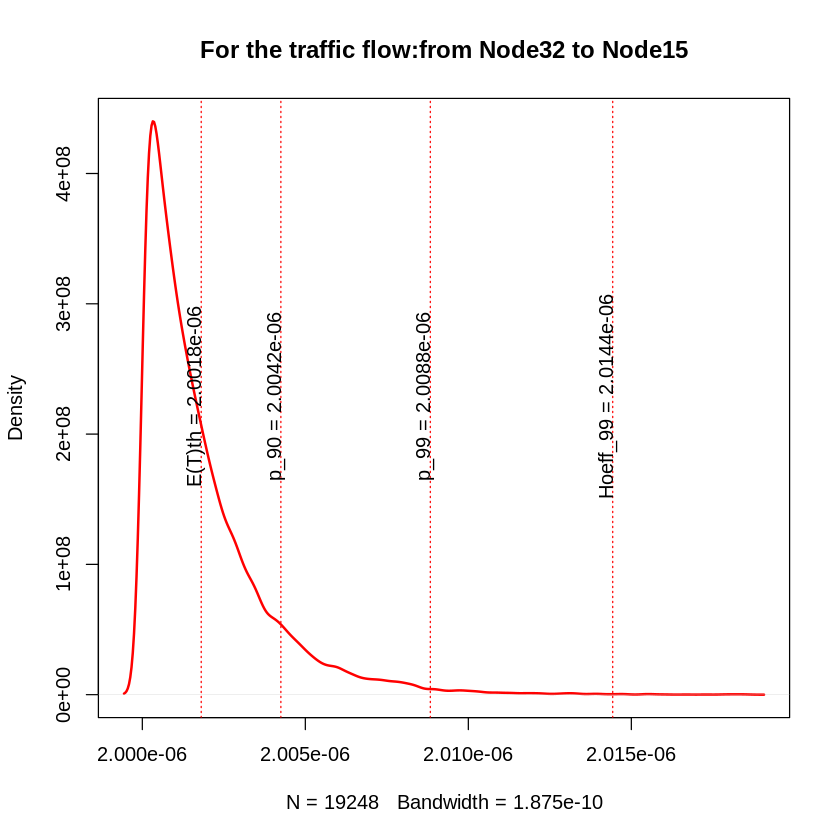

+ 1/202 edge from edd41aa (vertex names):
[1] Node33->Node16
[1] "variance= 6.54079615428728e-17"
[1] "sigma2= 8.08751887434414e-09"
[1] "igraph E(T) = 2.00775015072504e-06"
[1] "simmer E(T) = 2.00788696188015e-06"


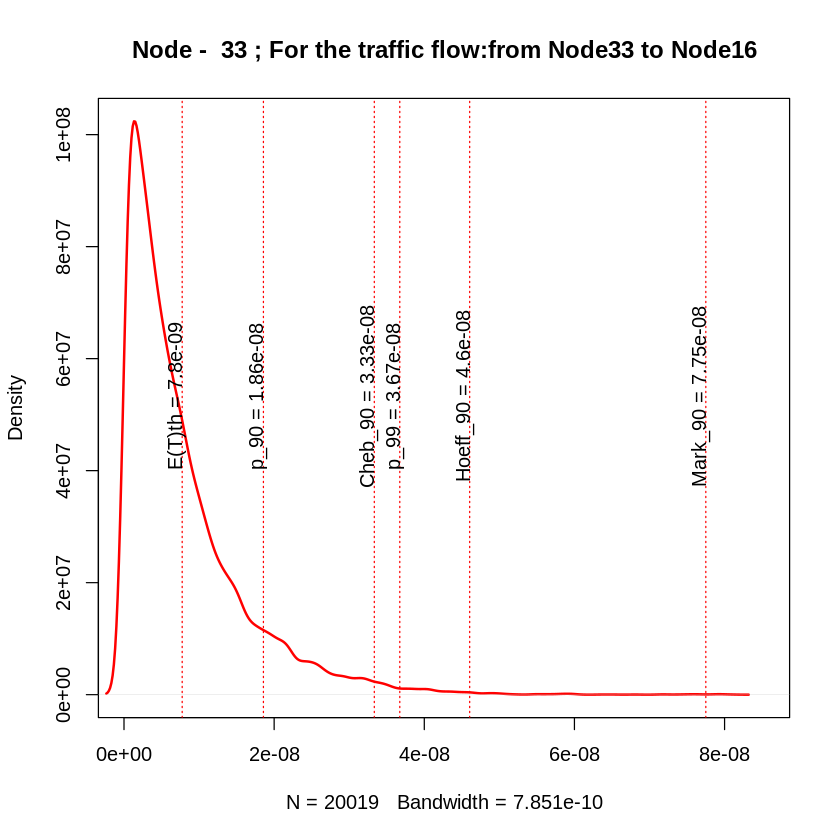

[1] 34
+ 1/202 edge from edd41aa (vertex names):
[1] Node34->Node17
[1] "traffic_Node34_Node17_"
[1] 34
[1] "Node -  34 :"
[1] "variance= 5.72495120410226e-17"
[1] "sigma2= 7.56634072990522e-09"
[1] "igraph E(T) = 7.25697584388961e-09"
[1] "simmer E(T) = 7.4376597899057e-09"


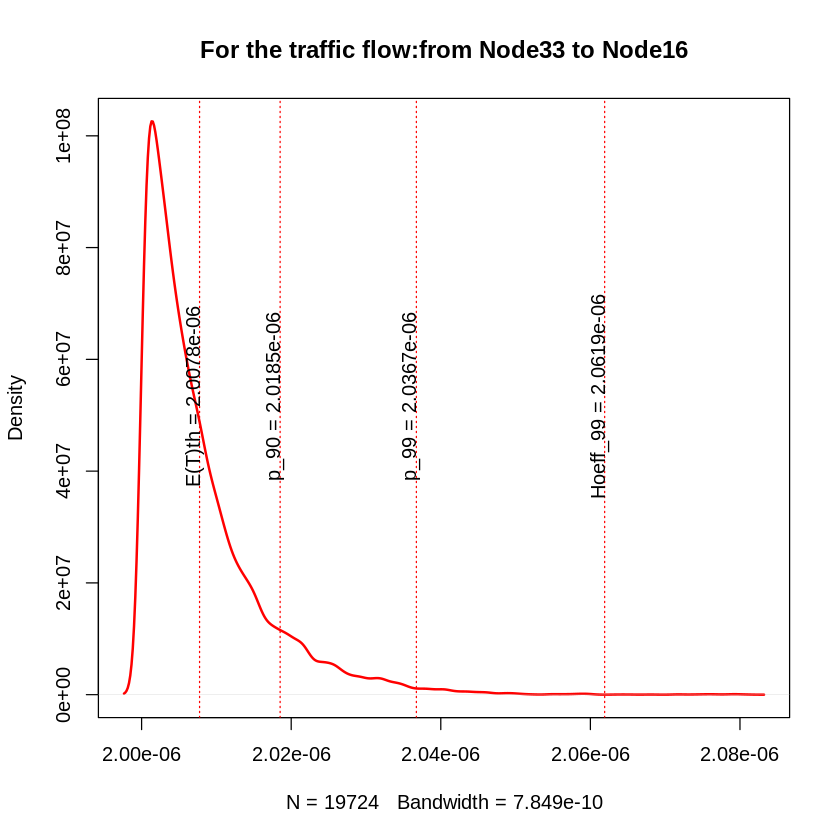

+ 1/202 edge from edd41aa (vertex names):
[1] Node34->Node17
[1] "variance= 5.71011865091288e-17"
[1] "sigma2= 7.5565327041659e-09"
[1] "igraph E(T) = 2.00725697584389e-06"
[1] "simmer E(T) = 2.00742611229875e-06"


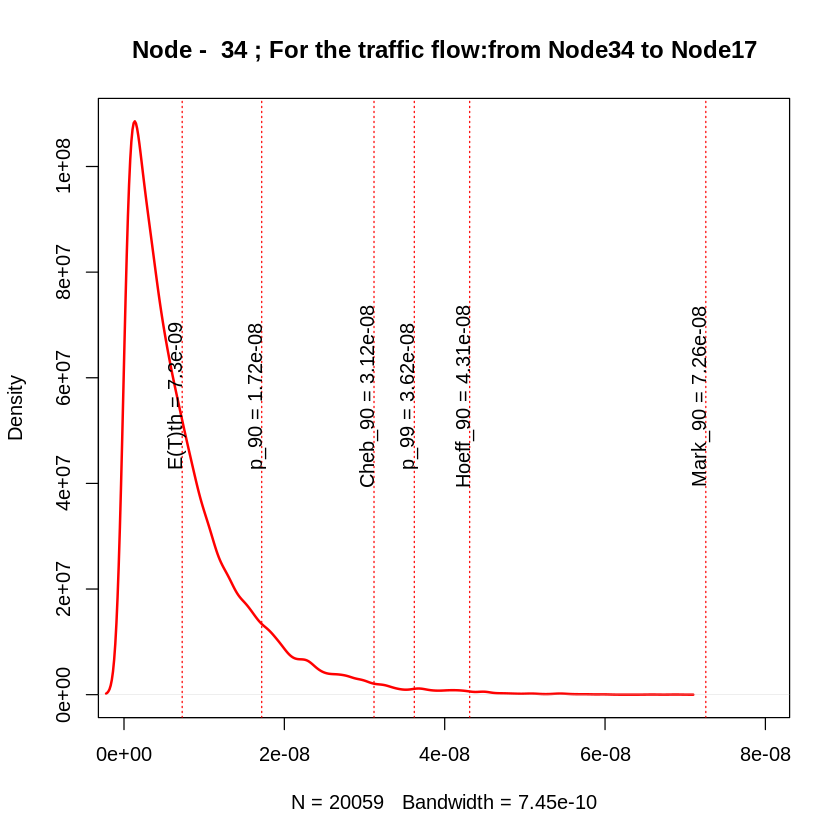

[1] 35
+ 1/202 edge from edd41aa (vertex names):
[1] Node35->Node17
[1] "traffic_Node35_Node17_"
[1] 35
[1] "Node -  35 :"
[1] "variance= 1.31284219497898e-17"
[1] "sigma2= 3.62331642970771e-09"
[1] "igraph E(T) = 3.33005583404682e-09"
[1] "simmer E(T) = 3.50534862091986e-09"


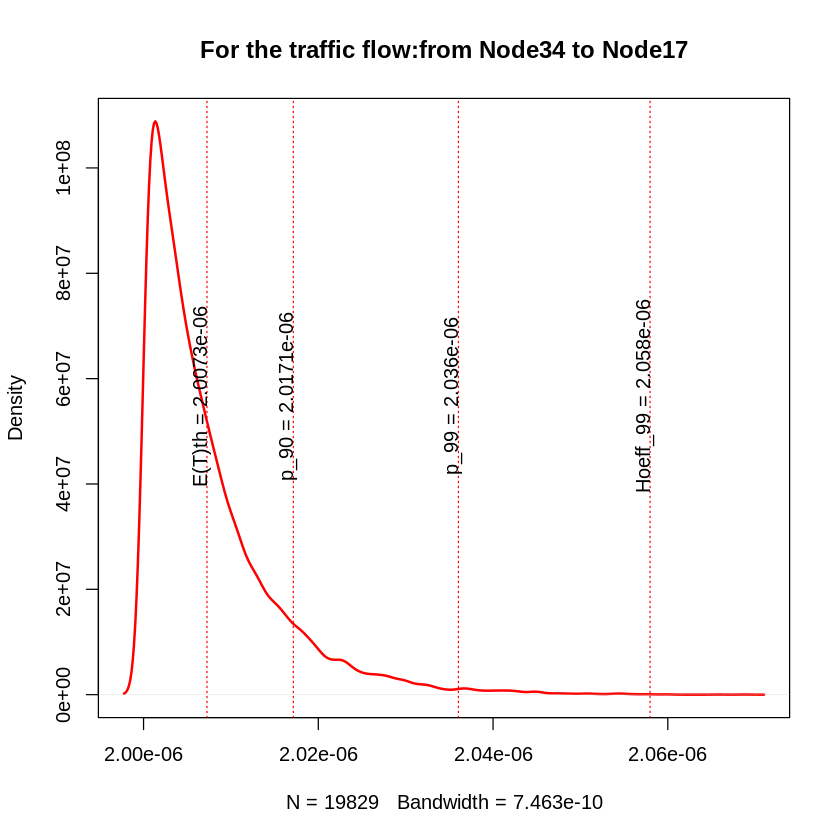

+ 1/202 edge from edd41aa (vertex names):
[1] Node35->Node17
[1] "variance= 1.30020675952551e-17"
[1] "sigma2= 3.60583798793776e-09"
[1] "igraph E(T) = 2.00333005583405e-06"
[1] "simmer E(T) = 2.00347705019866e-06"


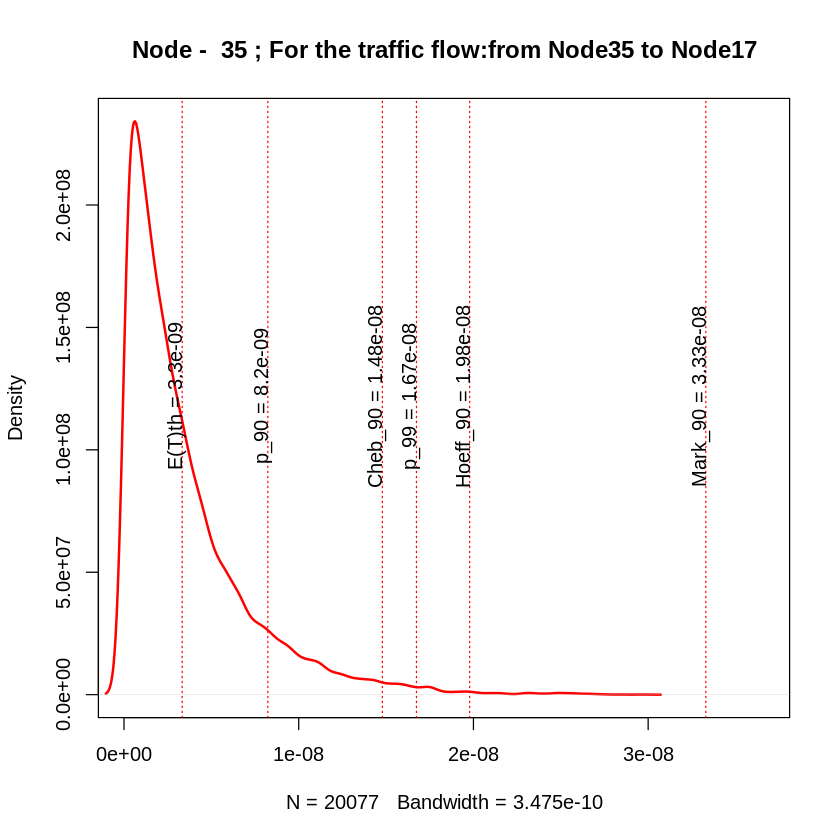

[1] 36
+ 1/202 edge from edd41aa (vertex names):
[1] Node36->Node18
[1] "traffic_Node36_Node18_"
[1] 36
[1] "Node -  36 :"
[1] "variance= 2.33890777073587e-17"
[1] "sigma2= 4.83622556415214e-09"
[1] "igraph E(T) = 4.53887393040853e-09"
[1] "simmer E(T) = 4.64776731699007e-09"


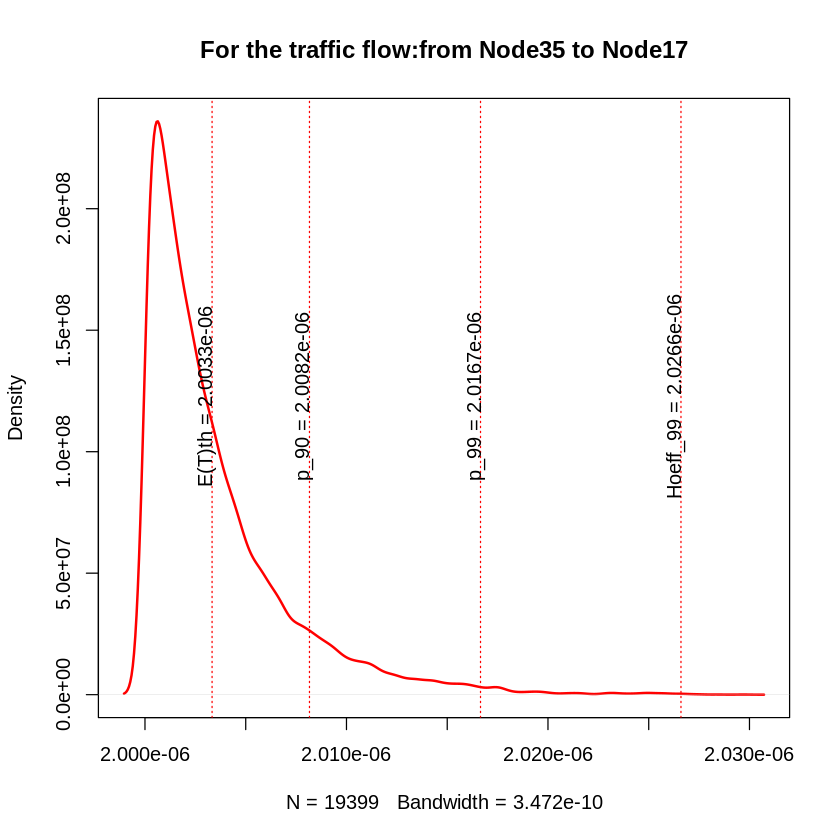

+ 1/202 edge from edd41aa (vertex names):
[1] Node36->Node18
[1] "variance= 2.32375544049577e-17"
[1] "sigma2= 4.82053465965734e-09"
[1] "igraph E(T) = 2.00453887393041e-06"
[1] "simmer E(T) = 2.00462367316531e-06"


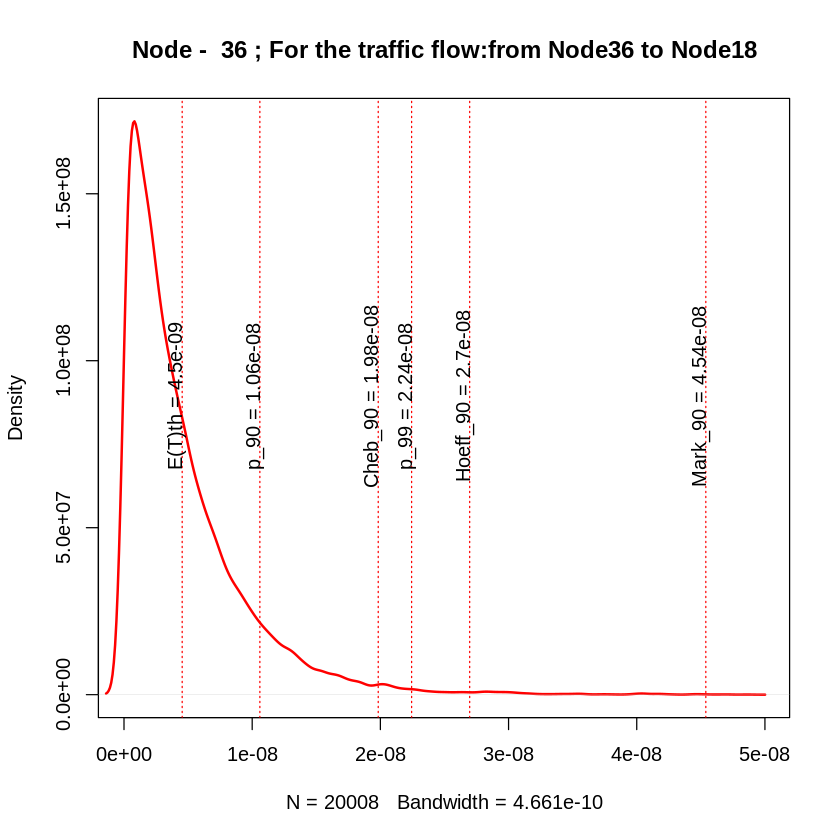

[1] 37
+ 1/202 edge from edd41aa (vertex names):
[1] Node37->Node18
[1] "traffic_Node37_Node18_"
[1] 37
[1] "Node -  37 :"
[1] "variance= 4.16403783133857e-18"
[1] "sigma2= 2.04059742020286e-09"
[1] "igraph E(T) = 1.94777503834139e-09"
[1] "simmer E(T) = 1.98915541868488e-09"


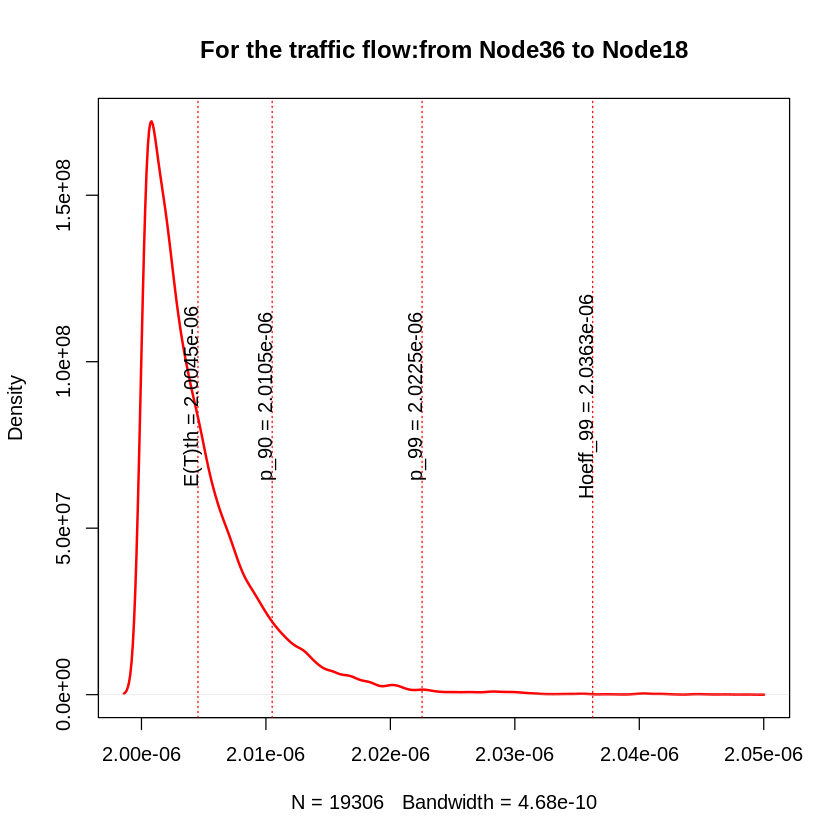

+ 1/202 edge from edd41aa (vertex names):
[1] Node37->Node18
[1] "variance= 4.17132021473338e-18"
[1] "sigma2= 2.04238101605293e-09"
[1] "igraph E(T) = 2.00194777503834e-06"
[1] "simmer E(T) = 2.00198842017647e-06"


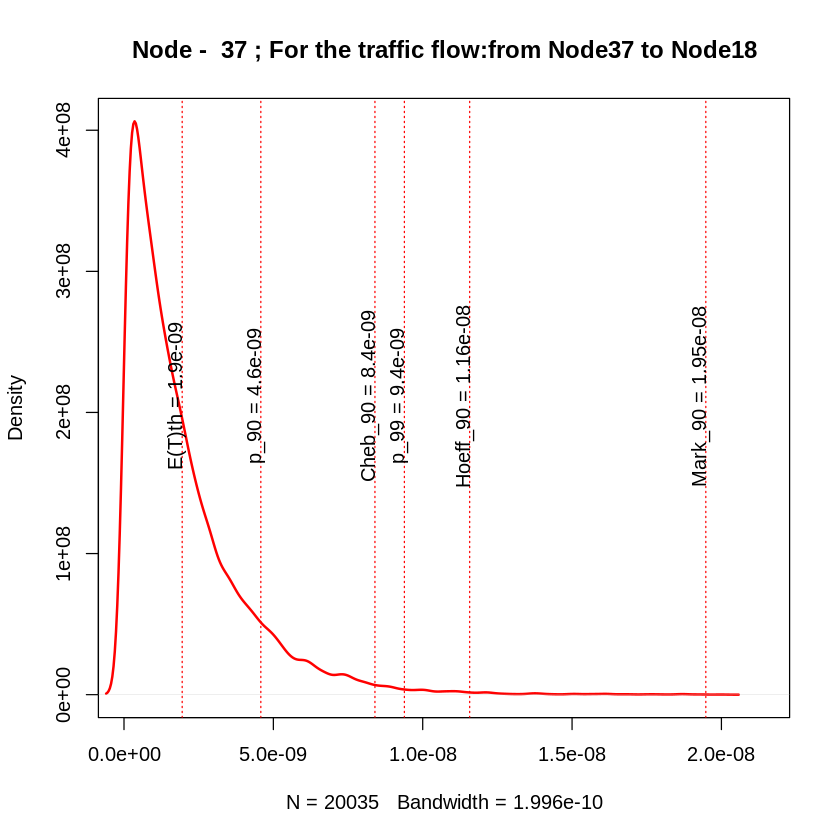

[1] 38
+ 1/202 edge from edd41aa (vertex names):
[1] Node38->Node19
[1] "traffic_Node38_Node19_"
[1] 38
[1] "Node -  38 :"
[1] "variance= 6.30715952384577e-18"
[1] "sigma2= 2.51140588592242e-09"
[1] "igraph E(T) = 2.46921649652495e-09"
[1] "simmer E(T) = 2.50434332433201e-09"


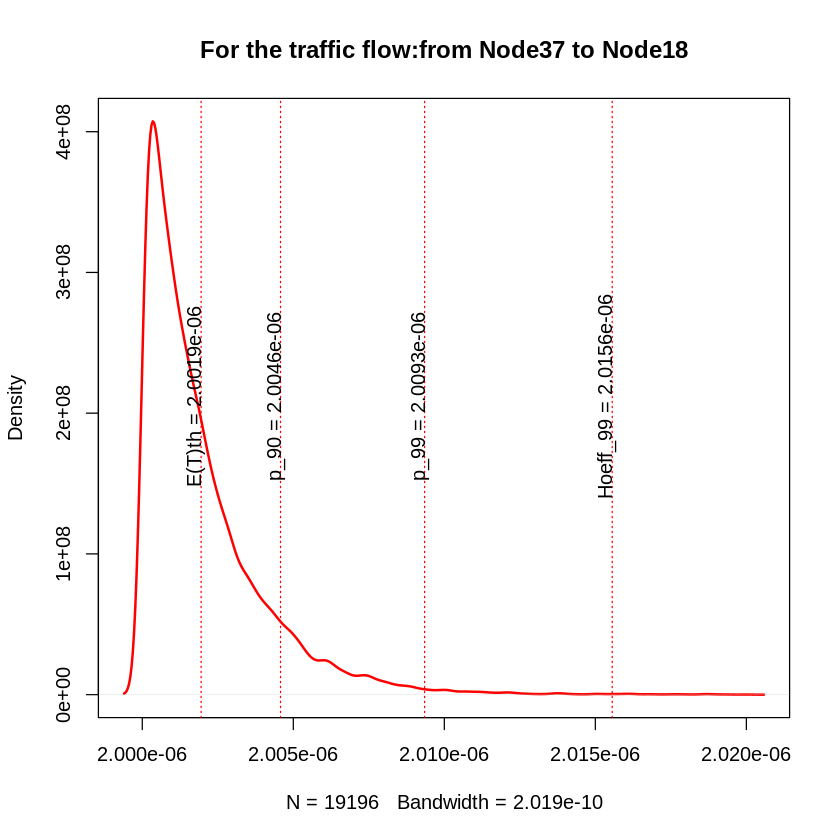

+ 1/202 edge from edd41aa (vertex names):
[1] Node38->Node19
[1] "variance= 6.2641223901543e-18"
[1] "sigma2= 2.50282288429571e-09"
[1] "igraph E(T) = 2.00246921649652e-06"
[1] "simmer E(T) = 2.00249656456207e-06"


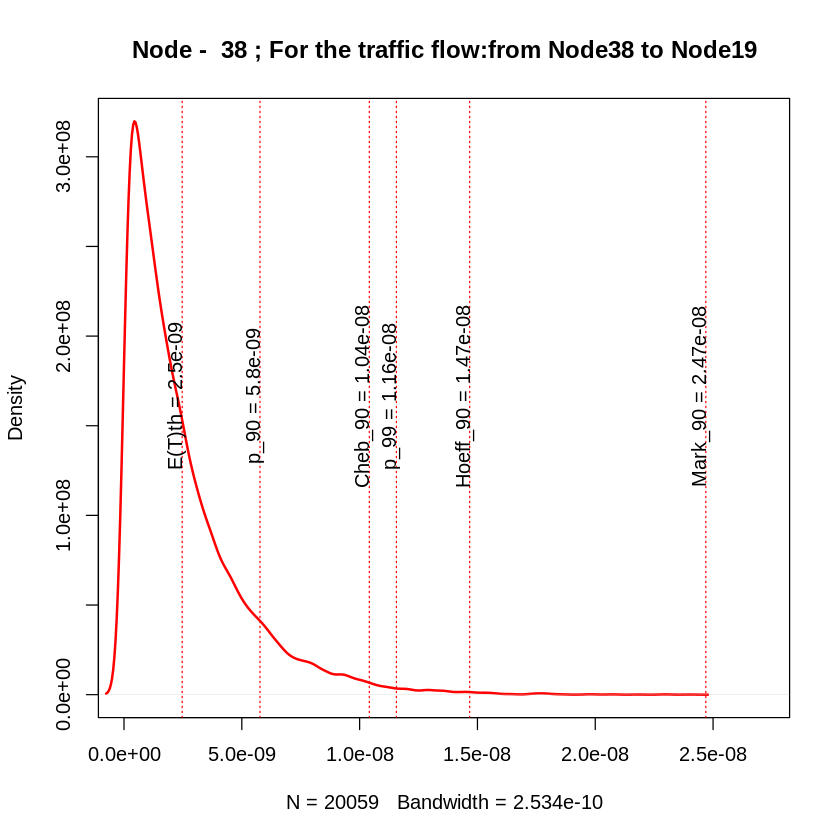

[1] 39
+ 1/202 edge from edd41aa (vertex names):
[1] Node39->Node19
[1] "traffic_Node39_Node19_"
[1] 39
[1] "Node -  39 :"
[1] "variance= 5.56000415747838e-17"
[1] "sigma2= 7.45654354072876e-09"
[1] "igraph E(T) = 7.45400317191911e-09"
[1] "simmer E(T) = 7.56990329204895e-09"


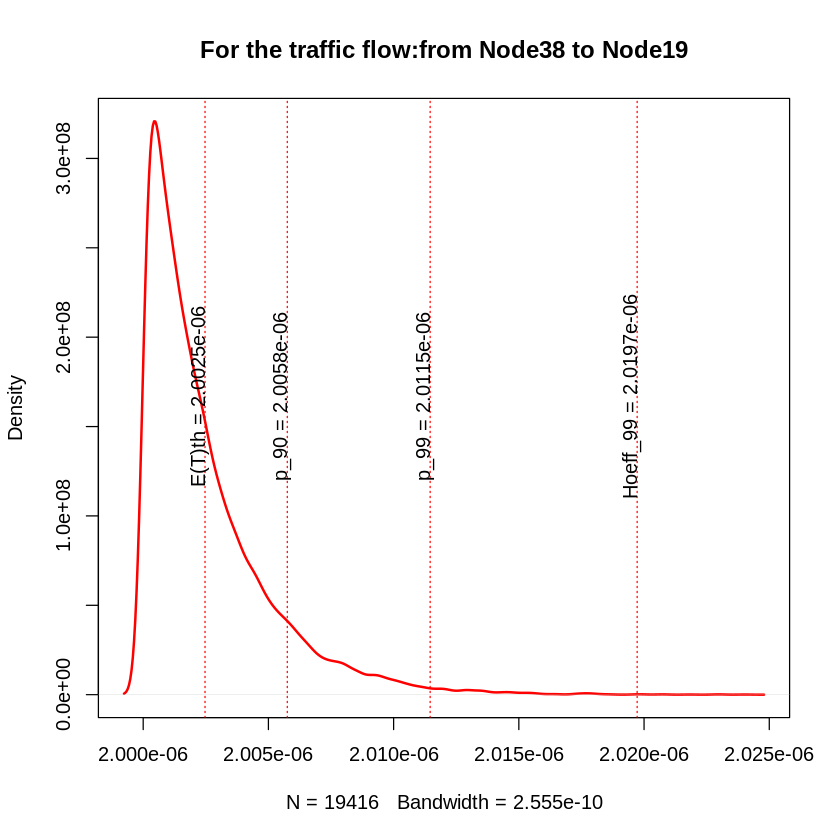

+ 1/202 edge from edd41aa (vertex names):
[1] Node39->Node19
[1] "variance= 5.54607592481247e-17"
[1] "sigma2= 7.44719808036047e-09"
[1] "igraph E(T) = 2.00745400317192e-06"
[1] "simmer E(T) = 2.00755066031685e-06"


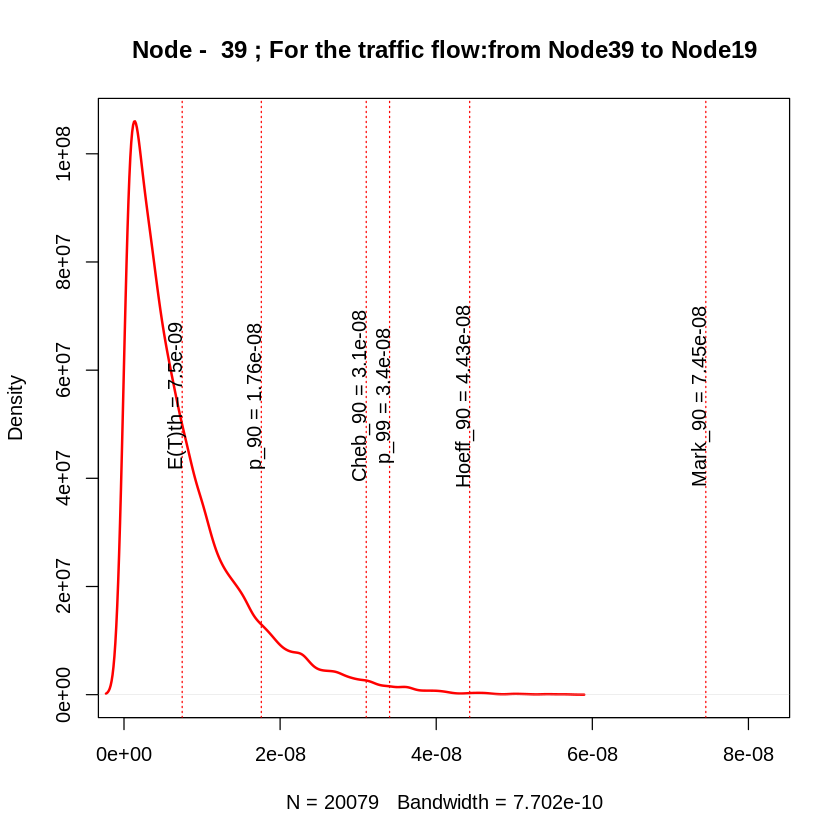

[1] 40
[1] "no info of traffic"
 [1] 8.005539e-06 8.008184e-06 3.006111e-06 3.005349e-06 3.004616e-06
 [6] 3.003062e-06 7.003539e-06 3.001299e-06 0.000000e+00 0.000000e+00
[11] 0.000000e+00 0.000000e+00 0.000000e+00 0.000000e+00 0.000000e+00
[16] 0.000000e+00 0.000000e+00 0.000000e+00 0.000000e+00 3.001689e-06
[21] 3.002273e-06 3.005242e-06 3.005605e-06 3.003239e-06 2.001487e-06
[26] 2.005659e-06 2.004245e-06 2.005752e-06 2.005420e-06 2.002807e-06
[31] 2.002393e-06 2.001848e-06 2.007887e-06 2.007426e-06 2.003477e-06
[36] 2.004624e-06 2.001988e-06 2.002497e-06 2.007551e-06 0.000000e+00
[1] 41
[1] "no info of traffic"
 [1] 8.005539e-06 8.008184e-06 3.006111e-06 3.005349e-06 3.004616e-06
 [6] 3.003062e-06 7.003539e-06 3.001299e-06 0.000000e+00 0.000000e+00
[11] 0.000000e+00 0.000000e+00 0.000000e+00 0.000000e+00 0.000000e+00
[16] 0.000000e+00 0.000000e+00 0.000000e+00 0.000000e+00 3.001689e-06
[21] 3.002273e-06 3.005242e-06 3.005605e-06 3.003239e-06 2.001487e-06
[26] 2.005659e-06 2.004245

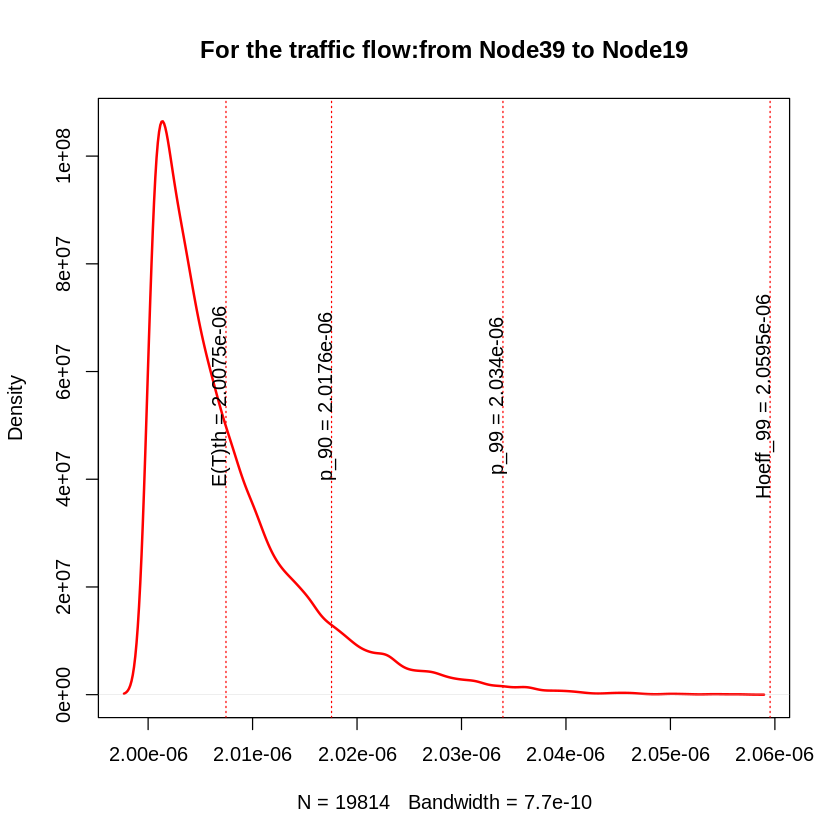

+ 1/202 edge from edd41aa (vertex names):
[1] Node45->Node44
[1] "variance= 2.46727319381723e-16"
[1] "sigma2= 1.57075561237808e-08"
[1] "igraph E(T) = 2.01522298317355e-06"
[1] "simmer E(T) = 2.01527486006255e-06"


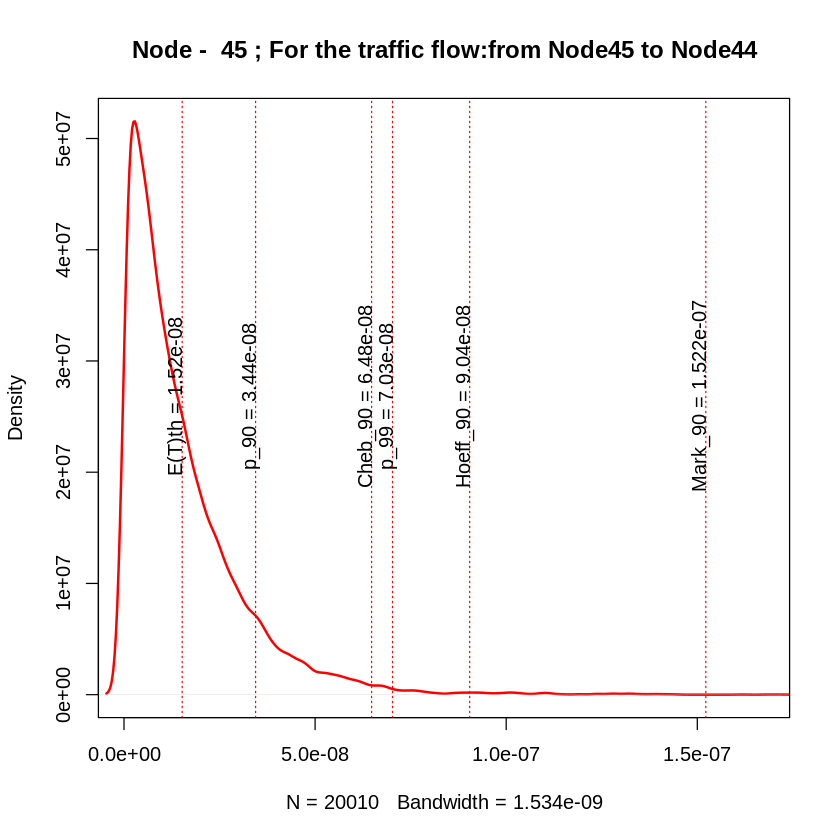

[1] 46
+ 1/202 edge from edd41aa (vertex names):
[1] Node46->Node44
[1] "traffic_Node46_Node44_"
[1] 46
[1] "Node -  46 :"
[1] "variance= 4.65187873680642e-17"
[1] "sigma2= 6.8204682660404e-09"
[1] "igraph E(T) = 6.72647021672982e-09"
[1] "simmer E(T) = 6.81223857927247e-09"


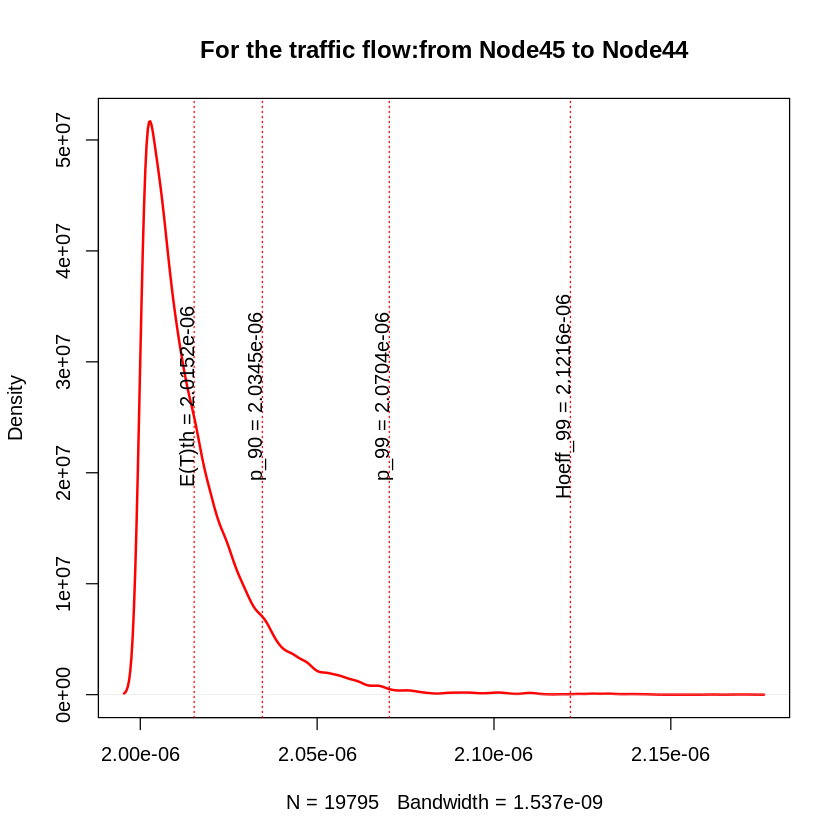

+ 1/202 edge from edd41aa (vertex names):
[1] Node46->Node44
[1] "variance= 4.58117083559645e-17"
[1] "sigma2= 6.76843470500857e-09"
[1] "igraph E(T) = 2.00672647021673e-06"
[1] "simmer E(T) = 2.00677713663557e-06"


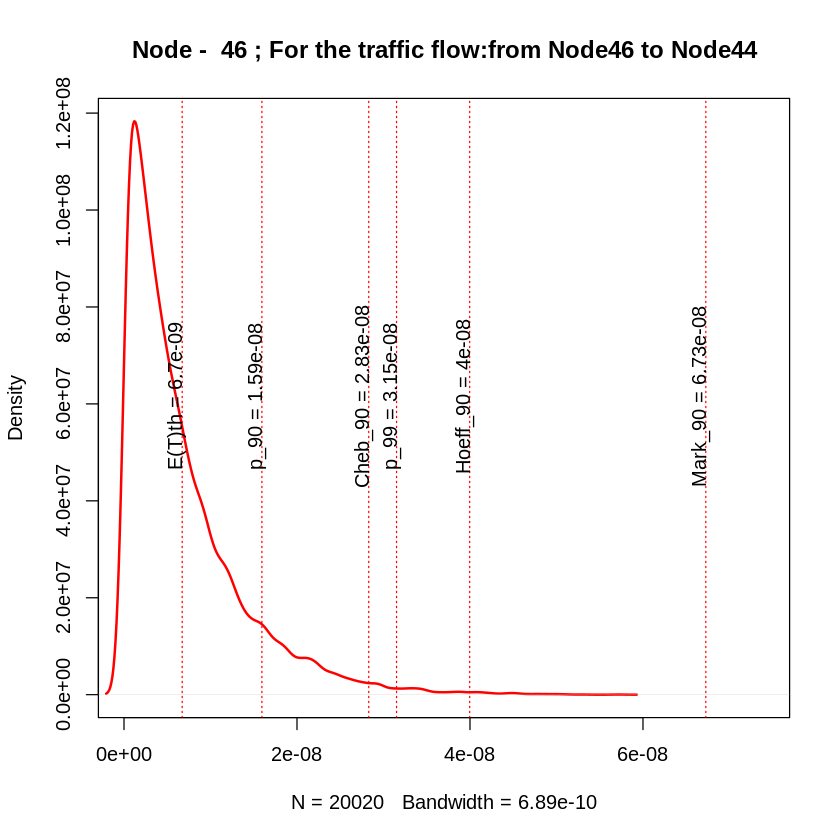

[1] 47
+ 1/202 edge from edd41aa (vertex names):
[1] Node47->Node43
[1] "traffic_Node47_Node43_"
[1] 47
[1] "Node -  47 :"
[1] "variance= 3.50662619021771e-18"
[1] "sigma2= 1.87259877982917e-09"
[1] "igraph E(T) = 1.76607622988682e-09"
[1] "simmer E(T) = 1.80971570135342e-09"


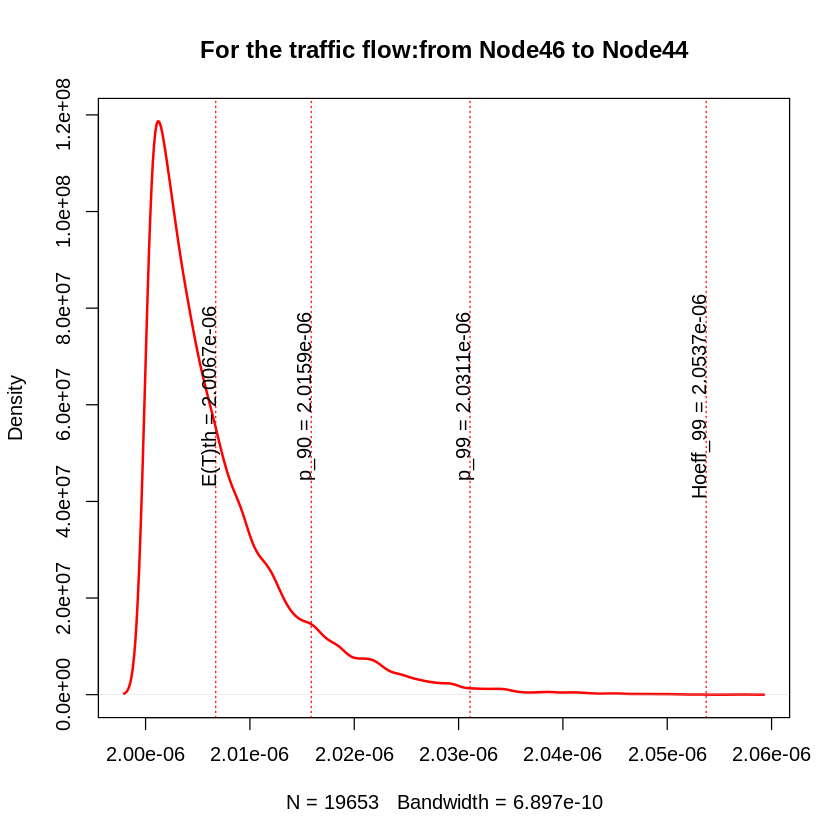

+ 1/202 edge from edd41aa (vertex names):
[1] Node47->Node43
[1] "variance= 3.4930999661055e-18"
[1] "sigma2= 1.86898367197402e-09"
[1] "igraph E(T) = 2.00176607622989e-06"
[1] "simmer E(T) = 2.00180817155034e-06"


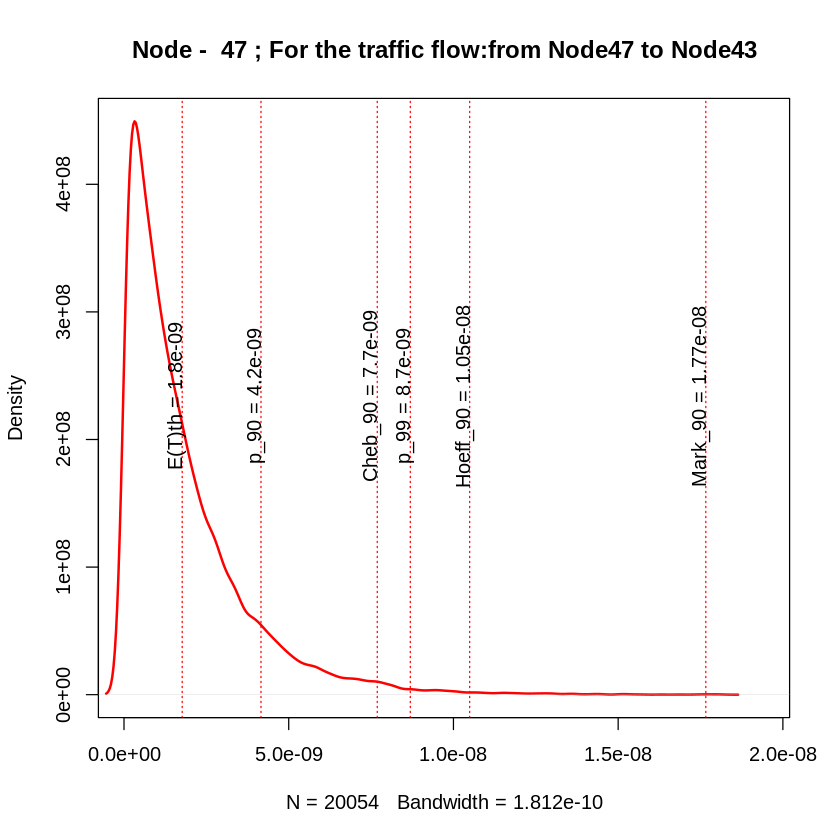

[1] 48
+ 1/202 edge from edd41aa (vertex names):
[1] Node48->Node43
[1] "traffic_Node48_Node43_"
[1] 48
[1] "Node -  48 :"
[1] "variance= 2.83601870529516e-17"
[1] "sigma2= 5.32542834455141e-09"
[1] "igraph E(T) = 5.27237376734471e-09"
[1] "simmer E(T) = 5.35207323468943e-09"


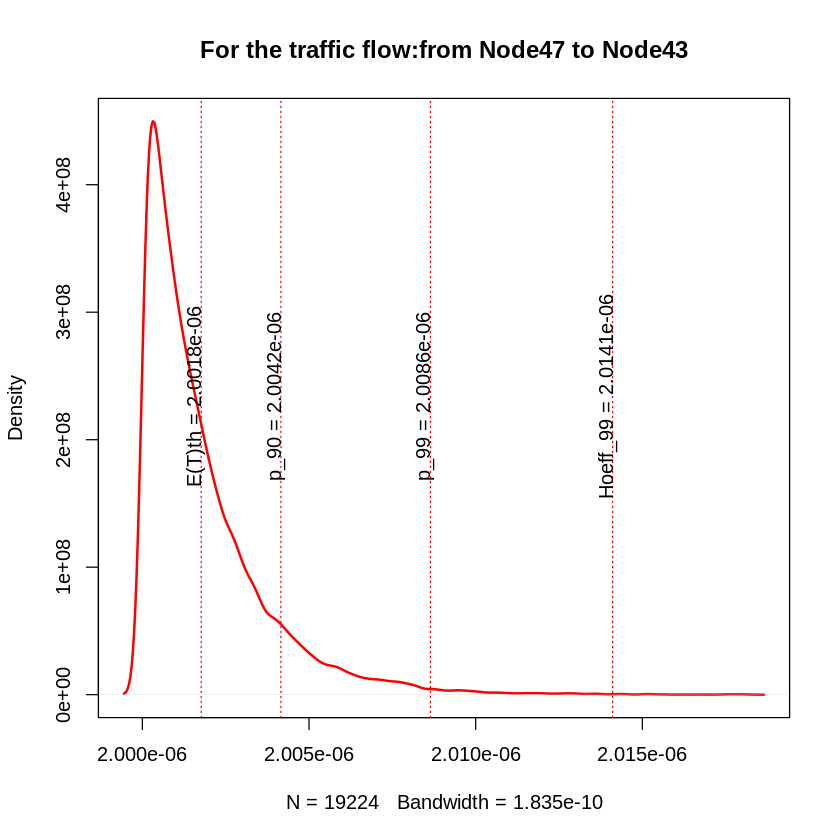

+ 1/202 edge from edd41aa (vertex names):
[1] Node48->Node43
[1] "variance= 2.7858302931402e-17"
[1] "sigma2= 5.27809652539644e-09"
[1] "igraph E(T) = 2.00527237376734e-06"
[1] "simmer E(T) = 2.00532433997747e-06"


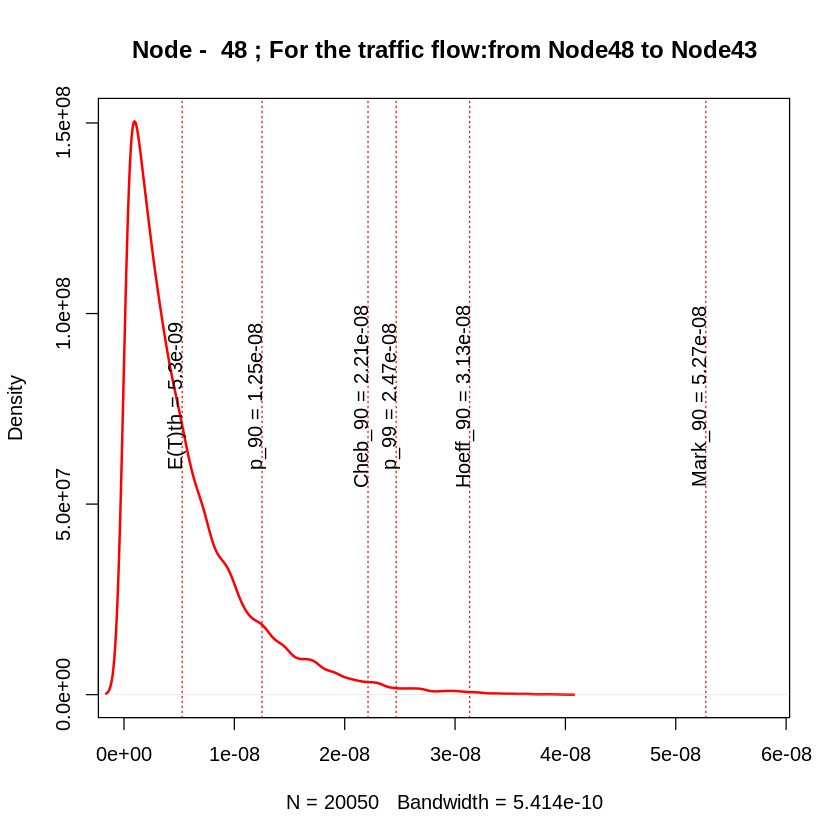

[1] 49
+ 1/202 edge from edd41aa (vertex names):
[1] Node49->Node42
[1] "traffic_Node49_Node42_"
[1] 49
[1] "Node -  49 :"
[1] "variance= 3.60226741898722e-17"
[1] "sigma2= 6.00188921839384e-09"
[1] "igraph E(T) = 5.44071856775188e-09"
[1] "simmer E(T) = 5.7251229692428e-09"


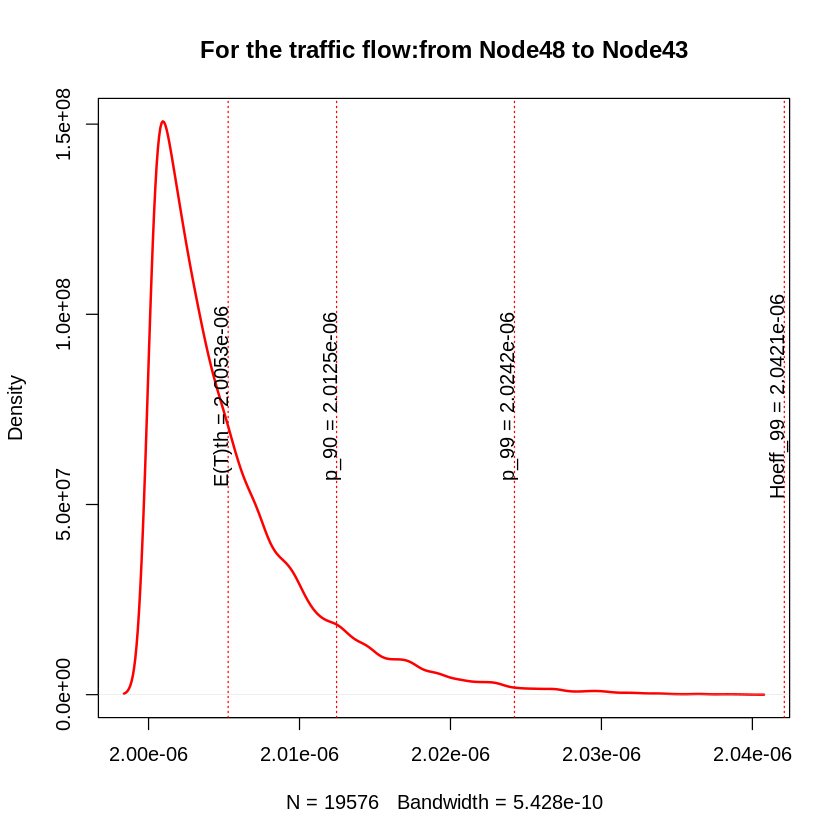

+ 1/202 edge from edd41aa (vertex names):
[1] Node49->Node42
[1] "variance= 3.51943145470551e-17"
[1] "sigma2= 5.93247962887823e-09"
[1] "igraph E(T) = 2.00544071856775e-06"
[1] "simmer E(T) = 2.00567390260515e-06"


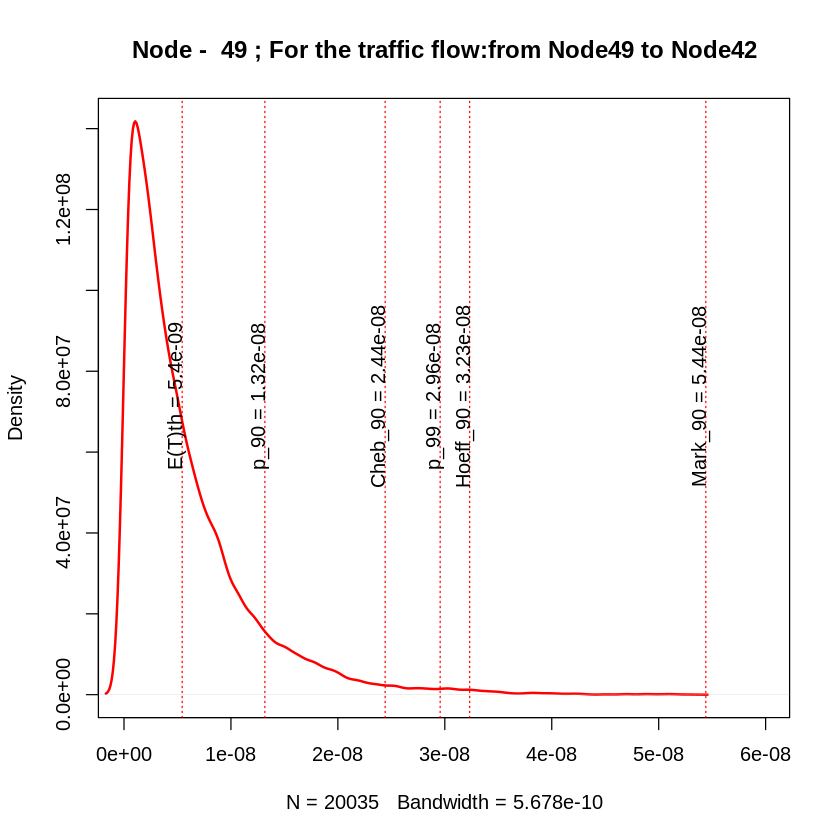

[1] 50
+ 1/202 edge from edd41aa (vertex names):
[1] Node50->Node41
[1] "traffic_Node50_Node41_"
[1] 50
[1] "Node -  50 :"
[1] "variance= 7.30531218799396e-16"
[1] "sigma2= 2.70283410293602e-08"
[1] "igraph E(T) = 2.5006826018104e-08"
[1] "simmer E(T) = 2.56743524210199e-08"


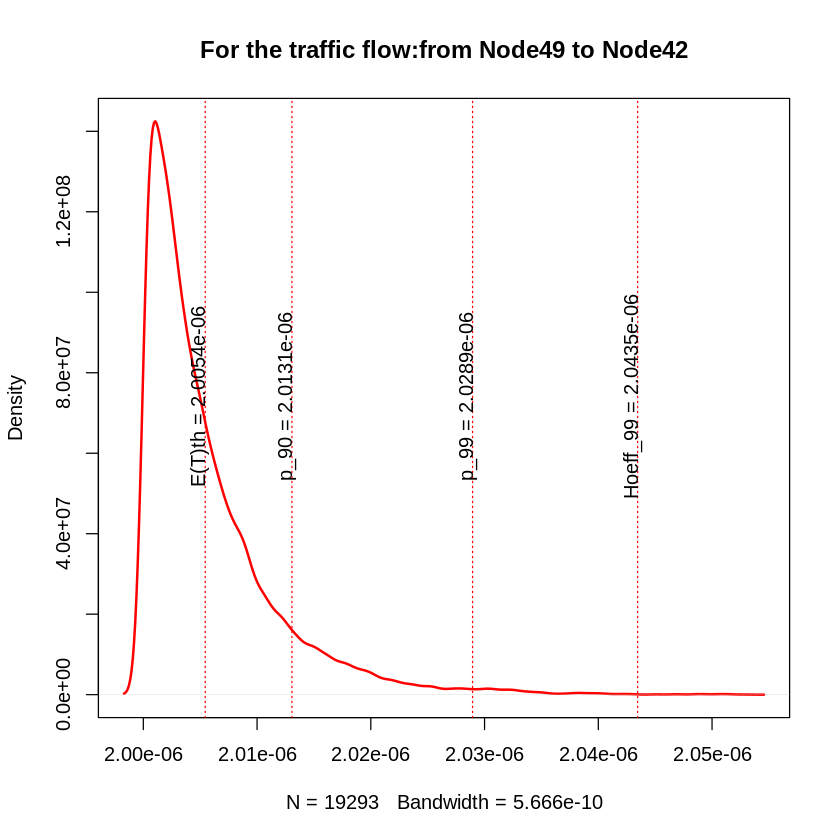

+ 1/202 edge from edd41aa (vertex names):
[1] Node50->Node41
[1] "variance= 7.27494770981333e-16"
[1] "sigma2= 2.6972110984892e-08"
[1] "igraph E(T) = 2.0250068260181e-06"
[1] "simmer E(T) = 2.02559684063053e-06"


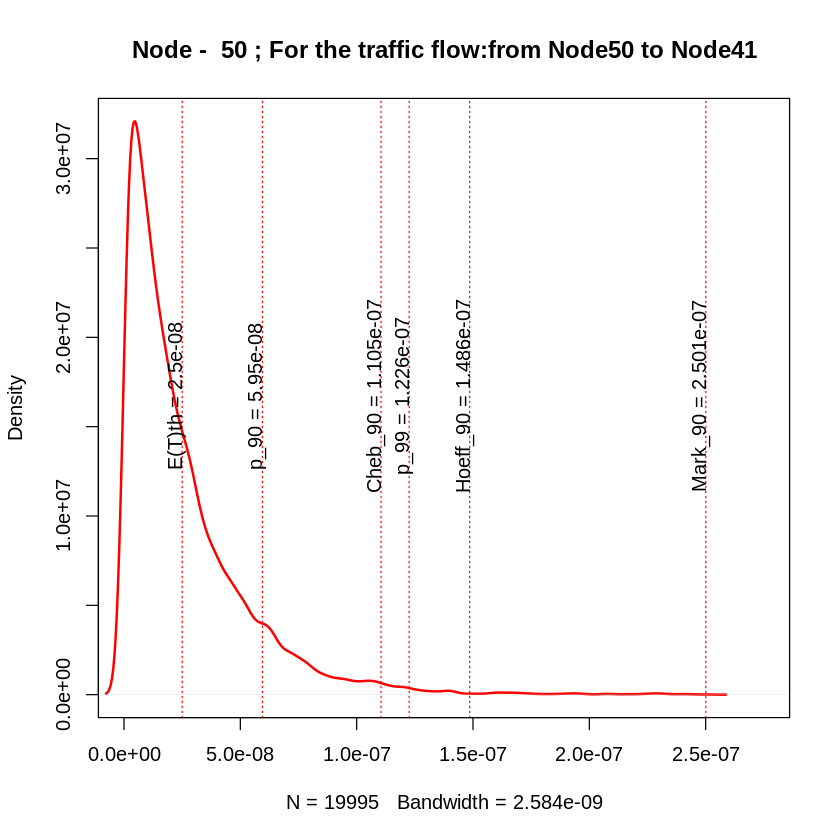

[1] 51
+ 1/202 edge from edd41aa (vertex names):
[1] Node51->Node40
[1] "traffic_Node51_Node40_"
[1] 51
[1] "Node -  51 :"
[1] "variance= 7.18443806469144e-18"
[1] "sigma2= 2.68038020897996e-09"
[1] "igraph E(T) = 2.57747712429676e-09"
[1] "simmer E(T) = 2.65070954175984e-09"


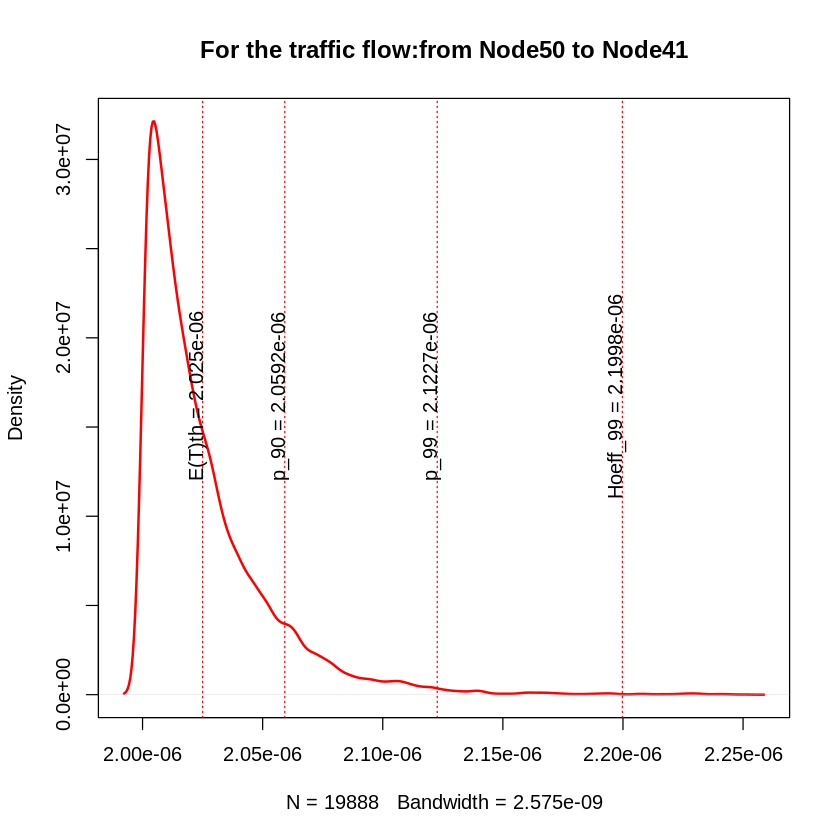

+ 1/202 edge from edd41aa (vertex names):
[1] Node51->Node40
[1] "variance= 7.10088400902354e-18"
[1] "sigma2= 2.66474839506914e-09"
[1] "igraph E(T) = 2.0025774771243e-06"
[1] "simmer E(T) = 2.00263326336675e-06"


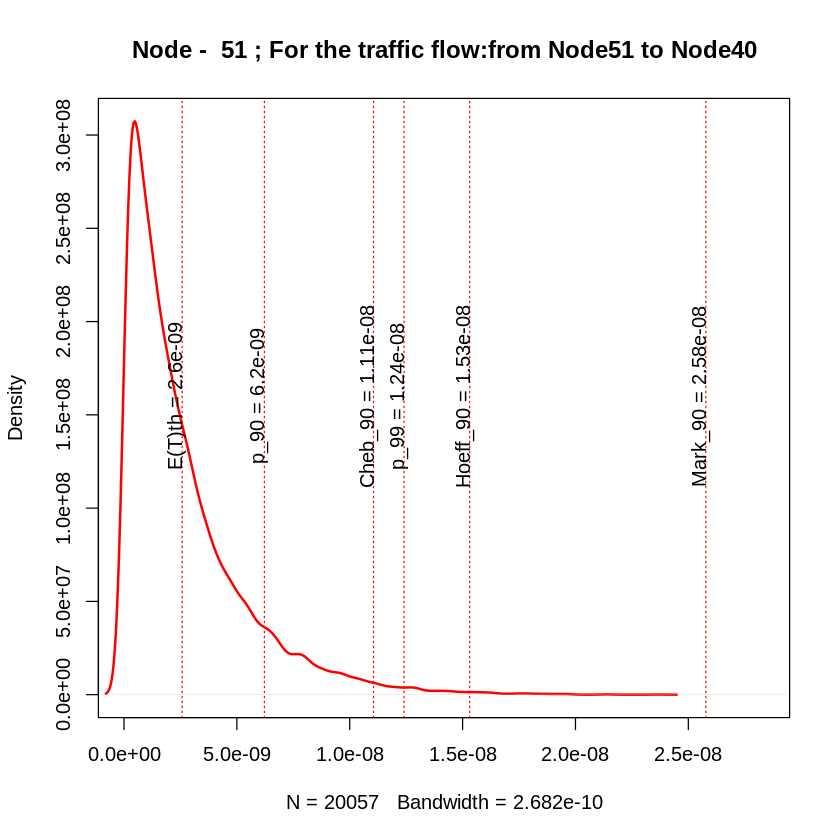

[1] 52
[1] "node_20"
[1] 1094862534
[1] 0.454394
[1] 341644914
+ 1/202 edge from edd41aa (vertex names):
[1] Node52->Node20
+ 1/202 edge from edd41aa (vertex names):
[1] Node20->Node19
[1] "traffic_Node52_Node19_"
[1] 52
[1] "Node -  52 :"
[1] "variance= 8.52640474819224e-17"
[1] "sigma2= 9.23385333877046e-09"
[1] "igraph E(T) = 8.91313858963905e-09"
[1] "simmer E(T) = 9.01283632639829e-09"


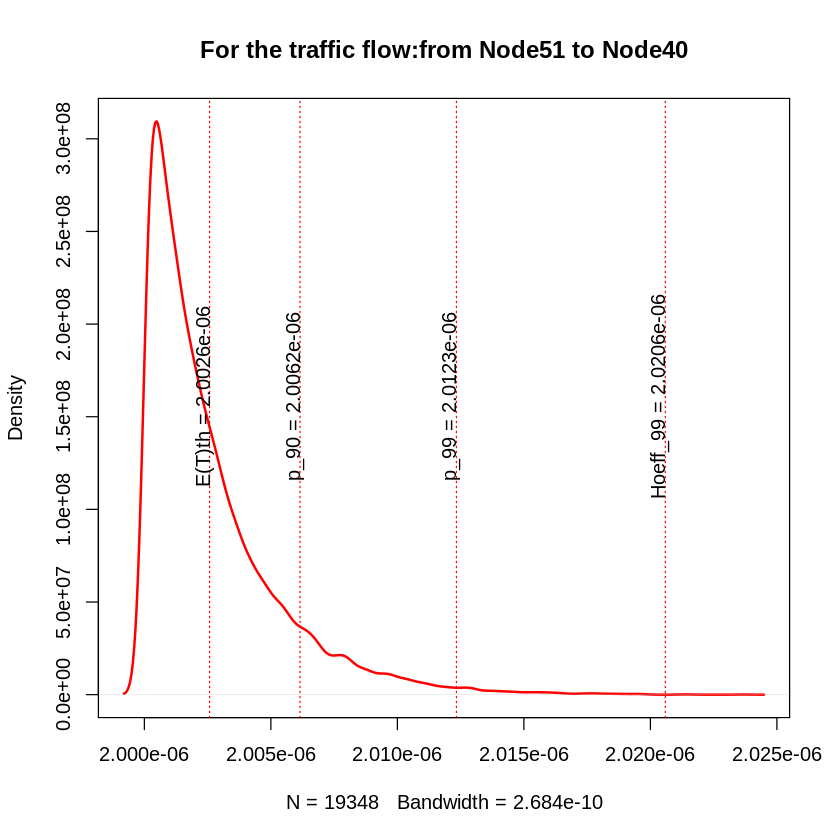

+ 1/202 edge from edd41aa (vertex names):
[1] Node52->Node20
[1] 20
[1] "Node -  20 :"
[1] "variance= 2.7298642483437e-18"
[1] "sigma2= 1.65223008335513e-09"
[1] "igraph E(T) = 1.67402245586989e-09"
[1] "simmer E(T) = 1.65291818195673e-09"


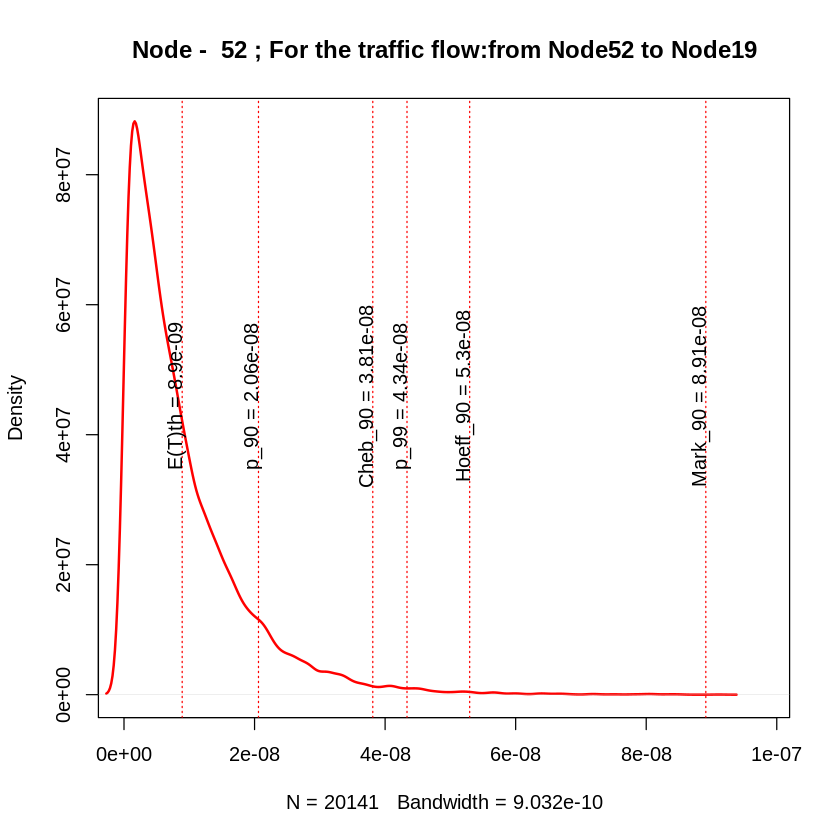

+ 1/202 edge from edd41aa (vertex names):
[1] Node20->Node19
[1] "variance= 8.95010872422078e-17"
[1] "sigma2= 9.46050142657396e-09"
[1] "igraph E(T) = 5.01058716104551e-06"
[1] "simmer E(T) = 5.01068115282565e-06"


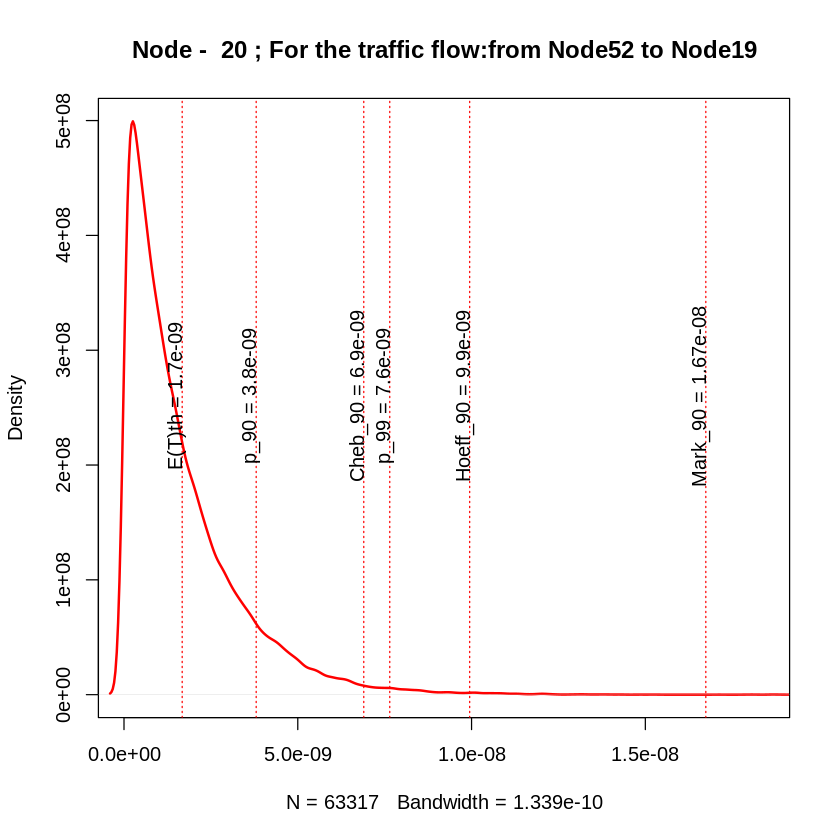

[1] 53
[1] "node_9"
[1] 158000728
[1] 0.5588641
[1] 61792039
+ 1/202 edge from edd41aa (vertex names):
[1] Node9->Node8
+ 1/202 edge from edd41aa (vertex names):
[1] Node8->Node1
[1] "traffic_Node9_Node1_"
[1] 9
[1] "Node -  9 :"
[1] "variance= 2.0894291022519e-16"
[1] "sigma2= 1.44548576687974e-08"
[1] "igraph E(T) = 1.43472461977252e-08"
[1] "simmer E(T) = 1.44916711281864e-08"


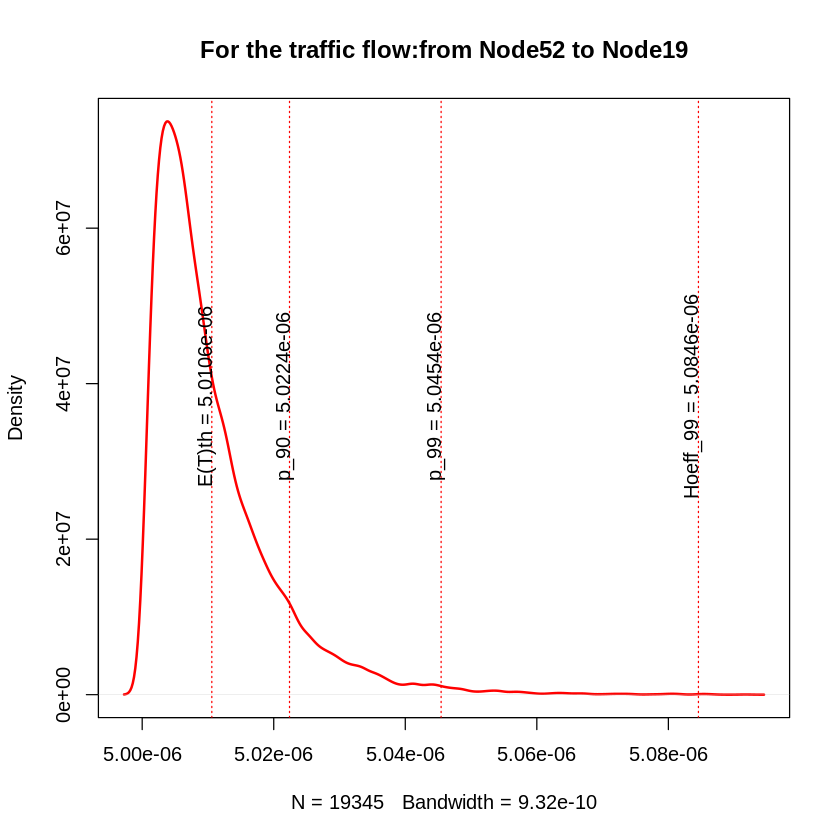

+ 1/202 edge from edd41aa (vertex names):
[1] Node9->Node8
[1] 8
[1] "Node -  8 :"
[1] "variance= 1.4134535724751e-15"
[1] "sigma2= 3.75959249450669e-08"
[1] "igraph E(T) = 3.79623150536066e-08"
[1] "simmer E(T) = 3.82261639749895e-08"


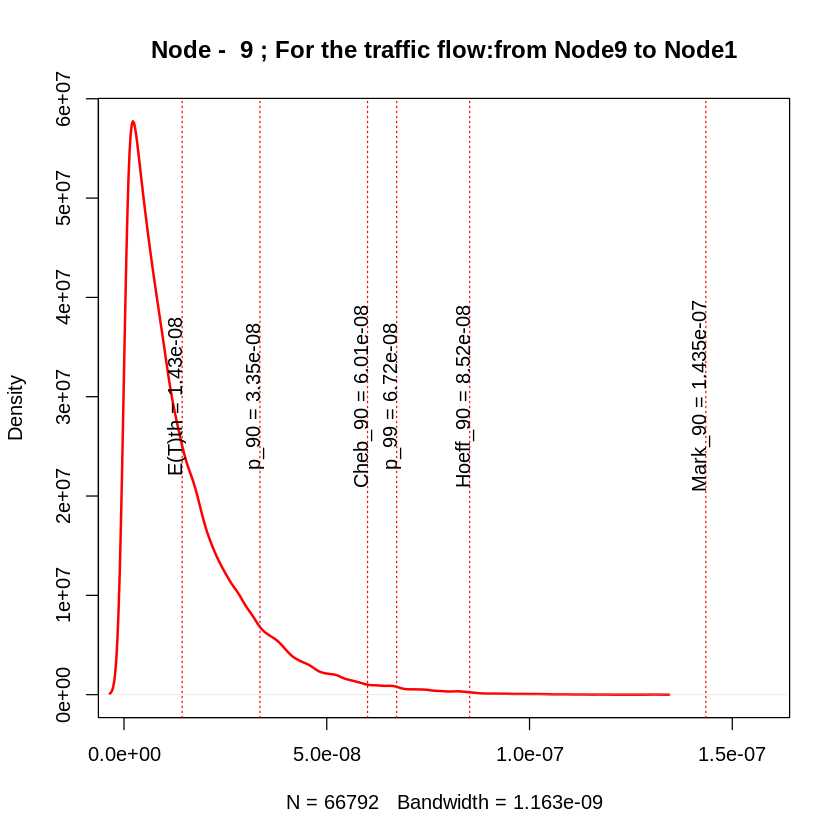

+ 1/202 edge from edd41aa (vertex names):
[1] Node8->Node1
[1] "variance= 1.61824294163731e-15"
[1] "sigma2= 4.02273904403121e-08"
[1] "igraph E(T) = 8.05230956125133e-06"
[1] "simmer E(T) = 8.05285478461433e-06"


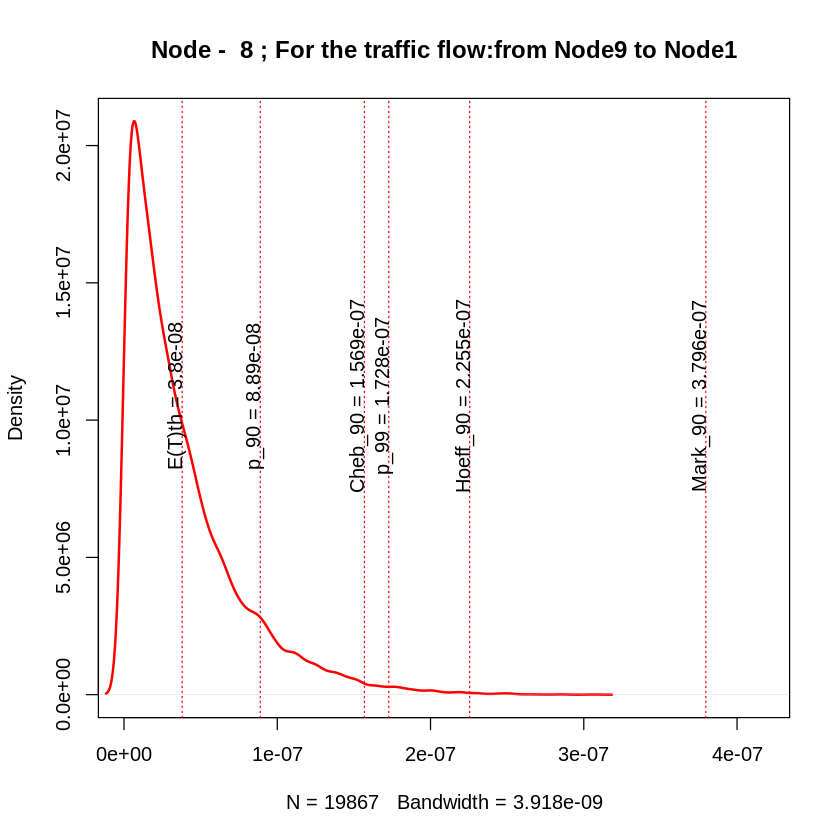

[1] 54
[1] "node_16"
[1] 101980757
[1] 0.4644952
[1] 24596064
+ 1/202 edge from edd41aa (vertex names):
[1] Node16->Node5
+ 1/202 edge from edd41aa (vertex names):
[1] Node5->Node2
[1] "traffic_Node16_Node2_"
[1] 16
[1] "Node -  16 :"
[1] "variance= 3.58110464247367e-16"
[1] "sigma2= 1.89238068117218e-08"
[1] "igraph E(T) = 1.83112666322586e-08"
[1] "simmer E(T) = 1.86875097207639e-08"


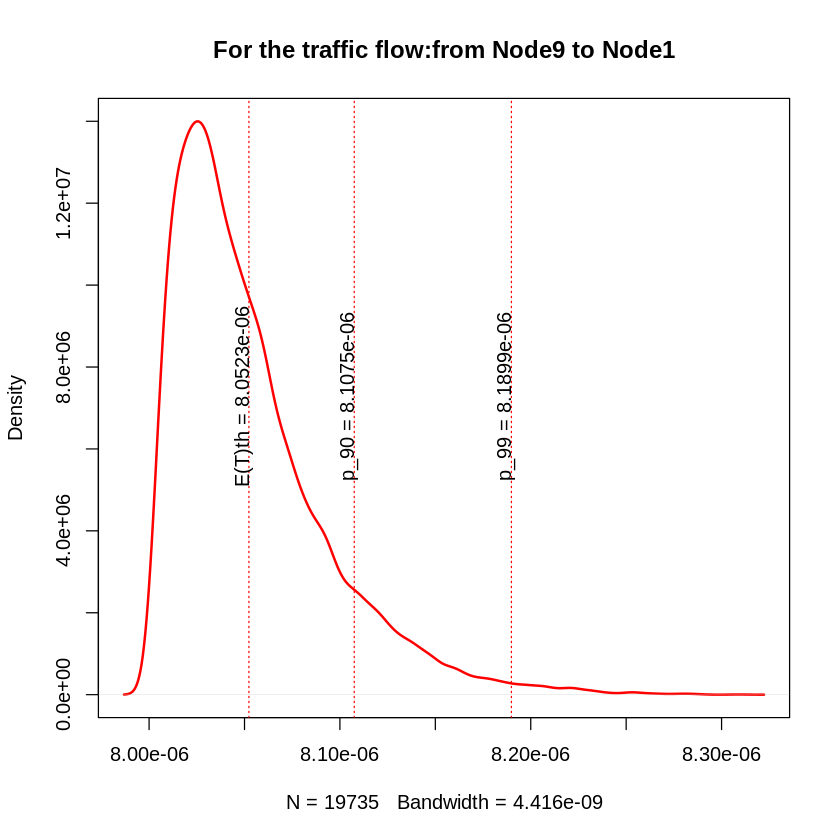

+ 1/202 edge from edd41aa (vertex names):
[1] Node16->Node5
[1] 5
[1] "Node -  5 :"
[1] "variance= 1.21249158928231e-15"
[1] "sigma2= 3.48208499218831e-08"
[1] "igraph E(T) = 3.27805593191386e-08"
[1] "simmer E(T) = 3.37314444448864e-08"


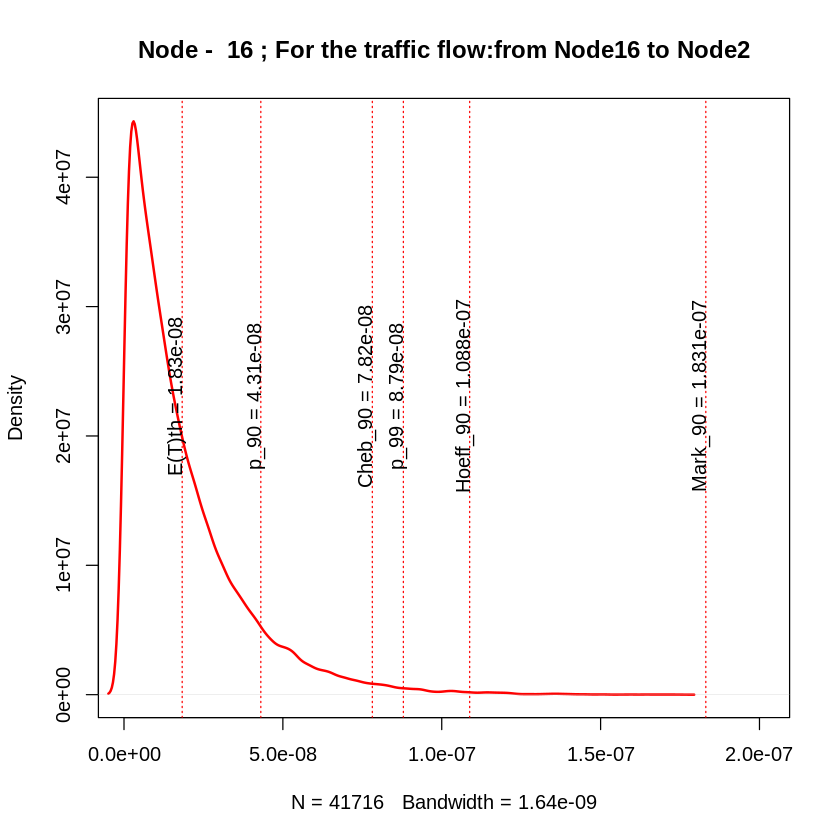

+ 1/202 edge from edd41aa (vertex names):
[1] Node5->Node2
[1] "variance= 1.5725486749283e-15"
[1] "sigma2= 3.96553738467852e-08"
[1] "igraph E(T) = 8.0510918259514e-06"
[1] "simmer E(T) = 8.05240399318882e-06"


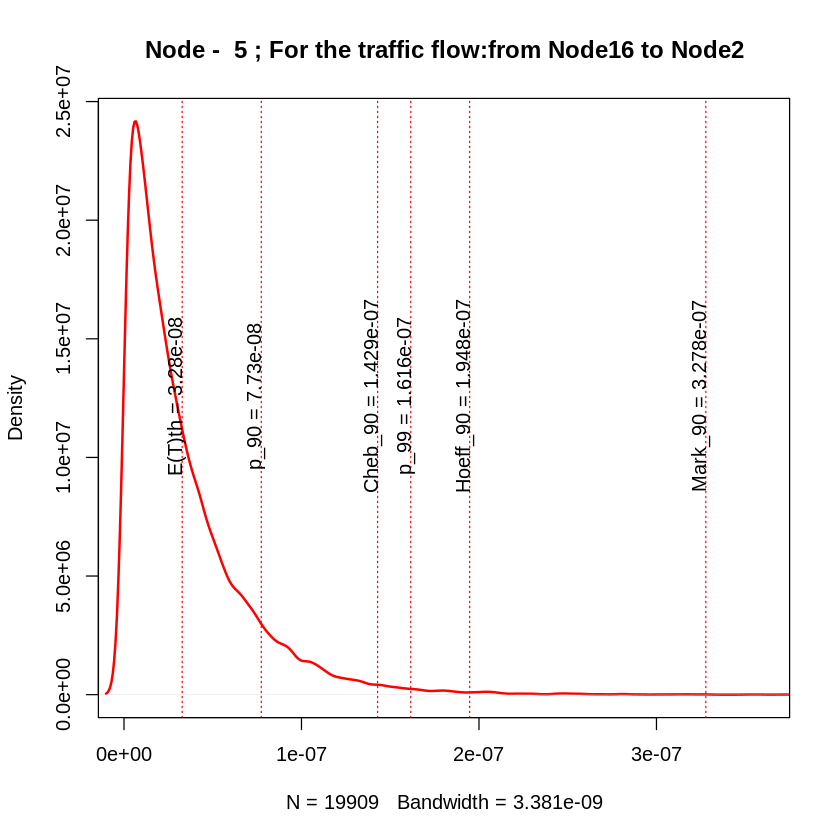

[1] 55
+ 1/202 edge from edd41aa (vertex names):
[1] Node11->Node3
[1] "traffic_Node11_Node3_"
[1] 11
[1] "Node -  11 :"
[1] "variance= 5.57622364510848e-15"
[1] "sigma2= 7.46741162994814e-08"
[1] "igraph E(T) = 6.74306505881789e-08"
[1] "simmer E(T) = 7.0110251784343e-08"


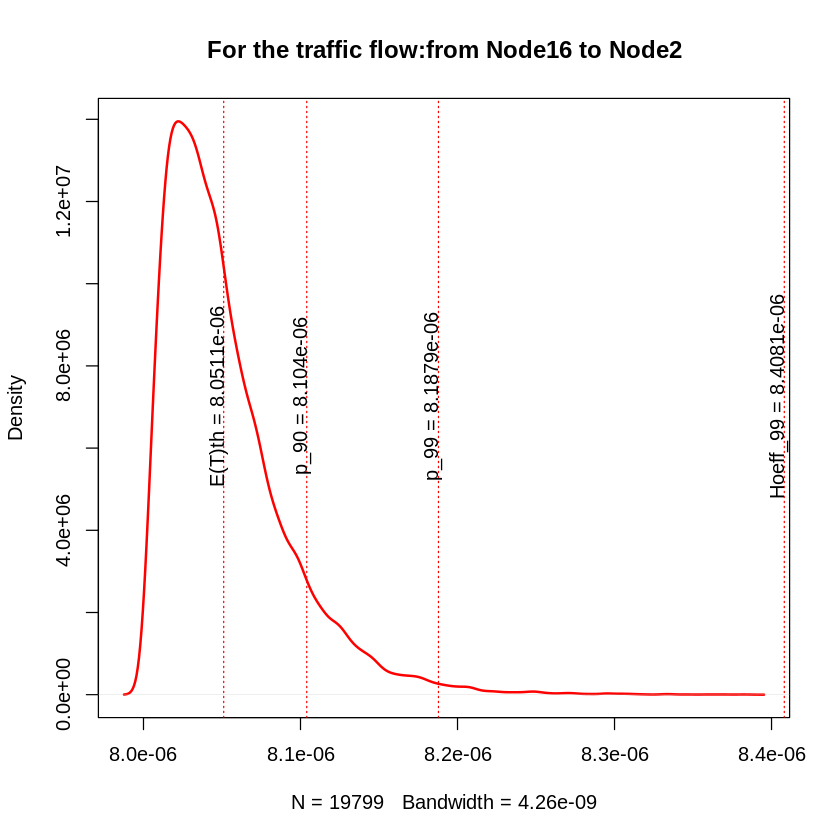

+ 1/202 edge from edd41aa (vertex names):
[1] Node11->Node3
[1] "variance= 5.58321838021754e-15"
[1] "sigma2= 7.47209366925866e-08"
[1] "igraph E(T) = 3.06743065058818e-06"
[1] "simmer E(T) = 3.07013534586226e-06"


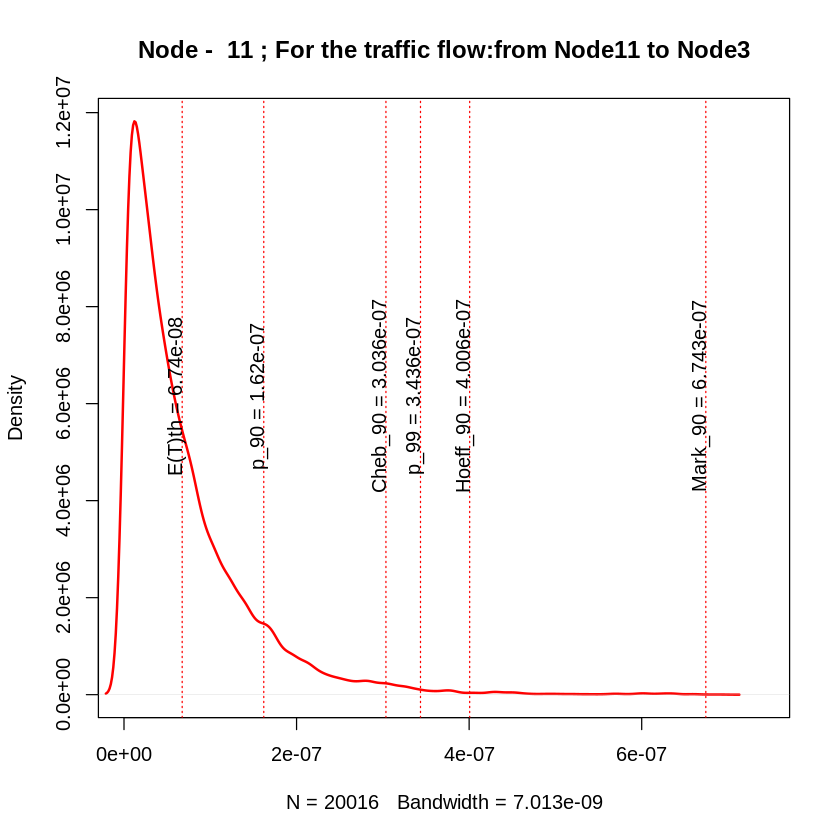

[1] 56
+ 1/202 edge from edd41aa (vertex names):
[1] Node13->Node4
[1] "traffic_Node13_Node4_"
[1] 13
[1] "Node -  13 :"
[1] "variance= 1.02295707682439e-15"
[1] "sigma2= 3.19837001740635e-08"
[1] "igraph E(T) = 3.0472133713556e-08"
[1] "simmer E(T) = 3.1788478390666e-08"


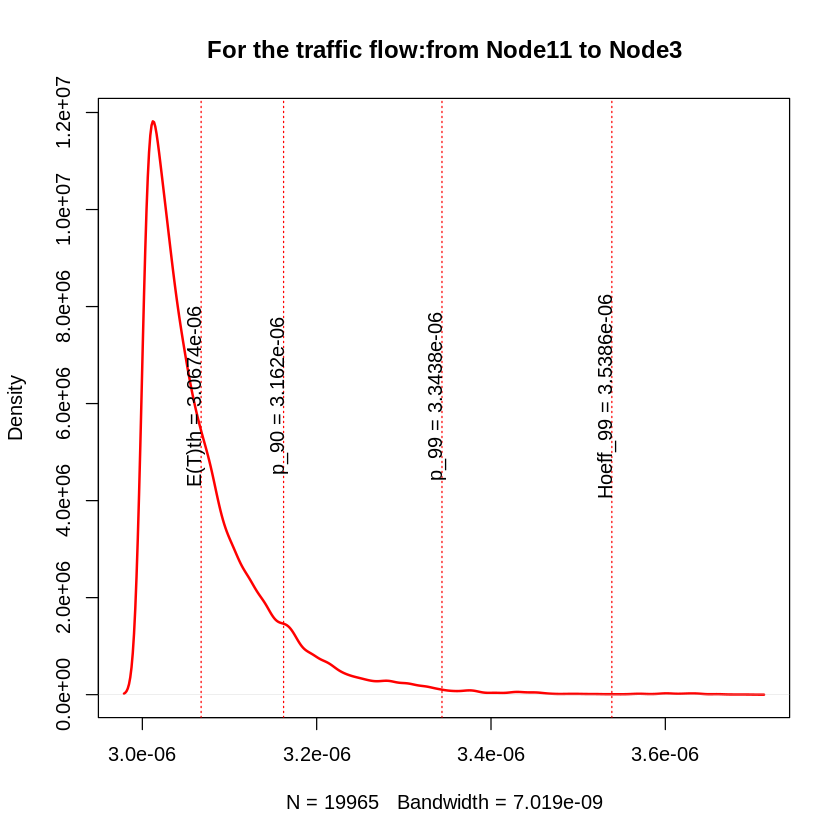

+ 1/202 edge from edd41aa (vertex names):
[1] Node13->Node4
[1] "variance= 1.01075761346808e-15"
[1] "sigma2= 3.17924144013644e-08"
[1] "igraph E(T) = 3.03047213371356e-06"
[1] "simmer E(T) = 3.03168802931404e-06"


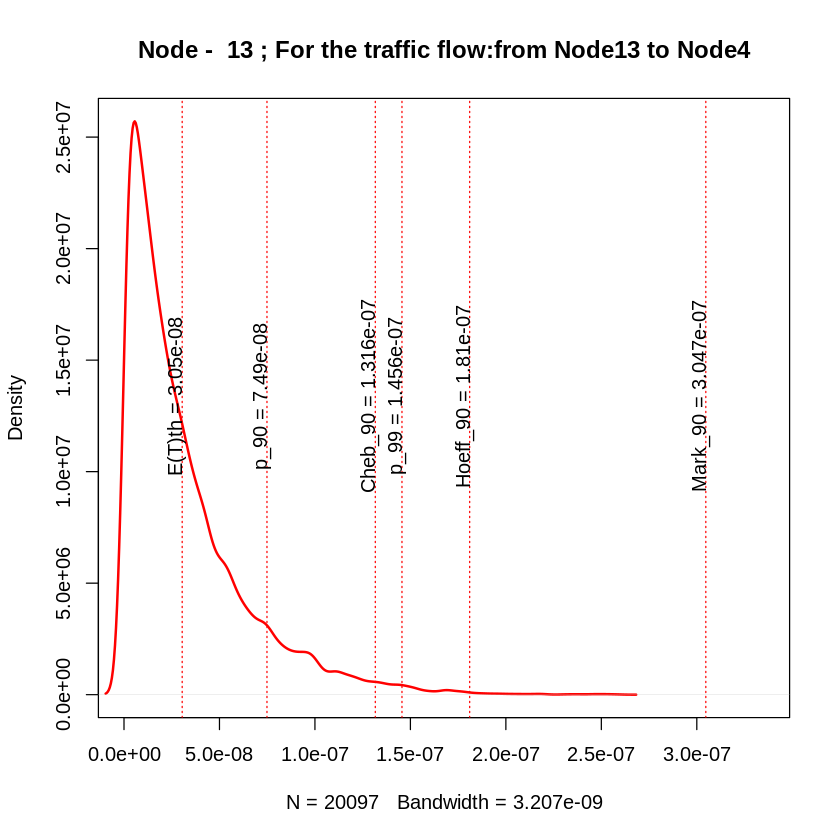

[1] 57
[1] "node_16"
[1] 101980757
[1] 0.4644952
[1] 22773506
+ 1/202 edge from edd41aa (vertex names):
[1] Node16->Node5
[1] "traffic_Node16_Node5_"
[1] 16
[1] "Node -  16 :"
[1] "variance= 3.50282975372192e-16"
[1] "sigma2= 1.87158482407876e-08"
[1] "igraph E(T) = 1.83112666322586e-08"
[1] "simmer E(T) = 1.8427812963514e-08"


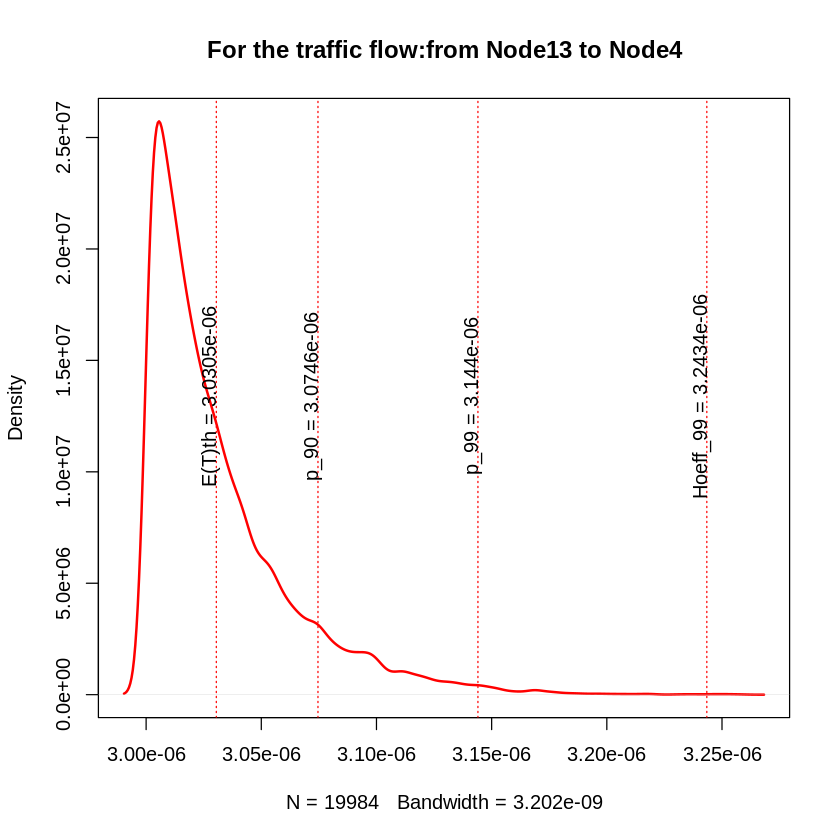

+ 1/202 edge from edd41aa (vertex names):
[1] Node16->Node5
[1] "variance= 3.49965649471253e-16"
[1] "sigma2= 1.87073688548458e-08"
[1] "igraph E(T) = 3.01831126663226e-06"
[1] "simmer E(T) = 3.01847078800666e-06"


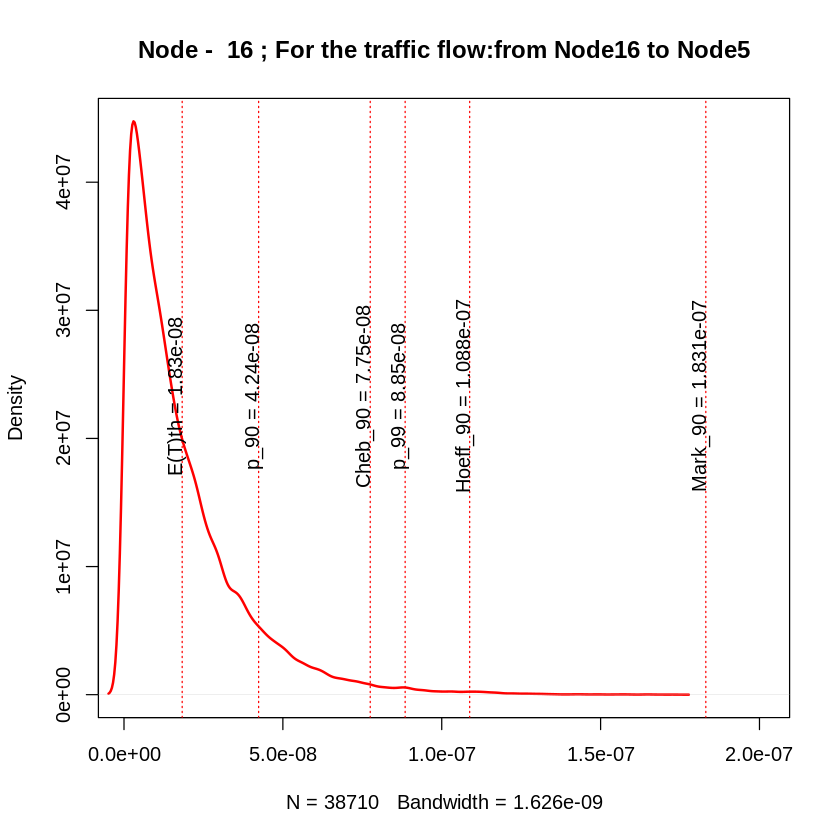

[1] 58
+ 1/202 edge from edd41aa (vertex names):
[1] Node19->Node6
[1] "traffic_Node19_Node6_"
[1] 19
[1] "Node -  19 :"
[1] "variance= 2.41985122894445e-16"
[1] "sigma2= 1.55558710104721e-08"
[1] "igraph E(T) = 1.54807320762675e-08"
[1] "simmer E(T) = 1.55739845353102e-08"


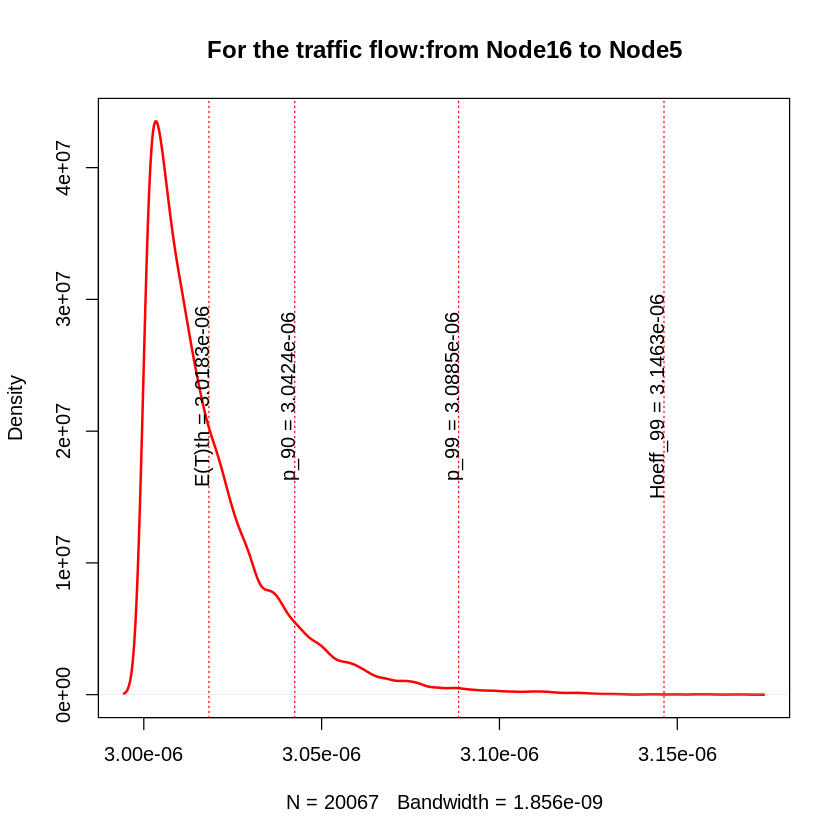

+ 1/202 edge from edd41aa (vertex names):
[1] Node19->Node6
[1] "variance= 2.41028885098704e-16"
[1] "sigma2= 1.55251049947723e-08"
[1] "igraph E(T) = 3.01548073207627e-06"
[1] "simmer E(T) = 3.01554398286459e-06"


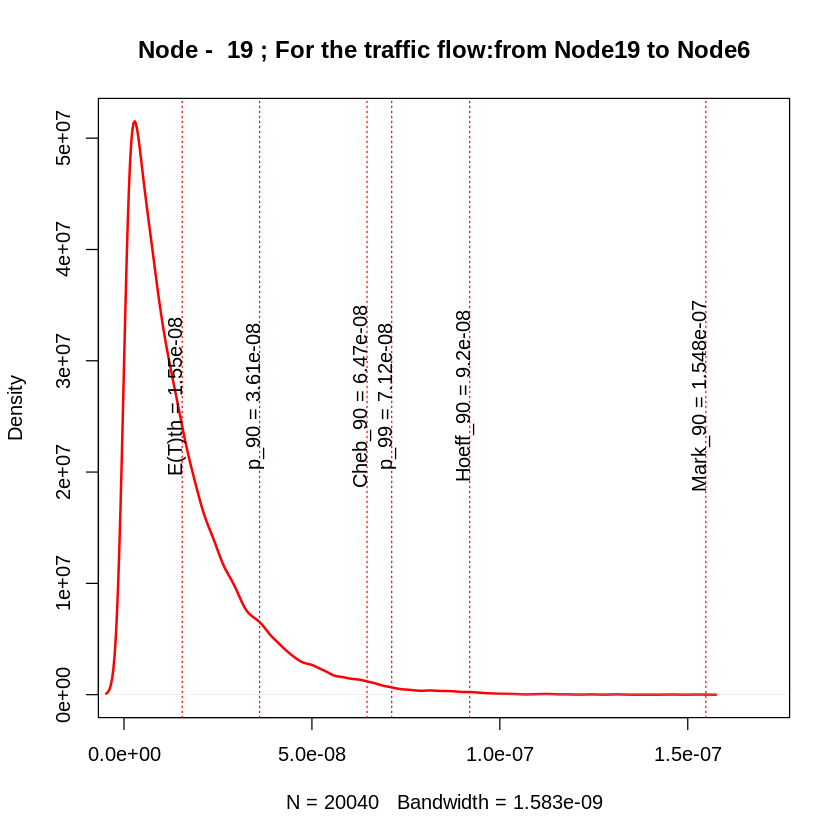

[1] 59
[1] "node_9"
[1] 158000728
[1] 0.5588641
[1] 52617182
+ 1/202 edge from edd41aa (vertex names):
[1] Node9->Node8
+ 1/202 edge from edd41aa (vertex names):
[1] Node8->Node7
[1] "traffic_Node9_Node7_"
[1] 9
[1] "Node -  9 :"
[1] "variance= 2.20199337157718e-16"
[1] "sigma2= 1.48391151069637e-08"
[1] "igraph E(T) = 1.43472461977252e-08"
[1] "simmer E(T) = 1.45967662255268e-08"


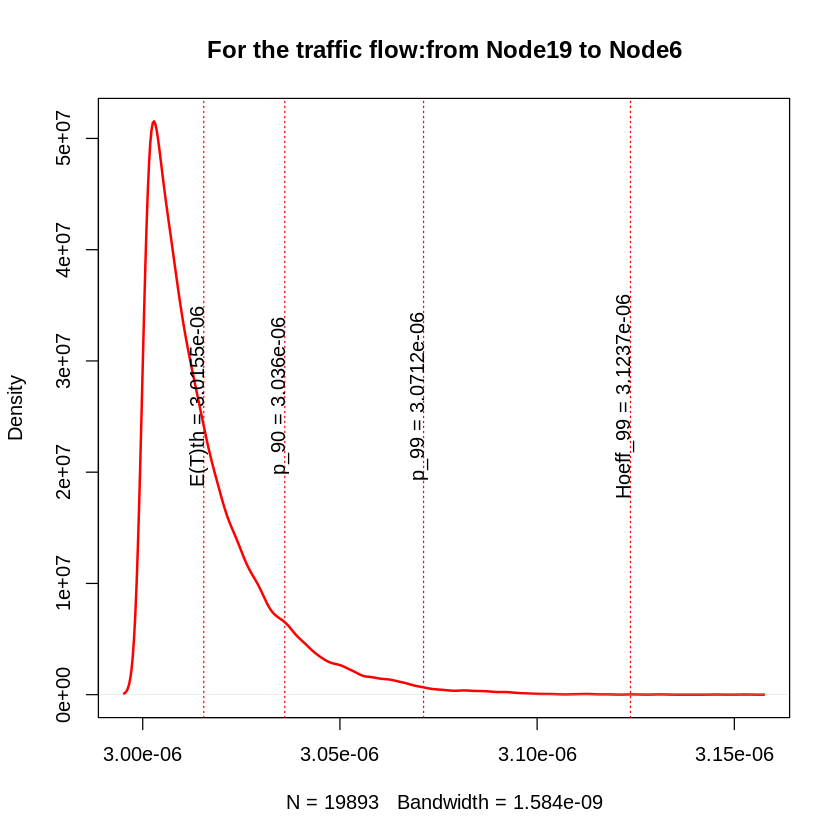

+ 1/202 edge from edd41aa (vertex names):
[1] Node9->Node8
[1] 8
[1] "Node -  8 :"
[1] "variance= 6.16138520656661e-16"
[1] "sigma2= 2.48221377132724e-08"
[1] "igraph E(T) = 2.48386800641398e-08"
[1] "simmer E(T) = 2.45137119570715e-08"


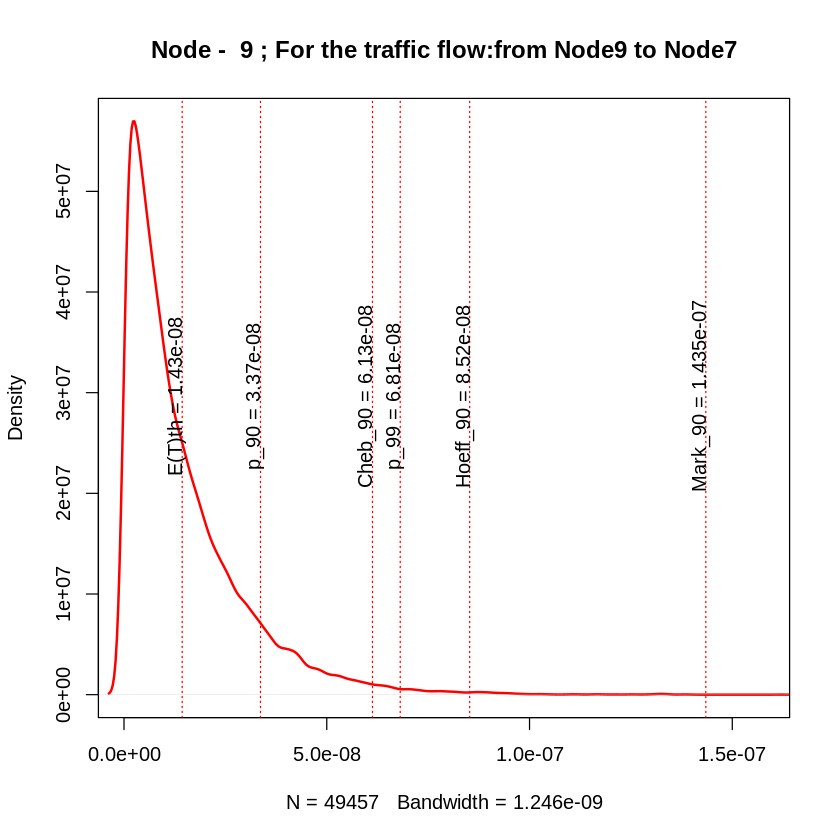

+ 1/202 edge from edd41aa (vertex names):
[1] Node8->Node7
[1] "variance= 8.27745003507193e-16"
[1] "sigma2= 2.87705579283265e-08"
[1] "igraph E(T) = 7.03918592626186e-06"
[1] "simmer E(T) = 7.0391199561248e-06"


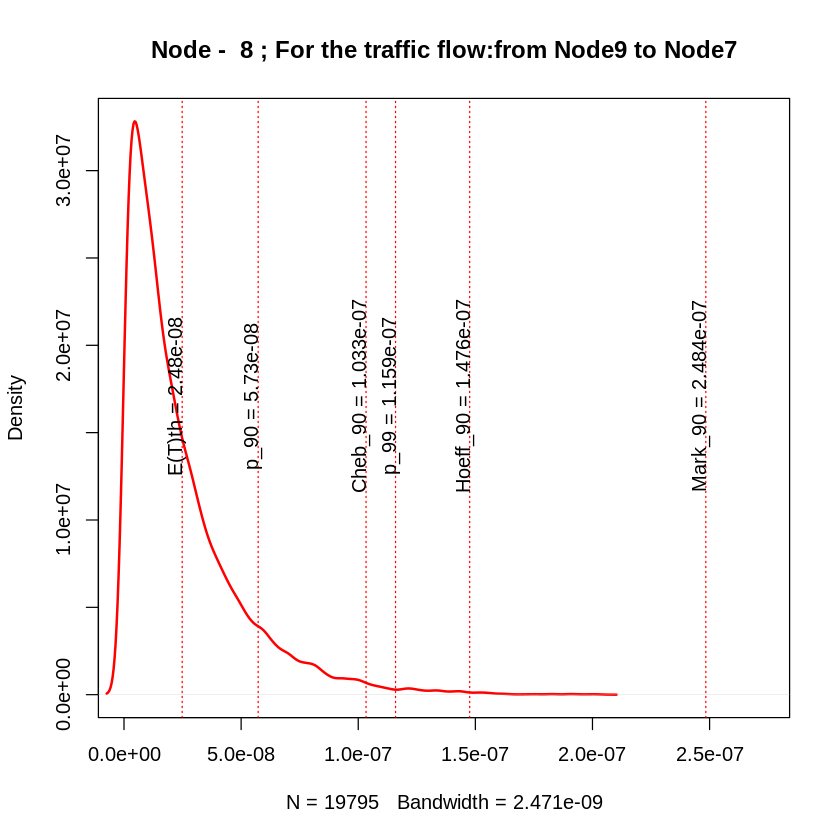

[1] 60
[1] "node_9"
[1] 158000728
[1] 0.5588641
[1] 62192663
+ 1/202 edge from edd41aa (vertex names):
[1] Node9->Node8
[1] "traffic_Node9_Node8_"
[1] 9
[1] "Node -  9 :"
[1] "variance= 2.07142463821468e-16"
[1] "sigma2= 1.4392444678423e-08"
[1] "igraph E(T) = 1.43472461977252e-08"
[1] "simmer E(T) = 1.43847346892613e-08"


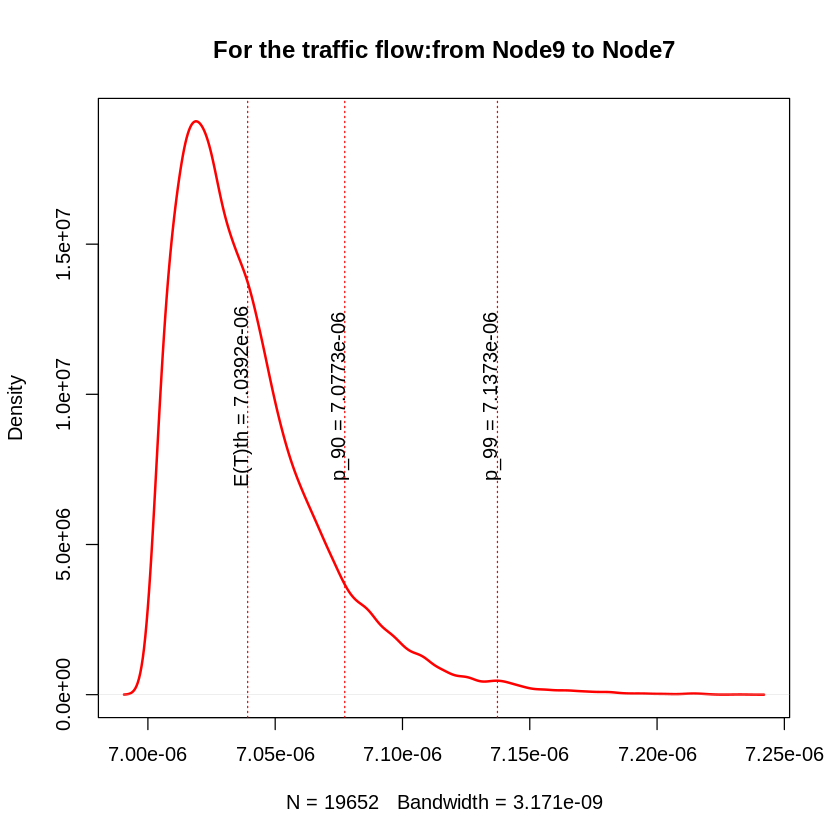

+ 1/202 edge from edd41aa (vertex names):
[1] Node9->Node8
[1] "variance= 2.08088800001992e-16"
[1] "sigma2= 1.44252833595043e-08"
[1] "igraph E(T) = 3.01434724619772e-06"
[1] "simmer E(T) = 3.01442716603907e-06"


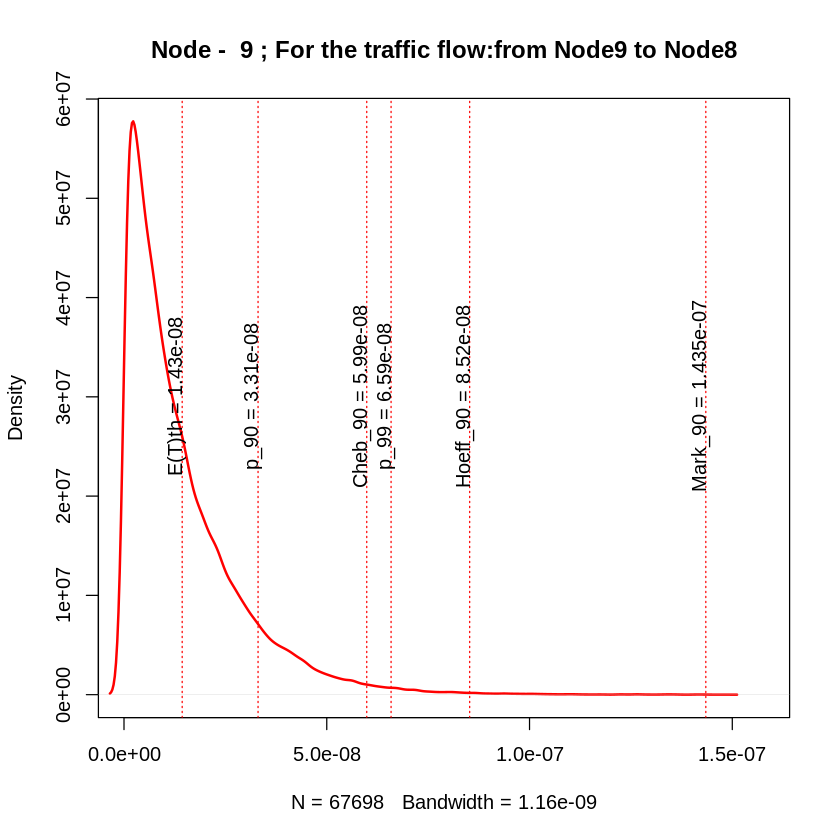

[1] 61
[1] "no info of traffic"
 [1] 8.005539e-06 8.008184e-06 3.006111e-06 3.005349e-06 3.004616e-06
 [6] 3.003062e-06 7.003539e-06 3.001299e-06 0.000000e+00 0.000000e+00
[11] 0.000000e+00 0.000000e+00 0.000000e+00 0.000000e+00 0.000000e+00
[16] 0.000000e+00 0.000000e+00 0.000000e+00 0.000000e+00 3.001689e-06
[21] 3.002273e-06 3.005242e-06 3.005605e-06 3.003239e-06 2.001487e-06
[26] 2.005659e-06 2.004245e-06 2.005752e-06 2.005420e-06 2.002807e-06
[31] 2.002393e-06 2.001848e-06 2.007887e-06 2.007426e-06 2.003477e-06
[36] 2.004624e-06 2.001988e-06 2.002497e-06 2.007551e-06 0.000000e+00
[41] 0.000000e+00 0.000000e+00 0.000000e+00 0.000000e+00 2.015275e-06
[46] 2.006777e-06 2.001808e-06 2.005324e-06 2.005674e-06 2.025597e-06
[51] 2.002633e-06 5.010681e-06 8.052855e-06 8.052404e-06 3.070135e-06
[56] 3.031688e-06 3.018471e-06 3.015544e-06 7.039120e-06 3.014427e-06
[61] 0.000000e+00
[1] 62
[1] "no info of traffic"
 [1] 8.005539e-06 8.008184e-06 3.006111e-06 3.005349e-06 3.004616e-06
 [6] 3.0

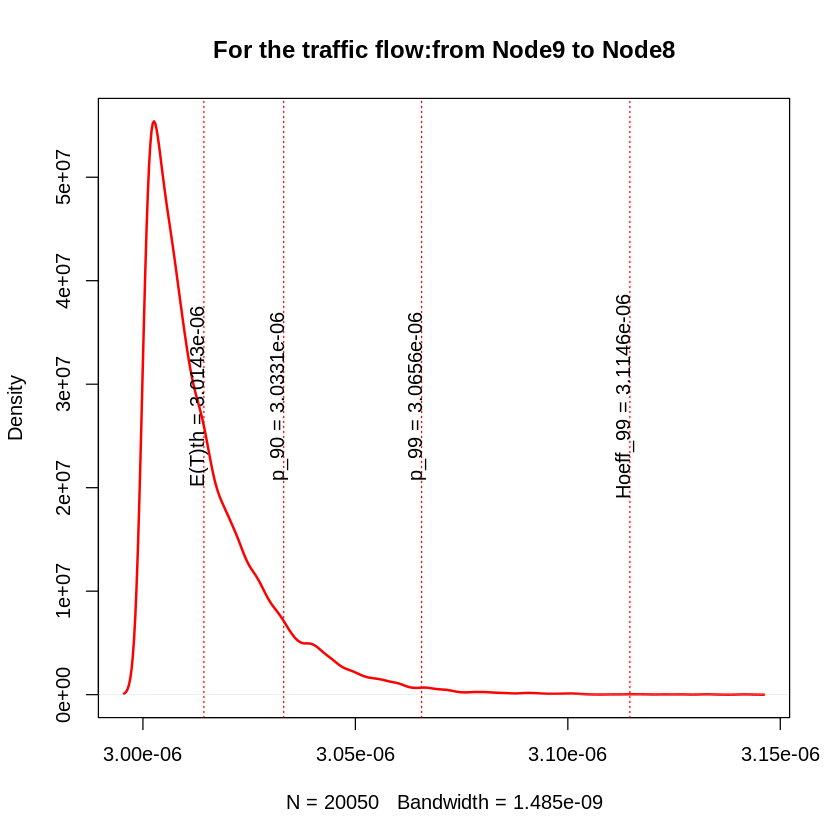

+ 1/202 edge from edd41aa (vertex names):
[1] Node19->Node20
[1] "variance= 3.76529363304304e-16"
[1] "sigma2= 1.94043645426565e-08"
[1] "igraph E(T) = 3.0194165759733e-06"
[1] "simmer E(T) = 3.01929397920455e-06"


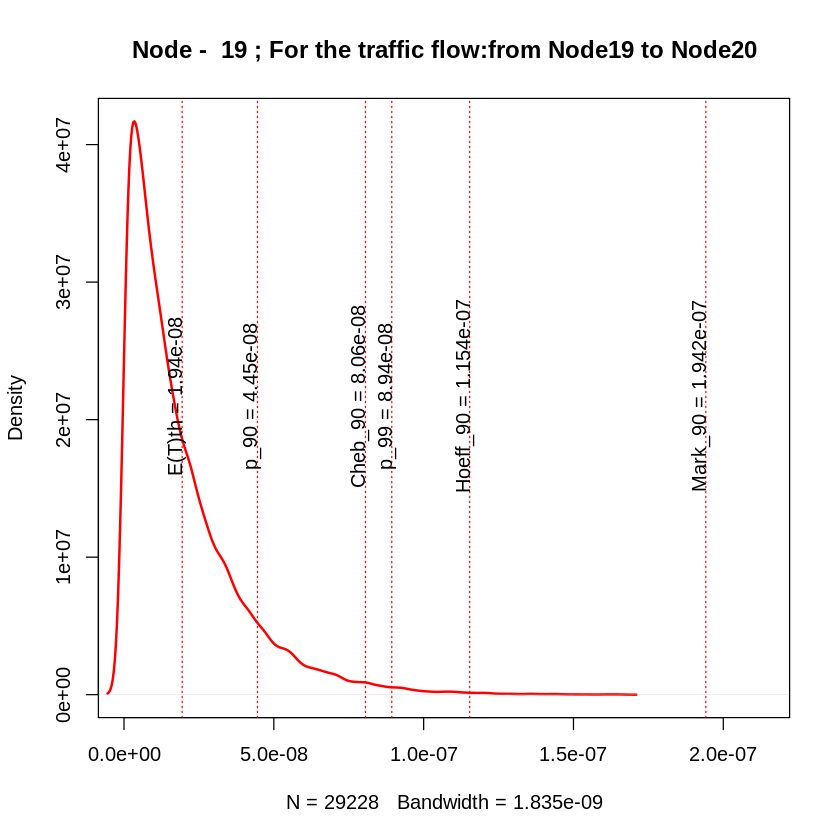

[1] 73
+ 1/202 edge from edd41aa (vertex names):
[1] Node40->Node21
[1] "traffic_Node40_Node21_"
[1] 40
[1] "Node -  40 :"
[1] "variance= 3.45182560729784e-16"
[1] "sigma2= 1.85790893407019e-08"
[1] "igraph E(T) = 1.74858538808881e-08"
[1] "simmer E(T) = 1.79536144531473e-08"


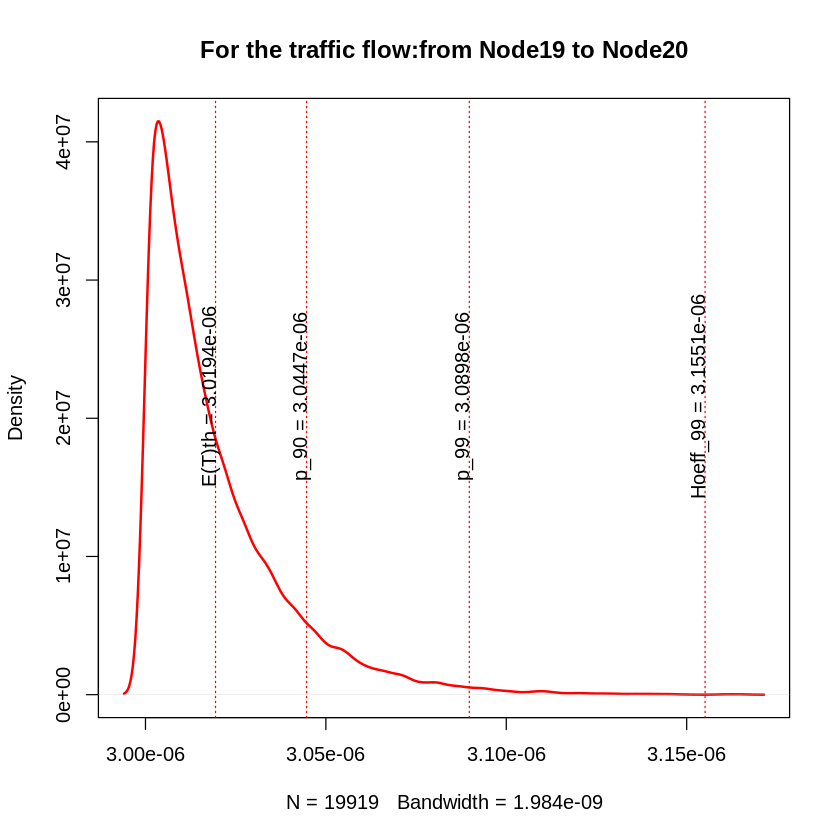

+ 1/202 edge from edd41aa (vertex names):
[1] Node40->Node21
[1] "variance= 3.45490180739791e-16"
[1] "sigma2= 1.85873661592973e-08"
[1] "igraph E(T) = 3.01748585388089e-06"
[1] "simmer E(T) = 3.01794454319937e-06"


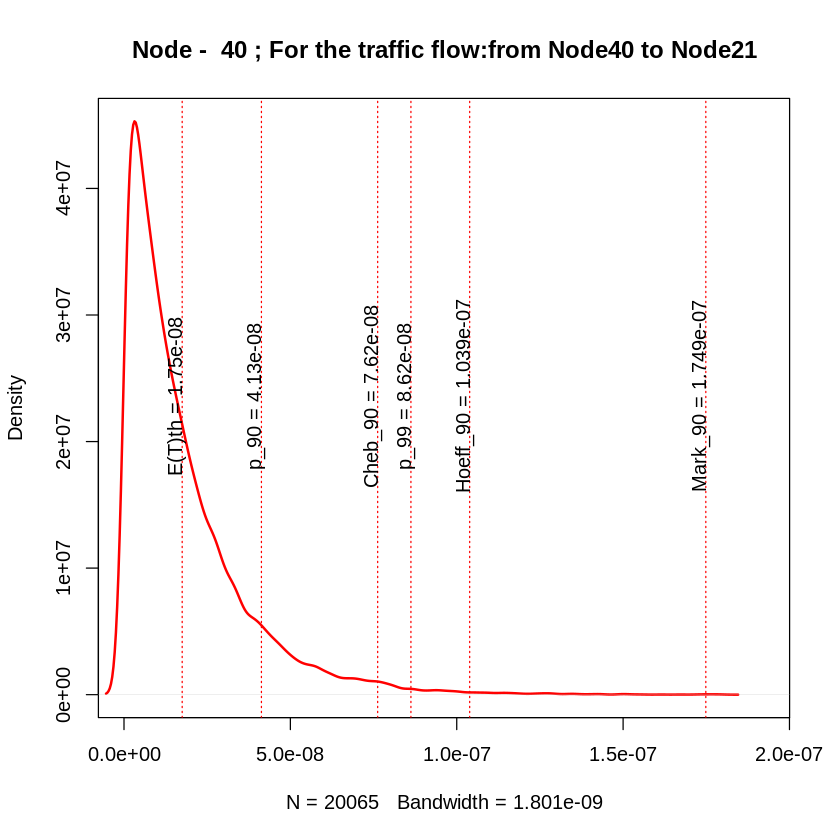

[1] 74
+ 1/202 edge from edd41aa (vertex names):
[1] Node41->Node22
[1] "traffic_Node41_Node22_"
[1] 41
[1] "Node -  41 :"
[1] "variance= 4.12228114679143e-16"
[1] "sigma2= 2.03034015543983e-08"
[1] "igraph E(T) = 2.00536079597196e-08"
[1] "simmer E(T) = 2.02558164200365e-08"


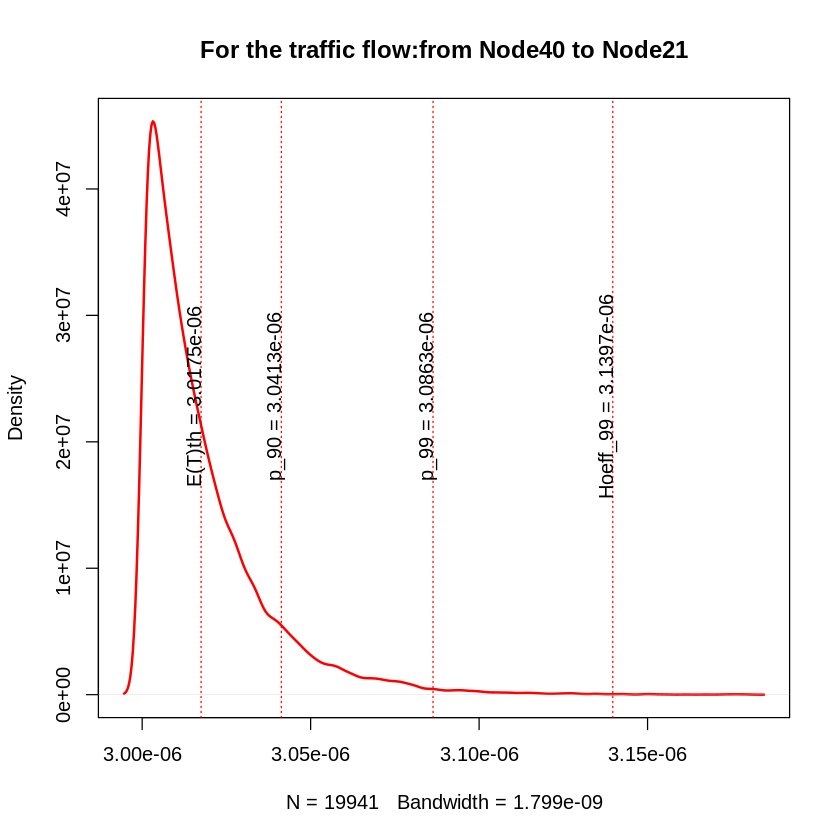

+ 1/202 edge from edd41aa (vertex names):
[1] Node41->Node22
[1] "variance= 4.11095882909096e-16"
[1] "sigma2= 2.0275499572368e-08"
[1] "igraph E(T) = 3.02005360795972e-06"
[1] "simmer E(T) = 3.02022713539071e-06"


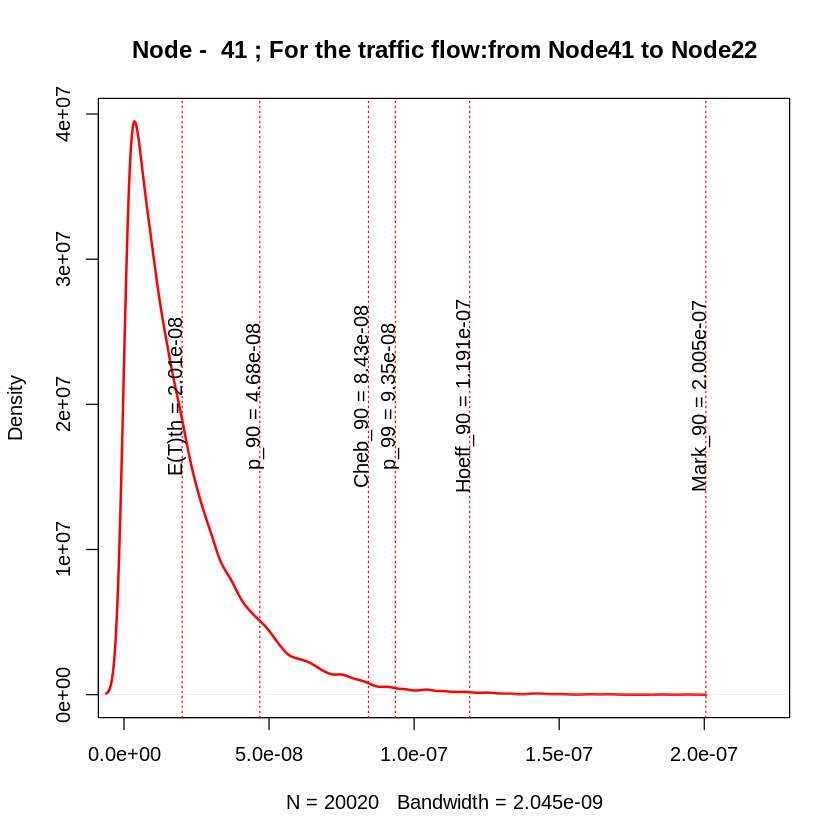

[1] 75
+ 1/202 edge from edd41aa (vertex names):
[1] Node42->Node23
[1] "traffic_Node42_Node23_"
[1] 42
[1] "Node -  42 :"
[1] "variance= 1.20540877374562e-15"
[1] "sigma2= 3.47189973032866e-08"
[1] "igraph E(T) = 3.19857938044273e-08"
[1] "simmer E(T) = 3.35421587033711e-08"


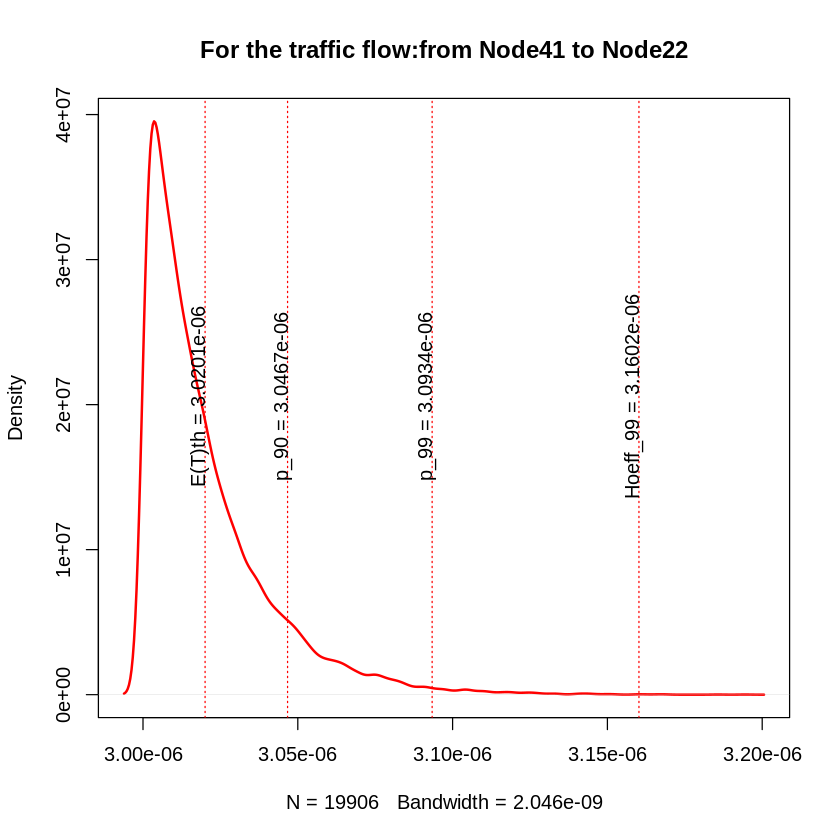

+ 1/202 edge from edd41aa (vertex names):
[1] Node42->Node23
[1] "variance= 1.20866740609913e-15"
[1] "sigma2= 3.47658942945401e-08"
[1] "igraph E(T) = 3.03198579380443e-06"
[1] "simmer E(T) = 3.03357436418049e-06"


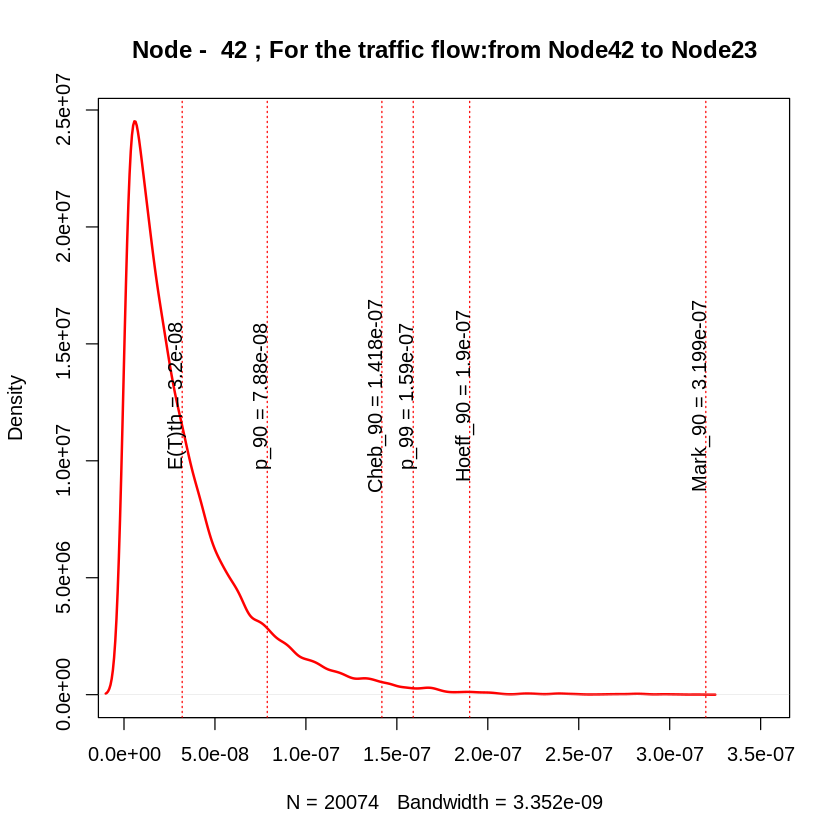

[1] 76
+ 1/202 edge from edd41aa (vertex names):
[1] Node44->Node24
[1] "traffic_Node44_Node24_"
[1] 44
[1] "Node -  44 :"
[1] "variance= 3.03713475392085e-16"
[1] "sigma2= 1.74273771805193e-08"
[1] "igraph E(T) = 1.67020778821742e-08"
[1] "simmer E(T) = 1.70037622188402e-08"


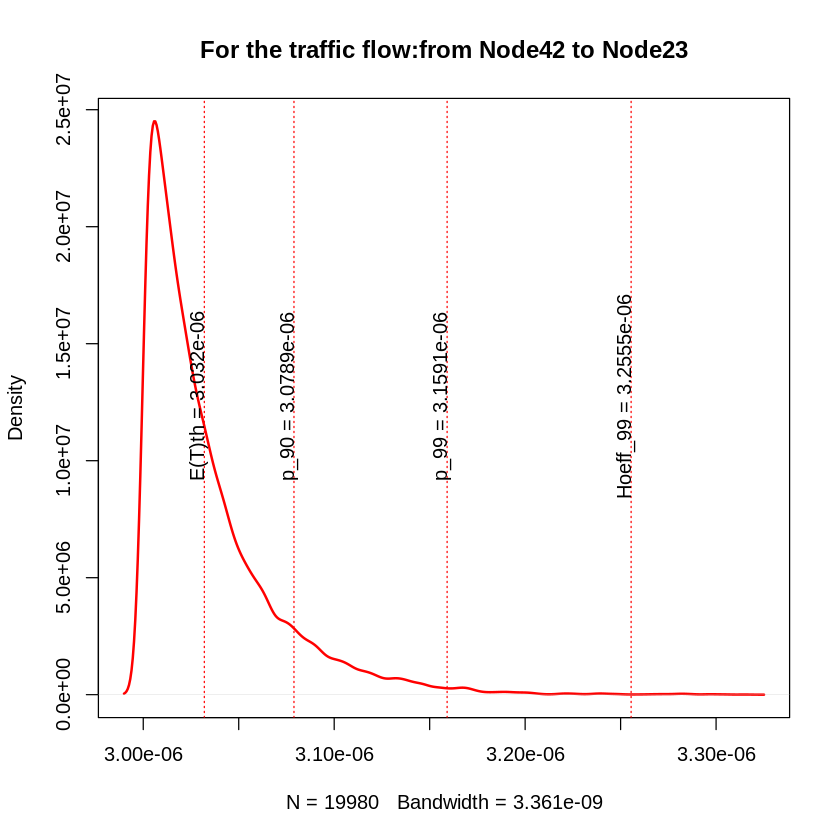

+ 1/202 edge from edd41aa (vertex names):
[1] Node44->Node24
[1] "variance= 3.04387716284296e-16"
[1] "sigma2= 1.74467107583148e-08"
[1] "igraph E(T) = 3.01670207788217e-06"
[1] "simmer E(T) = 3.01699885882615e-06"


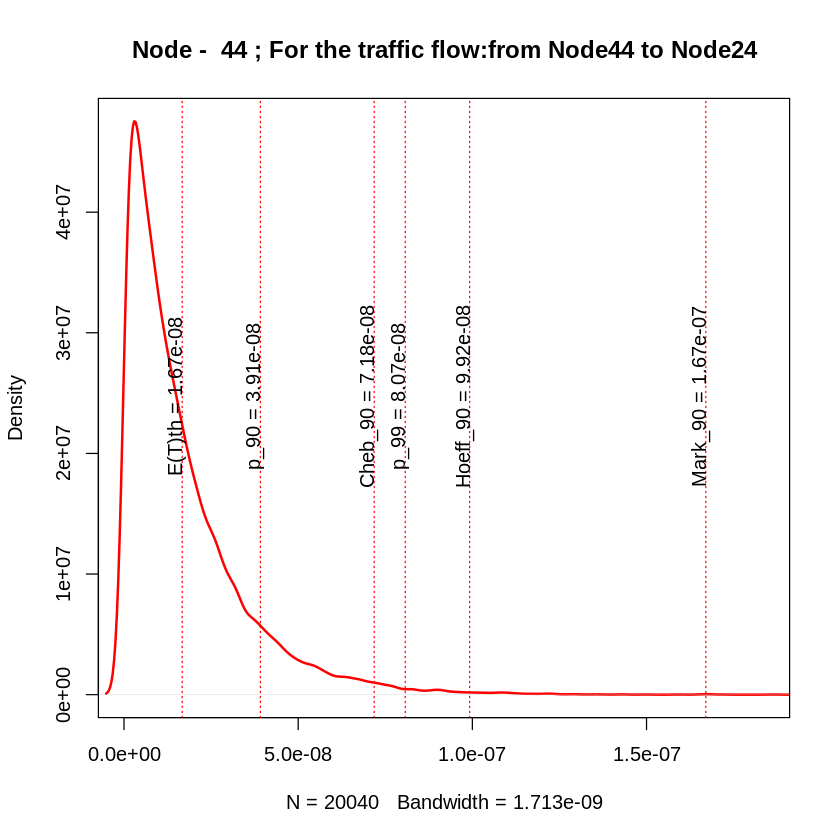

[1] 77
+ 1/202 edge from edd41aa (vertex names):
[1] Node9->Node25
[1] "traffic_Node9_Node25_"
[1] 9
[1] "Node -  9 :"
[1] "variance= 4.53171012663021e-16"
[1] "sigma2= 2.12878137126155e-08"
[1] "igraph E(T) = 1.96595711934055e-08"
[1] "simmer E(T) = 2.02953706576911e-08"


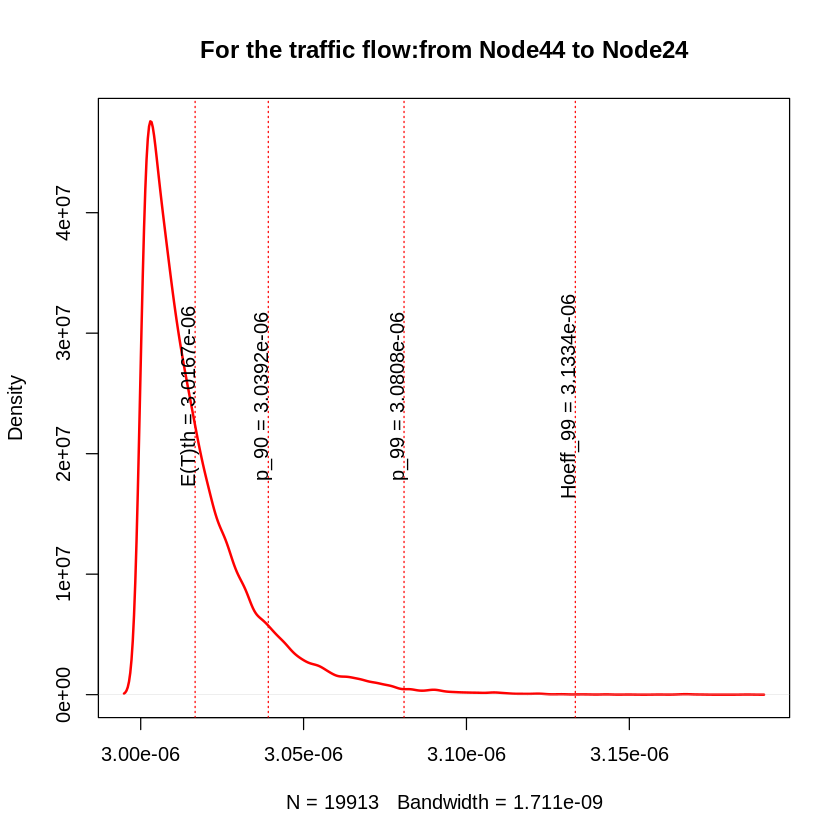

+ 1/202 edge from edd41aa (vertex names):
[1] Node9->Node25
[1] "variance= 4.5177637382806e-16"
[1] "sigma2= 2.12550317296413e-08"
[1] "igraph E(T) = 2.01965957119341e-06"
[1] "simmer E(T) = 2.02024760154636e-06"


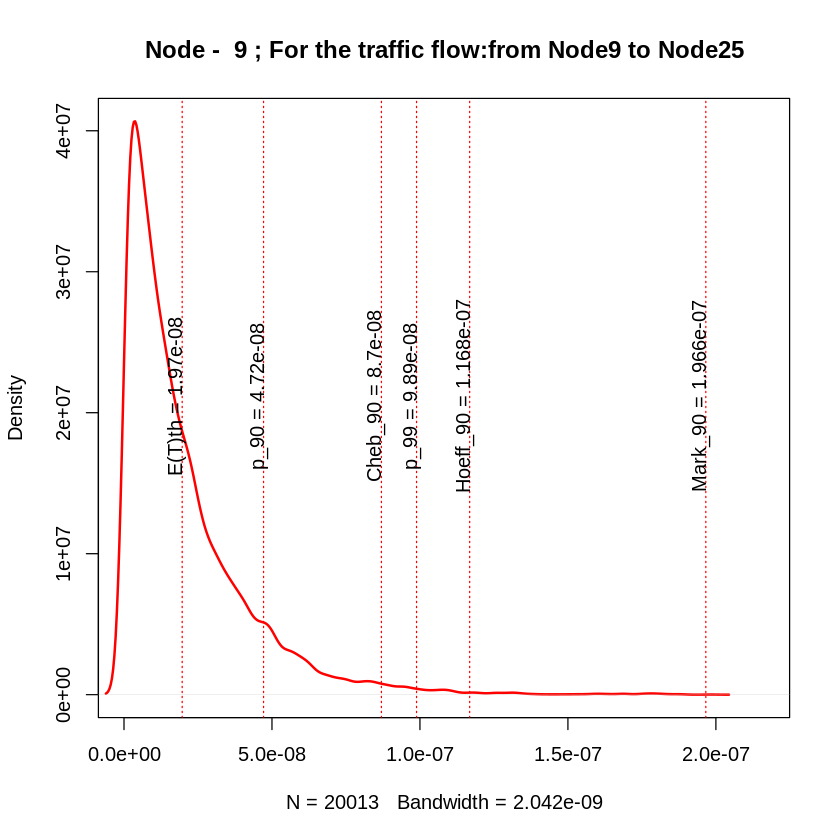

[1] 78
+ 1/202 edge from edd41aa (vertex names):
[1] Node10->Node26
[1] "traffic_Node10_Node26_"
[1] 10
[1] "Node -  10 :"
[1] "variance= 3.96043603350074e-15"
[1] "sigma2= 6.29319953084339e-08"
[1] "igraph E(T) = 6.00217863340504e-08"
[1] "simmer E(T) = 6.1415853929824e-08"


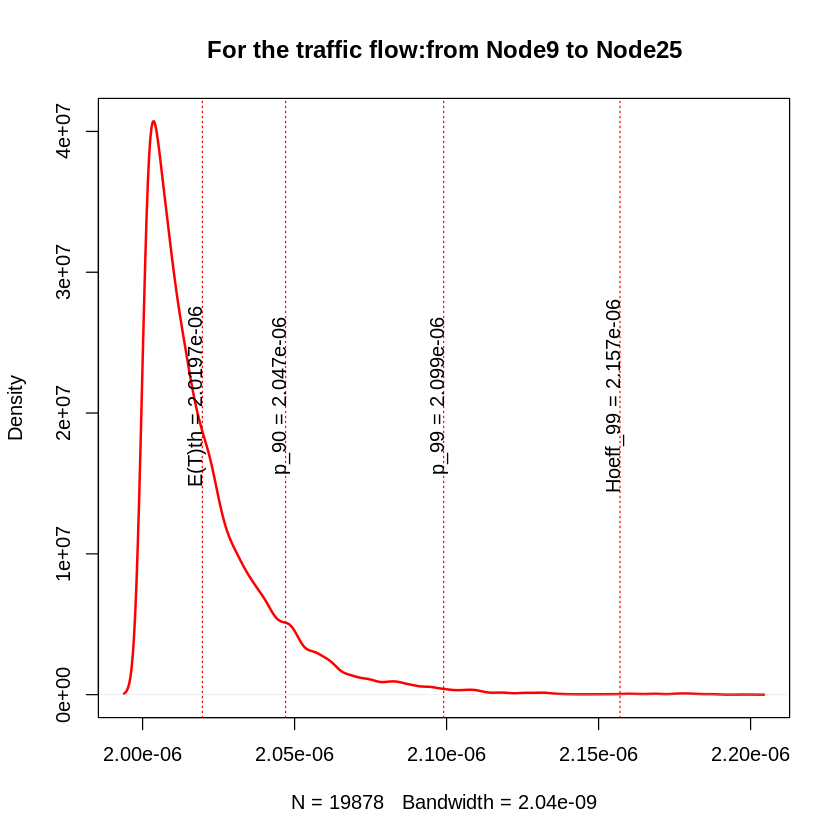

+ 1/202 edge from edd41aa (vertex names):
[1] Node10->Node26
[1] "variance= 3.96248475030415e-15"
[1] "sigma2= 6.29482704313959e-08"
[1] "igraph E(T) = 2.06002178633405e-06"
[1] "simmer E(T) = 2.06143387137292e-06"


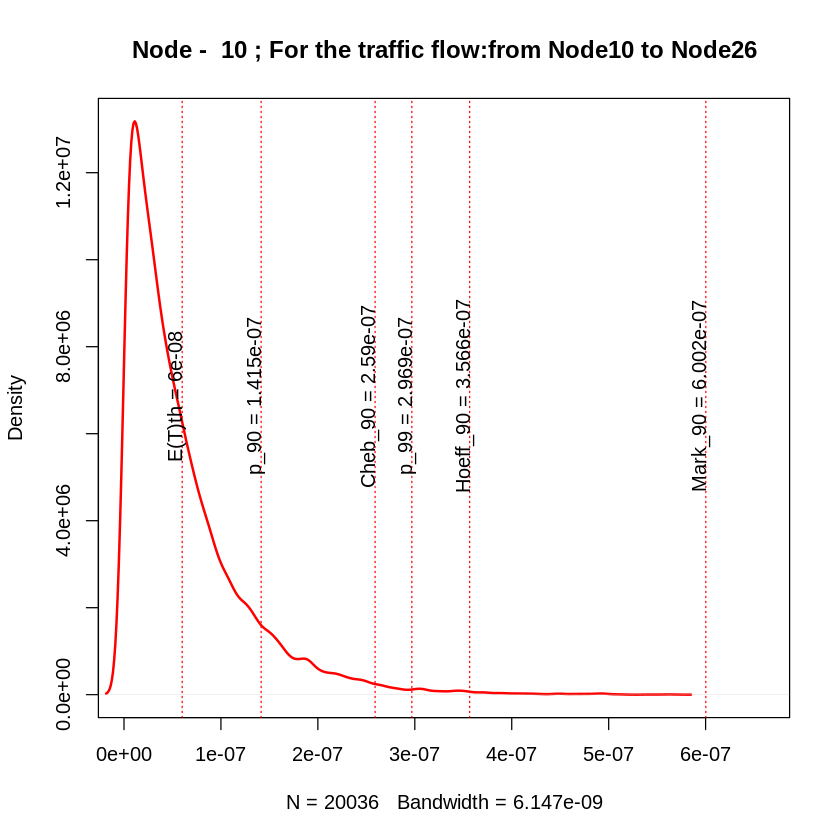

[1] 79
+ 1/202 edge from edd41aa (vertex names):
[1] Node11->Node27
[1] "traffic_Node11_Node27_"
[1] 11
[1] "Node -  11 :"
[1] "variance= 1.960309897621e-15"
[1] "sigma2= 4.42753870408944e-08"
[1] "igraph E(T) = 4.00953654252982e-08"
[1] "simmer E(T) = 4.17617921488758e-08"


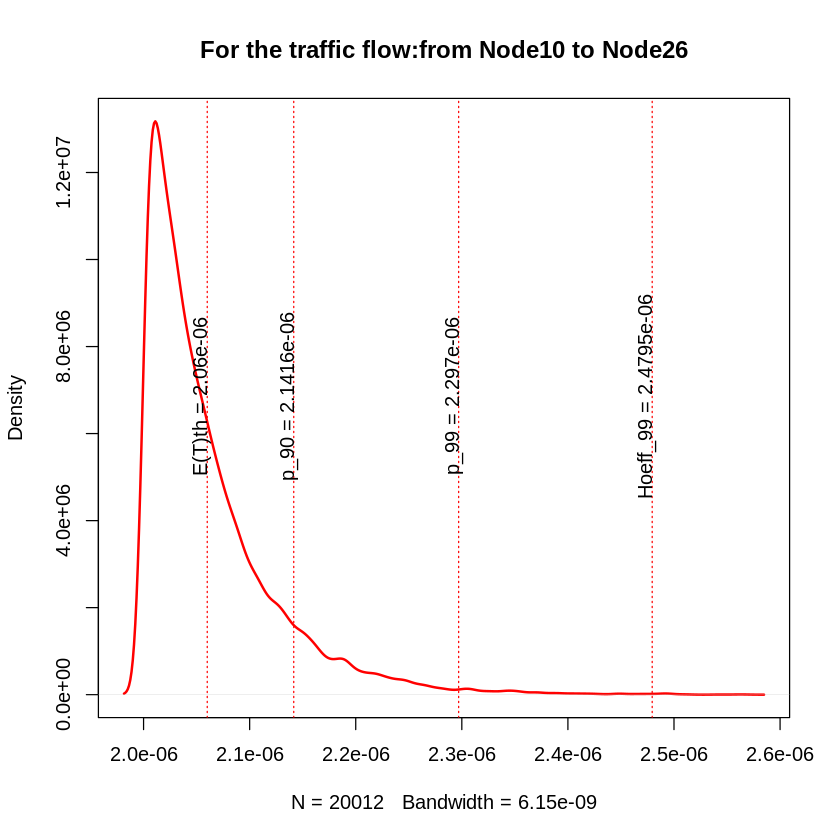

+ 1/202 edge from edd41aa (vertex names):
[1] Node11->Node27
[1] "variance= 1.94976630722957e-15"
[1] "sigma2= 4.41561582027872e-08"
[1] "igraph E(T) = 2.0400953654253e-06"
[1] "simmer E(T) = 2.04170003518661e-06"


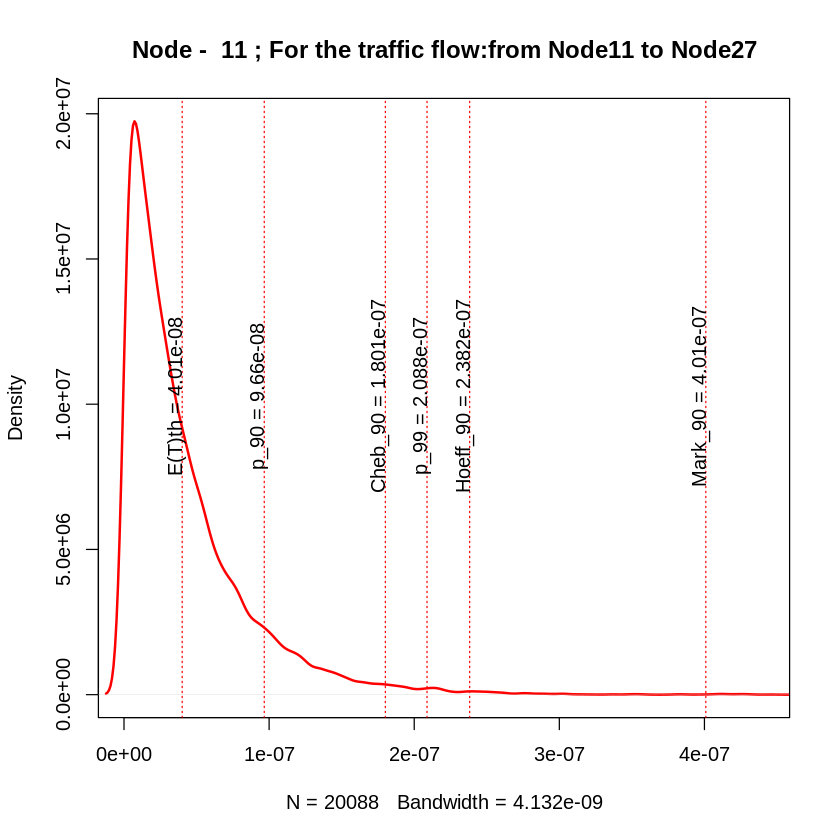

[1] 80
+ 1/202 edge from edd41aa (vertex names):
[1] Node12->Node28
[1] "traffic_Node12_Node28_"
[1] 12
[1] "Node -  12 :"
[1] "variance= 4.74764552836304e-15"
[1] "sigma2= 6.89031605106982e-08"
[1] "igraph E(T) = 6.83230862569543e-08"
[1] "simmer E(T) = 7.00629158827502e-08"


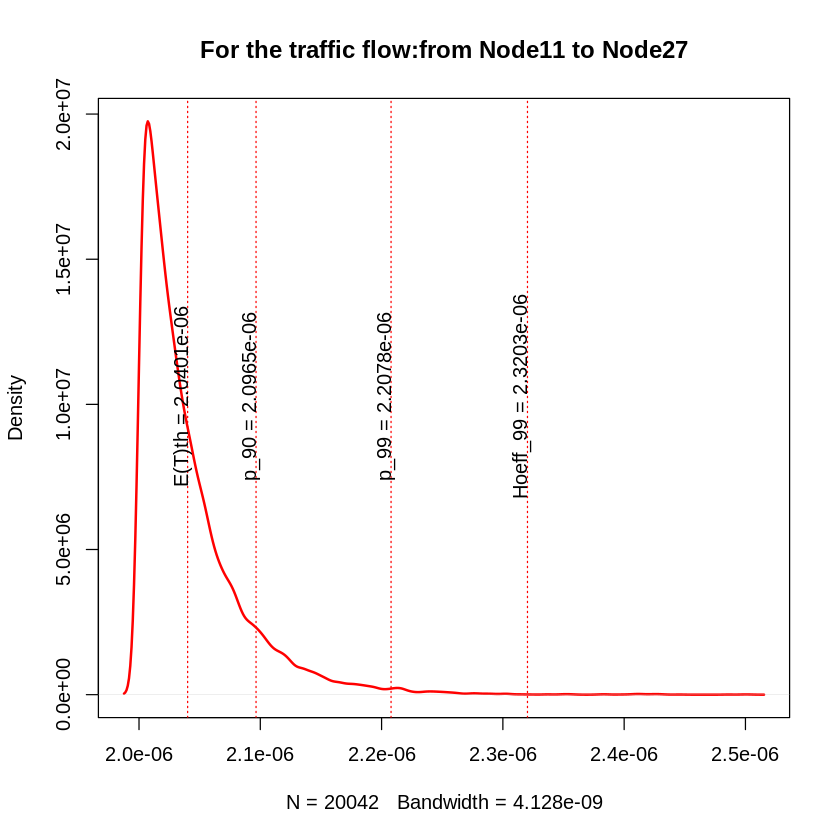

+ 1/202 edge from edd41aa (vertex names):
[1] Node12->Node28
[1] "variance= 4.68692334752926e-15"
[1] "sigma2= 6.84611082844067e-08"
[1] "igraph E(T) = 2.06832308625695e-06"
[1] "simmer E(T) = 2.06979781597565e-06"


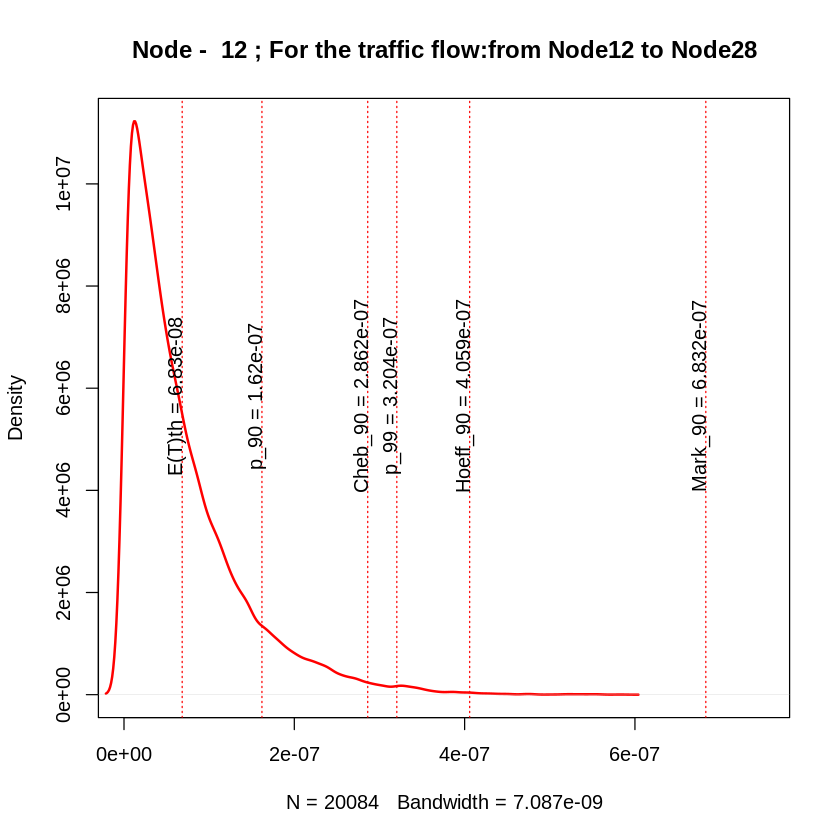

[1] 81
+ 1/202 edge from edd41aa (vertex names):
[1] Node13->Node29
[1] "traffic_Node13_Node29_"
[1] 13
[1] "Node -  13 :"
[1] "variance= 2.61699401061878e-15"
[1] "sigma2= 5.11565637100341e-08"
[1] "igraph E(T) = 4.83389247848606e-08"
[1] "simmer E(T) = 5.0644371522482e-08"


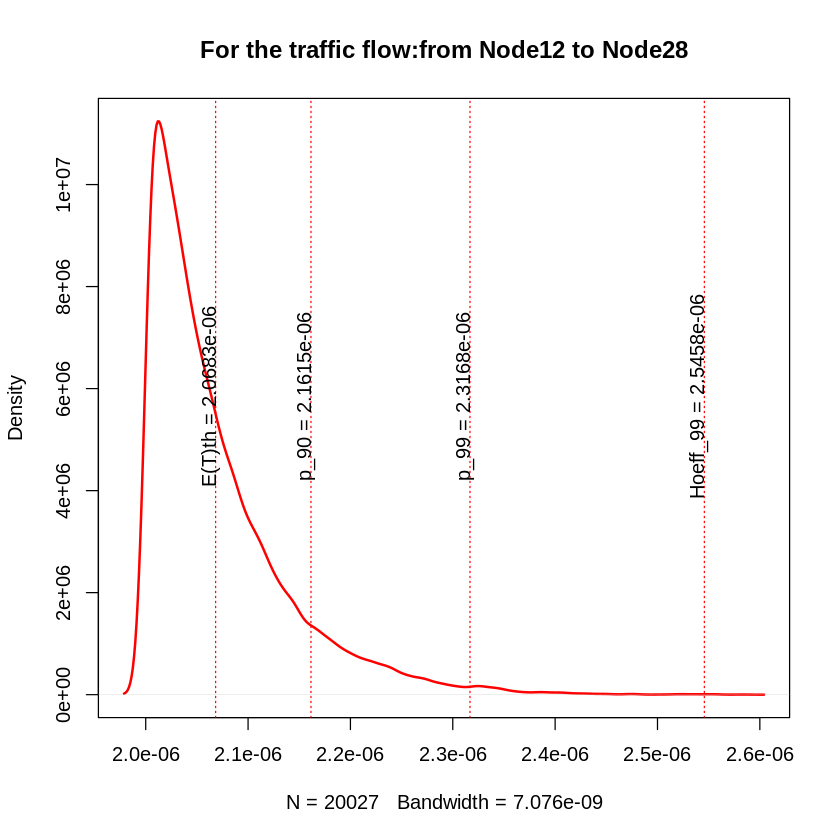

+ 1/202 edge from edd41aa (vertex names):
[1] Node13->Node29
[1] "variance= 2.52318862433784e-15"
[1] "sigma2= 5.02313510104779e-08"
[1] "igraph E(T) = 2.04833892478486e-06"
[1] "simmer E(T) = 2.05018127715537e-06"


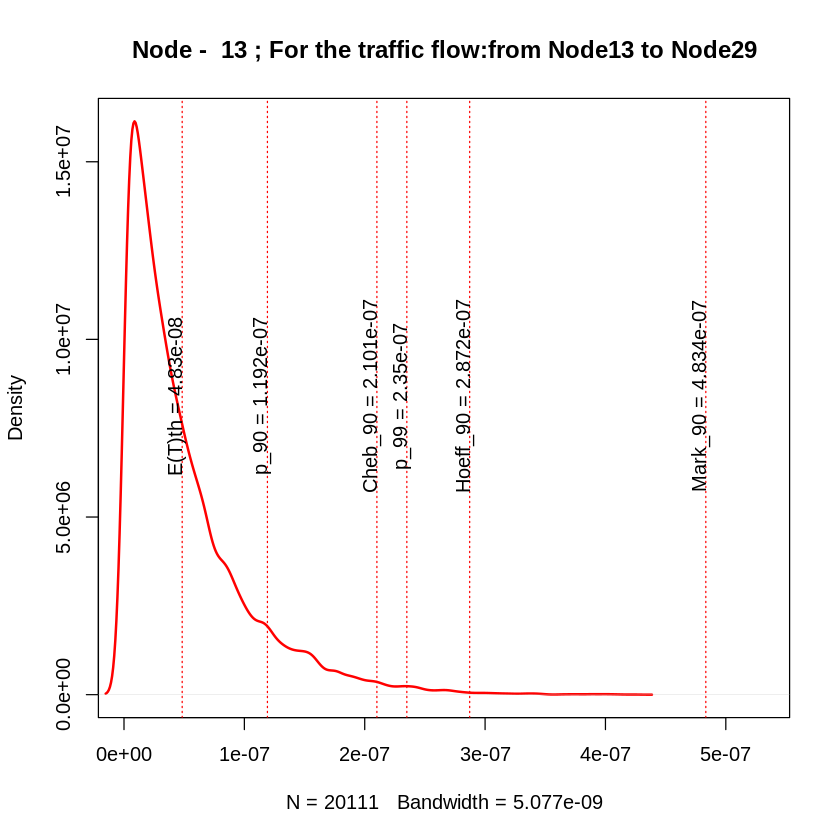

[1] 82
+ 1/202 edge from edd41aa (vertex names):
[1] Node14->Node30
[1] "traffic_Node14_Node30_"
[1] 14
[1] "Node -  14 :"
[1] "variance= 1.2154654359206e-15"
[1] "sigma2= 3.48635258675969e-08"
[1] "igraph E(T) = 3.50146397030869e-08"
[1] "simmer E(T) = 3.55391968986324e-08"


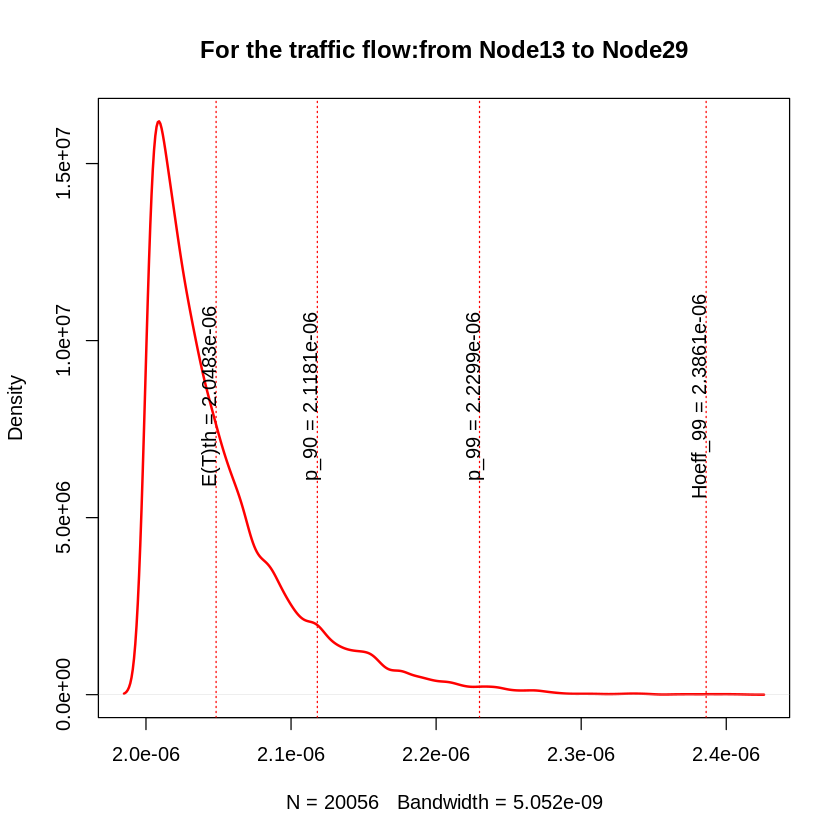

+ 1/202 edge from edd41aa (vertex names):
[1] Node14->Node30
[1] "variance= 1.18782462423215e-15"
[1] "sigma2= 3.44648317017819e-08"
[1] "igraph E(T) = 2.03501463970309e-06"
[1] "simmer E(T) = 2.03522239726936e-06"


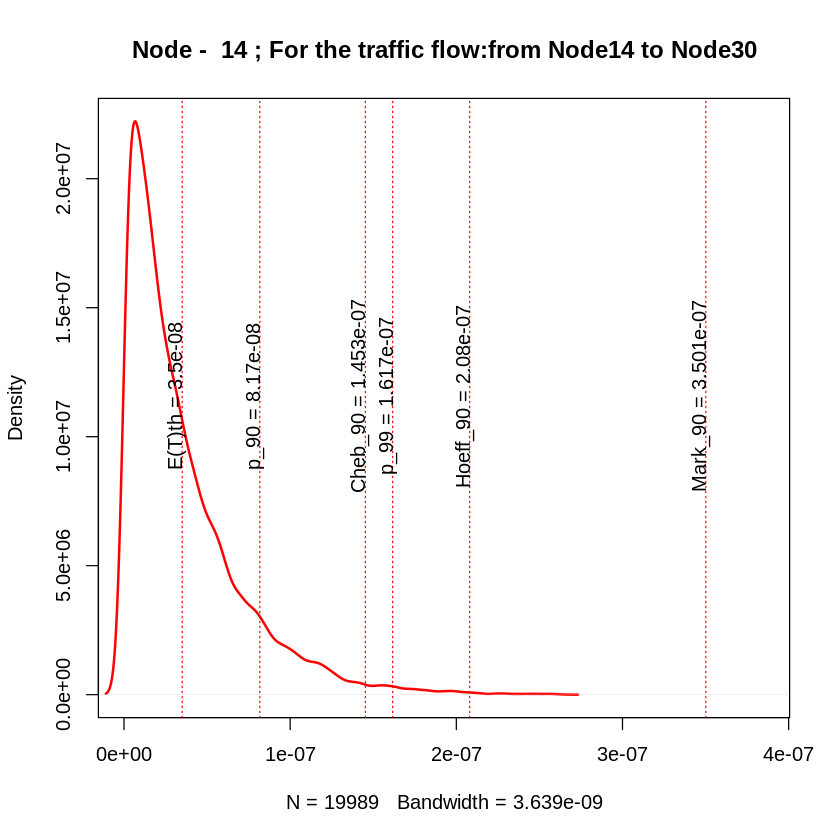

[1] 83
+ 1/202 edge from edd41aa (vertex names):
[1] Node15->Node31
[1] "traffic_Node15_Node31_"
[1] 15
[1] "Node -  15 :"
[1] "variance= 1.67101001608774e-15"
[1] "sigma2= 4.0877989384114e-08"
[1] "igraph E(T) = 4.16625595248677e-08"
[1] "simmer E(T) = 4.13790126088489e-08"


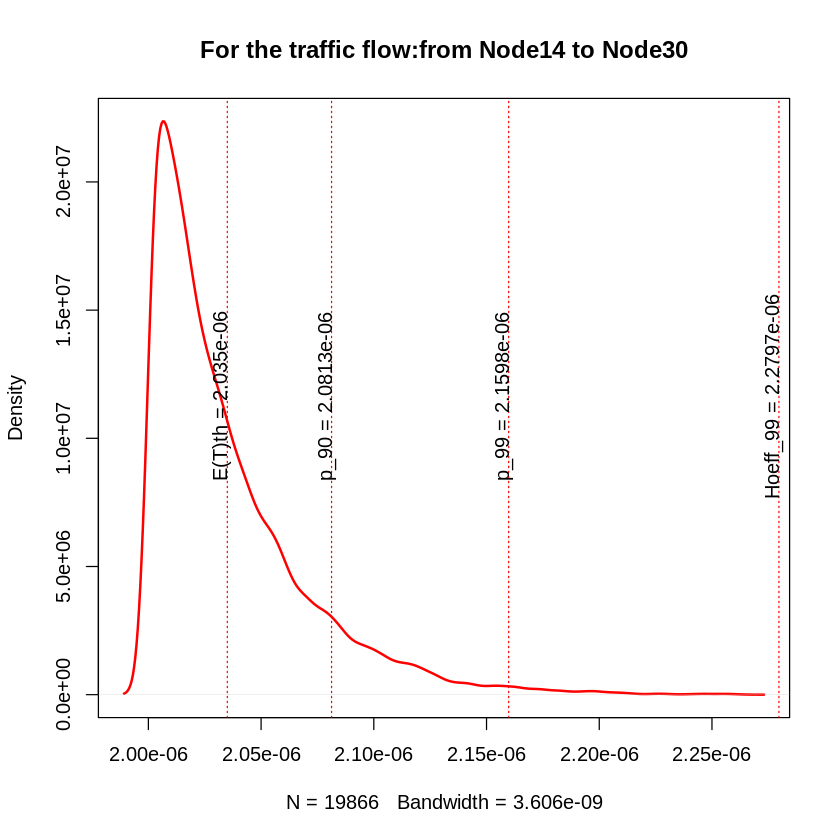

+ 1/202 edge from edd41aa (vertex names):
[1] Node15->Node31
[1] "variance= 1.67448371360384e-15"
[1] "sigma2= 4.09204559310357e-08"
[1] "igraph E(T) = 2.04166255952487e-06"
[1] "simmer E(T) = 2.04142713496642e-06"


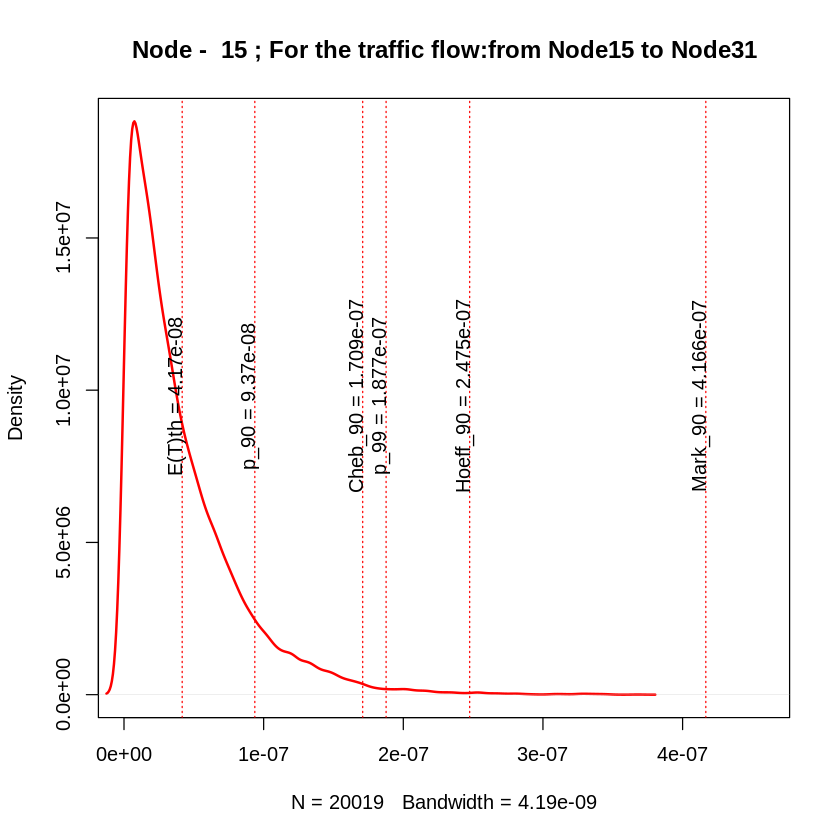

[1] 84
+ 1/202 edge from edd41aa (vertex names):
[1] Node15->Node32
[1] "traffic_Node15_Node32_"
[1] 15
[1] "Node -  15 :"
[1] "variance= 3.19900551347636e-16"
[1] "sigma2= 1.78857639296631e-08"
[1] "igraph E(T) = 1.77131489253531e-08"
[1] "simmer E(T) = 1.78819263522398e-08"


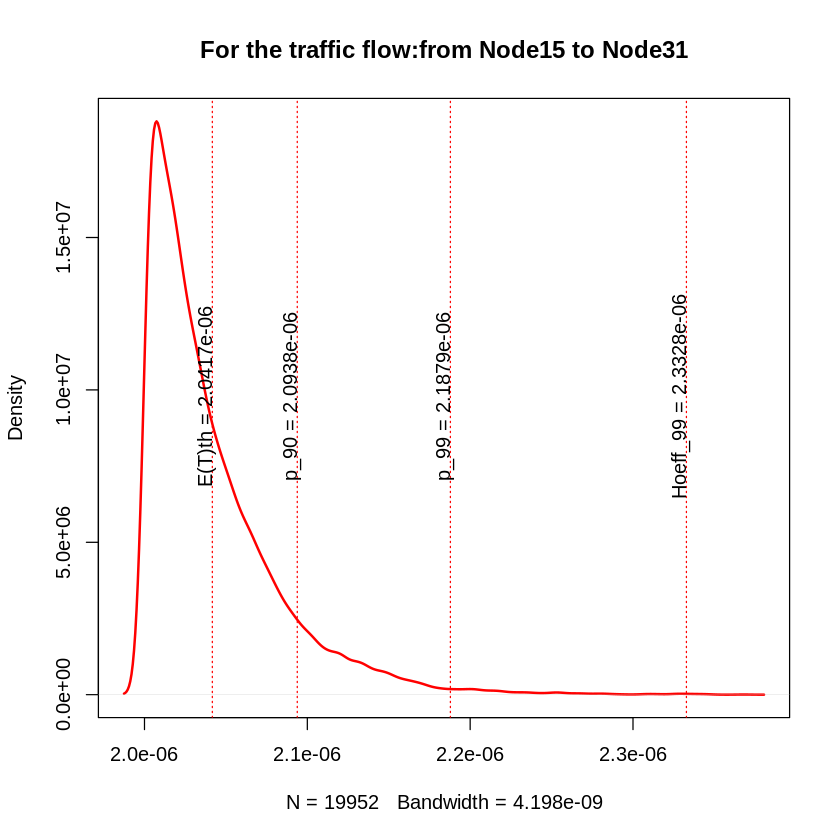

+ 1/202 edge from edd41aa (vertex names):
[1] Node15->Node32
[1] "variance= 3.19932474807212e-16"
[1] "sigma2= 1.78866563339047e-08"
[1] "igraph E(T) = 2.01771314892535e-06"
[1] "simmer E(T) = 2.01787527742426e-06"


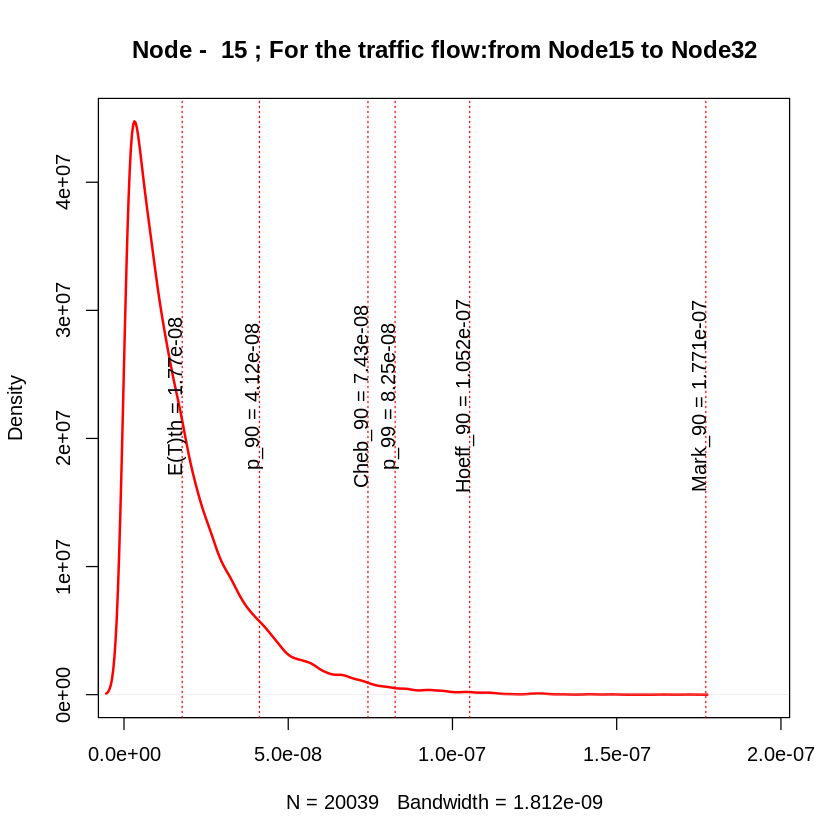

[1] 85
+ 1/202 edge from edd41aa (vertex names):
[1] Node16->Node33
[1] "traffic_Node16_Node33_"
[1] 16
[1] "Node -  16 :"
[1] "variance= 6.64085011699929e-15"
[1] "sigma2= 8.1491411308182e-08"
[1] "igraph E(T) = 7.83334589457956e-08"
[1] "simmer E(T) = 8.13353293086377e-08"


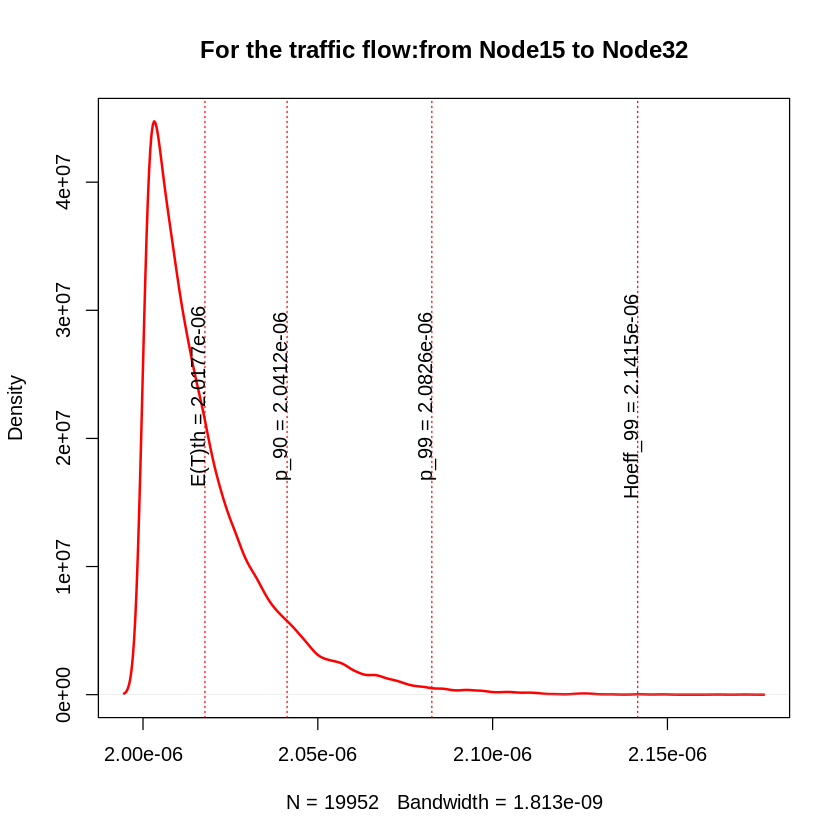

+ 1/202 edge from edd41aa (vertex names):
[1] Node16->Node33
[1] "variance= 6.5485091882326e-15"
[1] "sigma2= 8.09228594912006e-08"
[1] "igraph E(T) = 2.0783334589458e-06"
[1] "simmer E(T) = 2.0810139605124e-06"


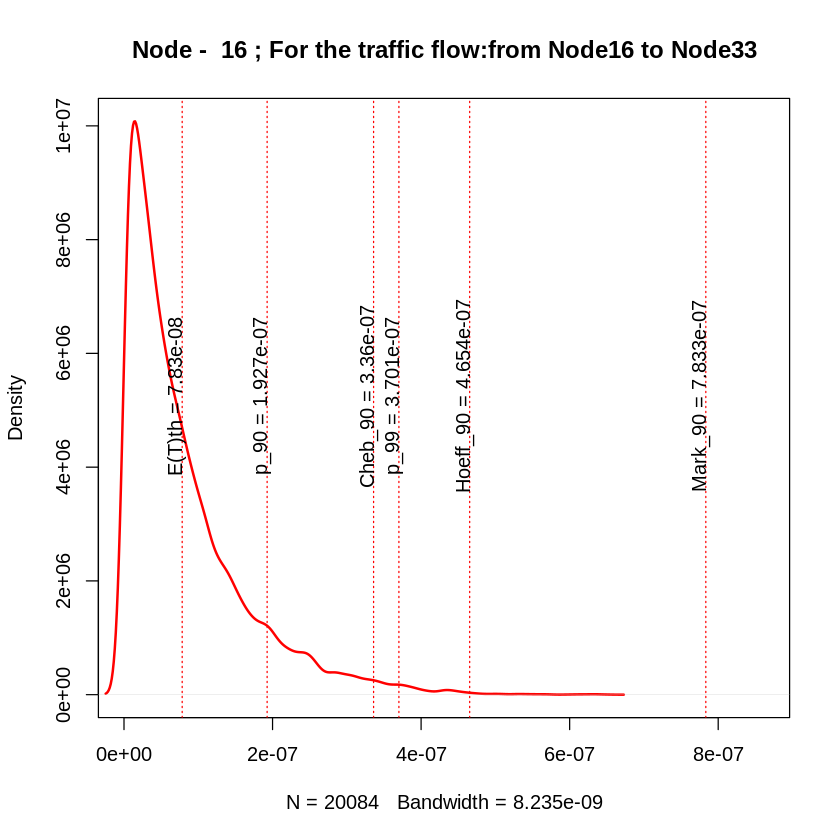

[1] 86
+ 1/202 edge from edd41aa (vertex names):
[1] Node17->Node34
[1] "traffic_Node17_Node34_"
[1] 17
[1] "Node -  17 :"
[1] "variance= 9.31268797125483e-15"
[1] "sigma2= 9.65022692544317e-08"
[1] "igraph E(T) = 9.33923211338925e-08"
[1] "simmer E(T) = 9.57510717090011e-08"


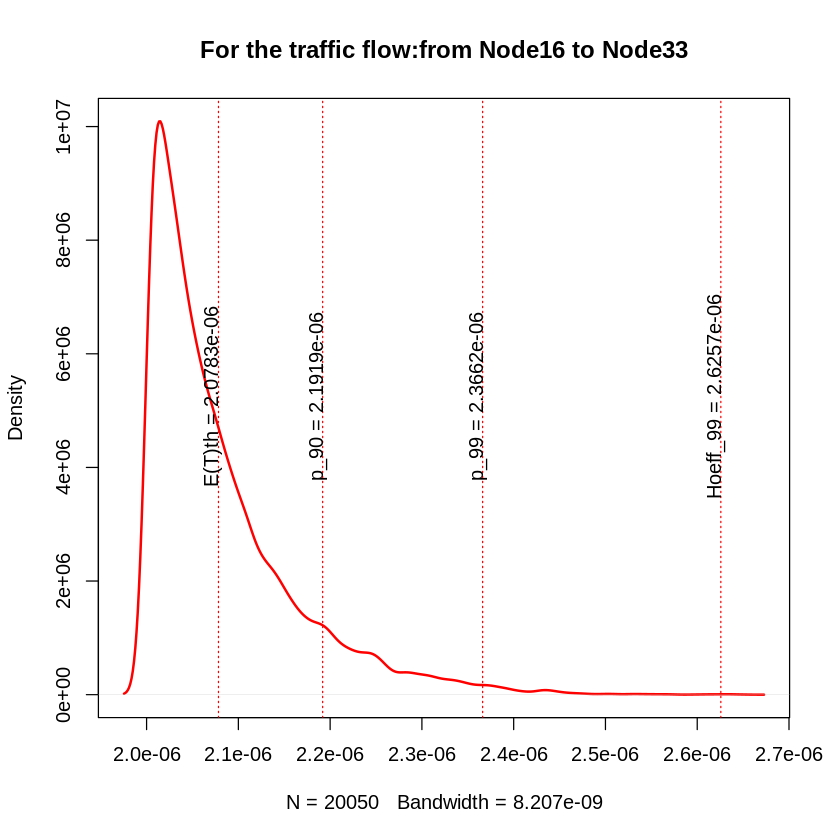

+ 1/202 edge from edd41aa (vertex names):
[1] Node17->Node34
[1] "variance= 9.28168273466659e-15"
[1] "sigma2= 9.63414902036843e-08"
[1] "igraph E(T) = 2.09339232113389e-06"
[1] "simmer E(T) = 2.09563675413944e-06"


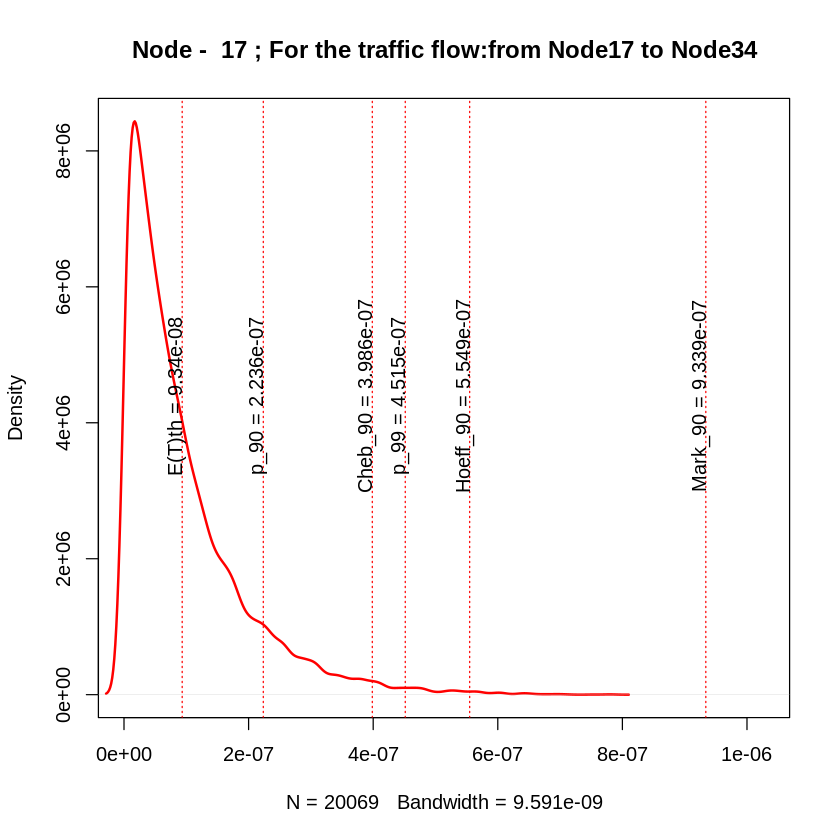

[1] 87
+ 1/202 edge from edd41aa (vertex names):
[1] Node17->Node35
[1] "traffic_Node17_Node35_"
[1] 17
[1] "Node -  17 :"
[1] "variance= 4.27299137839569e-16"
[1] "sigma2= 2.06712151998756e-08"
[1] "igraph E(T) = 1.94894231551548e-08"
[1] "simmer E(T) = 1.9992039413983e-08"


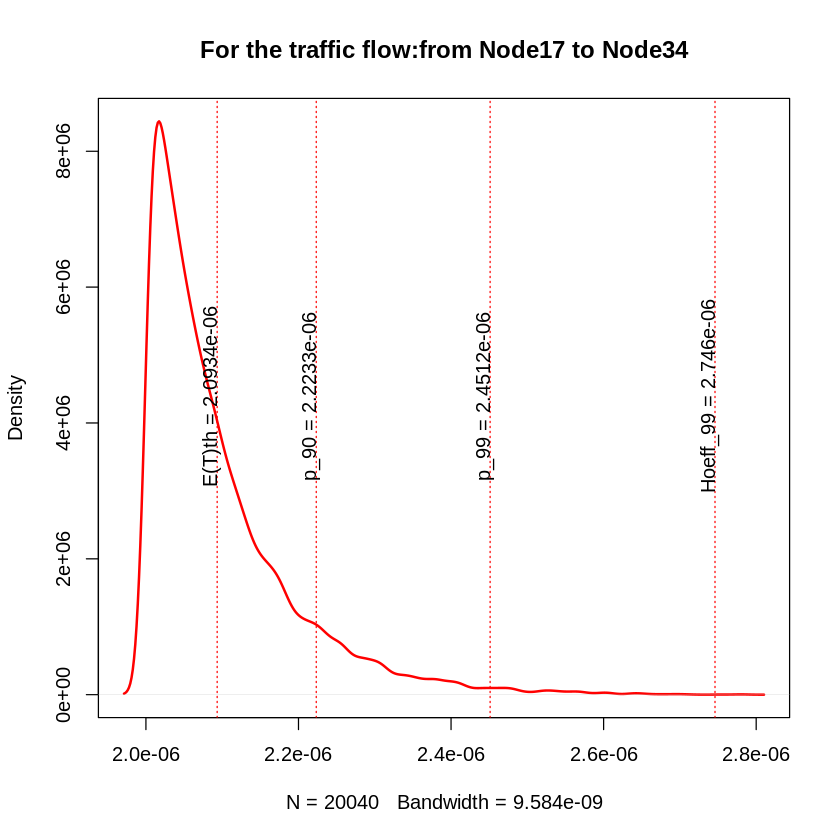

+ 1/202 edge from edd41aa (vertex names):
[1] Node17->Node35
[1] "variance= 4.27200972391707e-16"
[1] "sigma2= 2.06688406155669e-08"
[1] "igraph E(T) = 2.01948942315515e-06"
[1] "simmer E(T) = 2.01998110323502e-06"


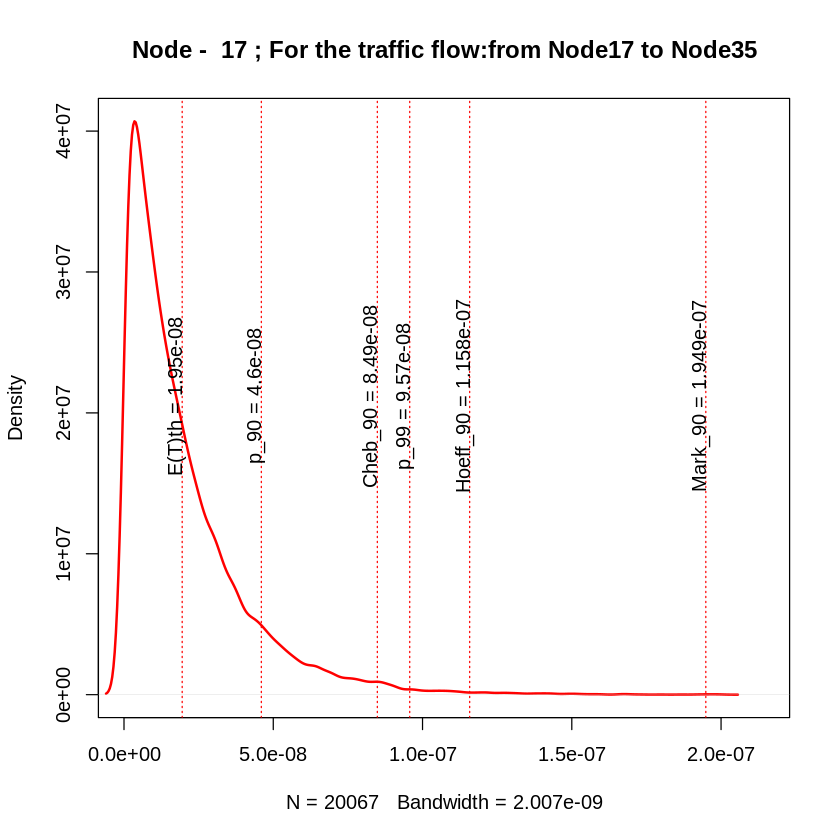

[1] 88
+ 1/202 edge from edd41aa (vertex names):
[1] Node18->Node36
[1] "traffic_Node18_Node36_"
[1] 18
[1] "Node -  18 :"
[1] "variance= 6.51092184470211e-16"
[1] "sigma2= 2.55165080775213e-08"
[1] "igraph E(T) = 2.49127465440747e-08"
[1] "simmer E(T) = 2.53179388421957e-08"


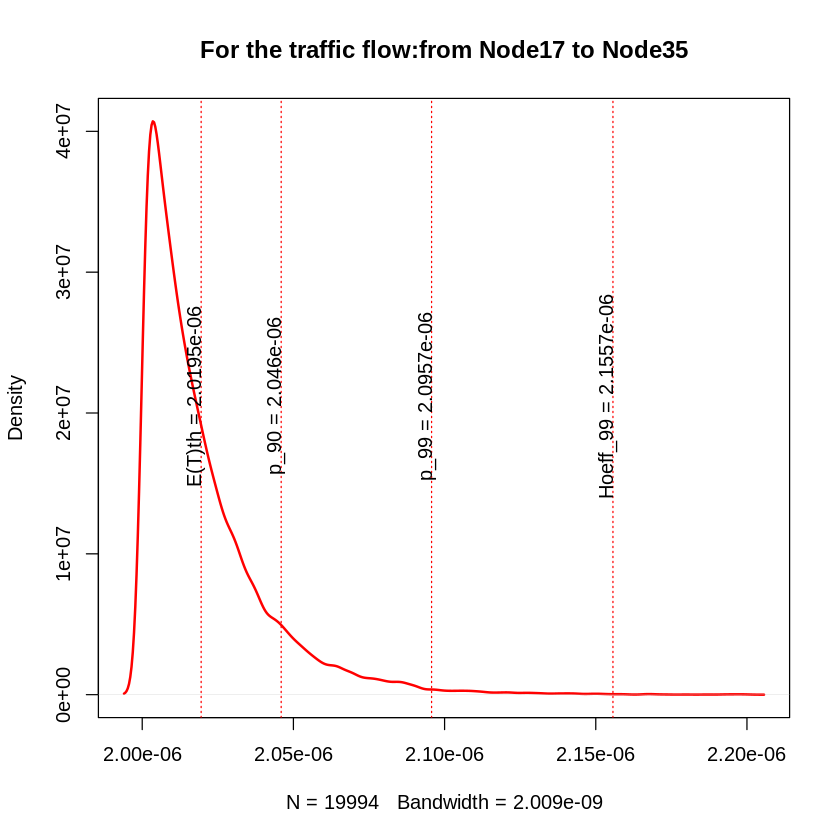

+ 1/202 edge from edd41aa (vertex names):
[1] Node18->Node36
[1] "variance= 6.5234193852362e-16"
[1] "sigma2= 2.55409854650055e-08"
[1] "igraph E(T) = 2.02491274654407e-06"
[1] "simmer E(T) = 2.02533594170374e-06"


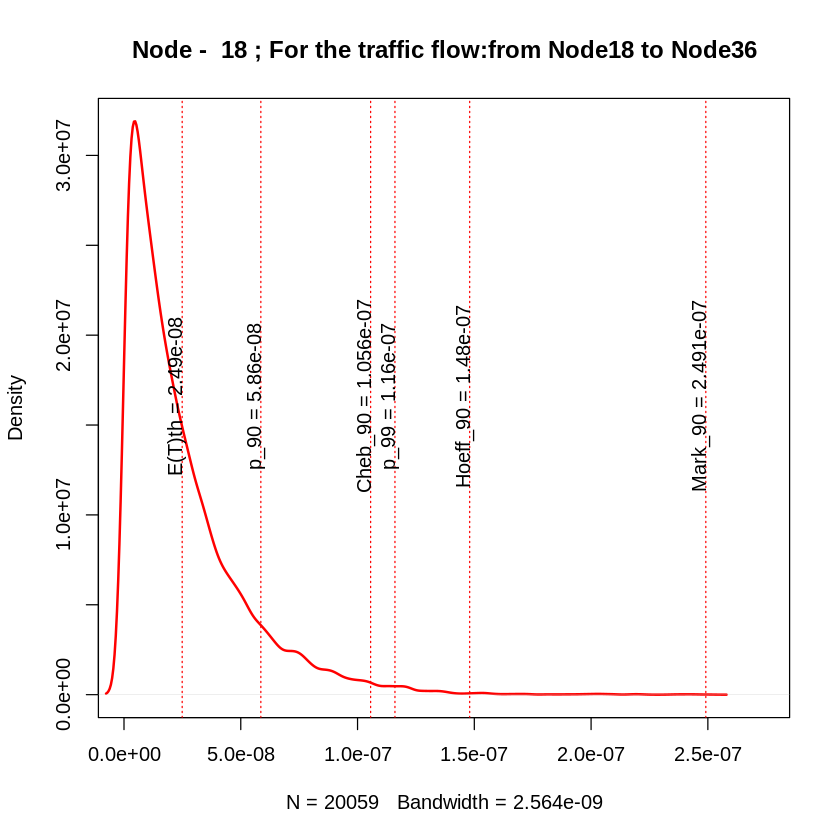

[1] 89
+ 1/202 edge from edd41aa (vertex names):
[1] Node18->Node37
[1] "traffic_Node18_Node37_"
[1] 18
[1] "Node -  18 :"
[1] "variance= 5.45004991580595e-16"
[1] "sigma2= 2.33453419675231e-08"
[1] "igraph E(T) = 2.22321986323698e-08"
[1] "simmer E(T) = 2.2895003717834e-08"


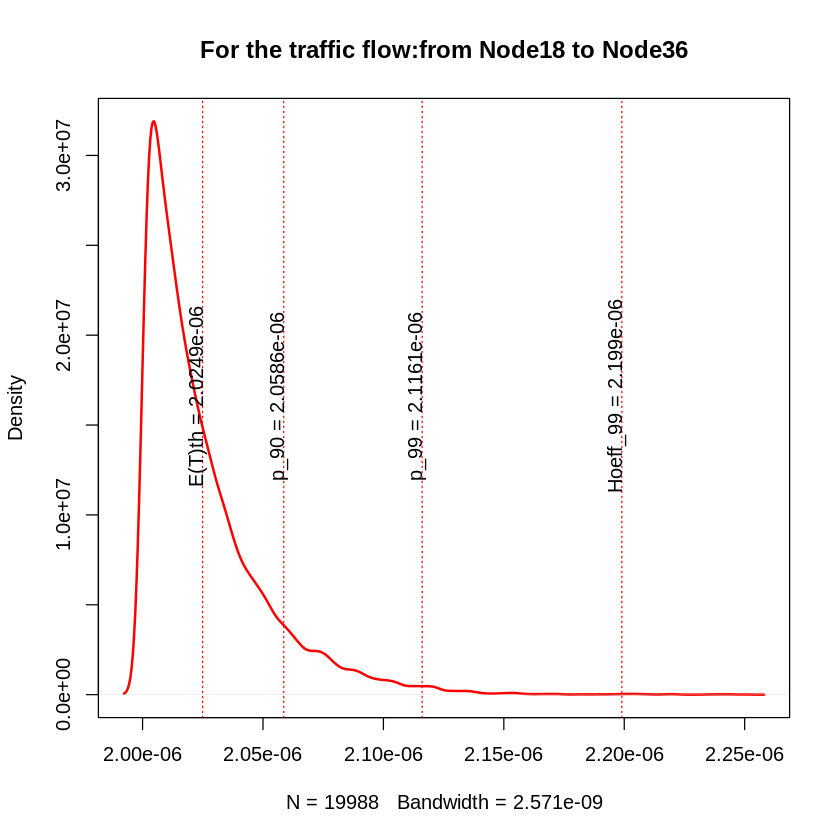

+ 1/202 edge from edd41aa (vertex names):
[1] Node18->Node37
[1] "variance= 5.46158124570723e-16"
[1] "sigma2= 2.33700261996157e-08"
[1] "igraph E(T) = 2.02223219863237e-06"
[1] "simmer E(T) = 2.0229190258614e-06"


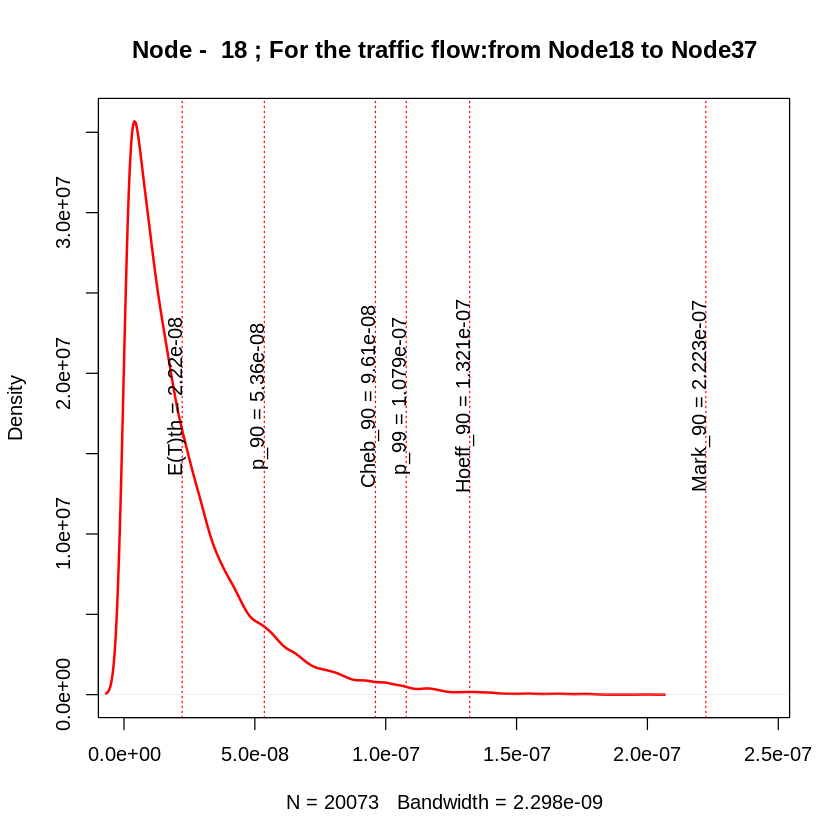

[1] 90
+ 1/202 edge from edd41aa (vertex names):
[1] Node19->Node38
[1] "traffic_Node19_Node38_"
[1] 19
[1] "Node -  19 :"
[1] "variance= 6.09264626026994e-16"
[1] "sigma2= 2.46832863700722e-08"
[1] "igraph E(T) = 2.3647496624595e-08"
[1] "simmer E(T) = 2.42610266871271e-08"


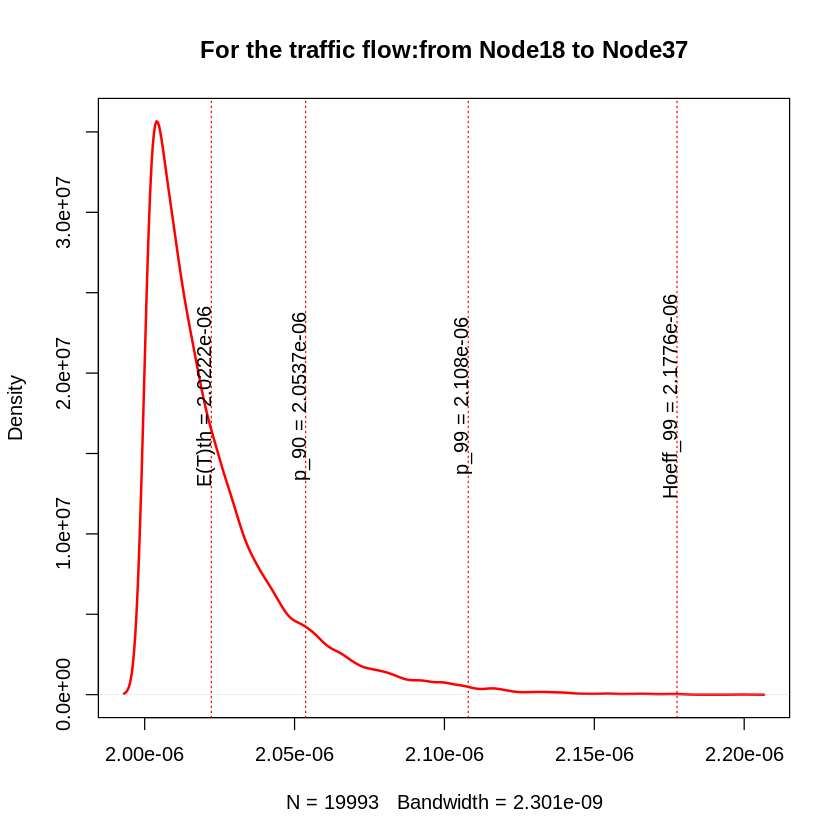

+ 1/202 edge from edd41aa (vertex names):
[1] Node19->Node38
[1] "variance= 6.10272919247615e-16"
[1] "sigma2= 2.47037025412713e-08"
[1] "igraph E(T) = 2.02364749662459e-06"
[1] "simmer E(T) = 2.02428598687479e-06"


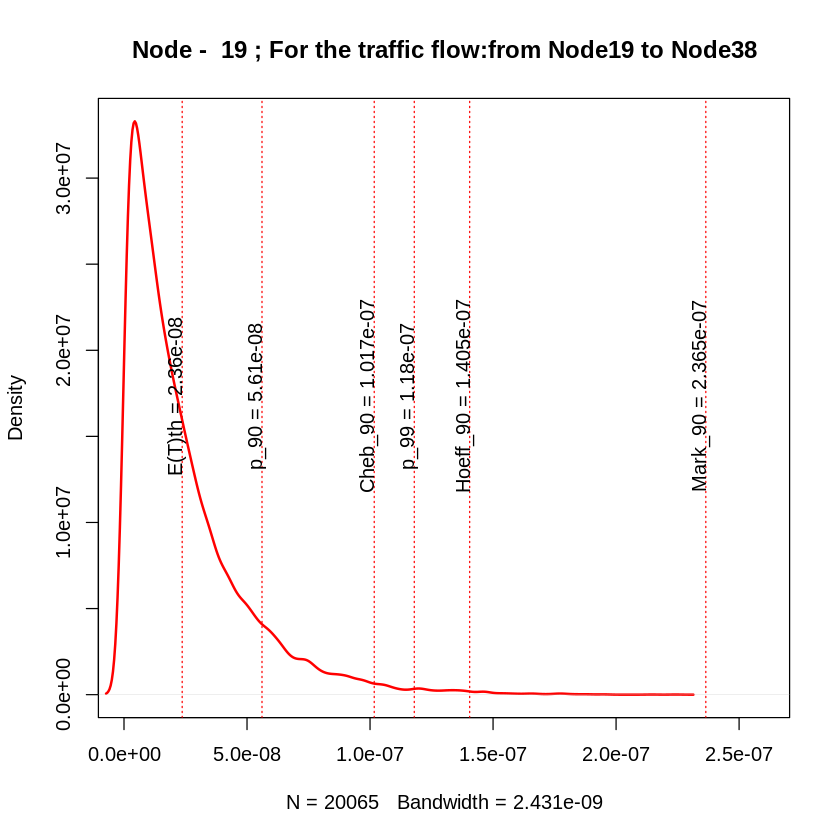

[1] 91
+ 1/202 edge from edd41aa (vertex names):
[1] Node19->Node39
[1] "traffic_Node19_Node39_"
[1] 19
[1] "Node -  19 :"
[1] "variance= 6.37556495432601e-15"
[1] "sigma2= 7.9847134916201e-08"
[1] "igraph E(T) = 7.60464102071427e-08"
[1] "simmer E(T) = 7.81200588535306e-08"


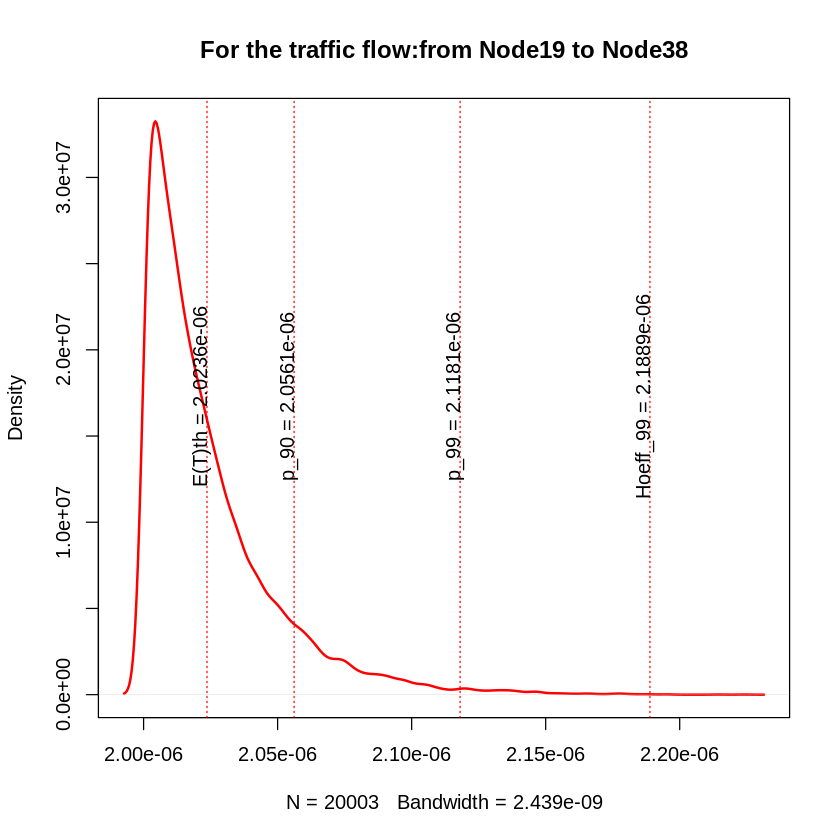

+ 1/202 edge from edd41aa (vertex names):
[1] Node19->Node39
[1] "variance= 6.37932109041288e-15"
[1] "sigma2= 7.98706522473235e-08"
[1] "igraph E(T) = 2.07604641020714e-06"
[1] "simmer E(T) = 2.07815545623693e-06"


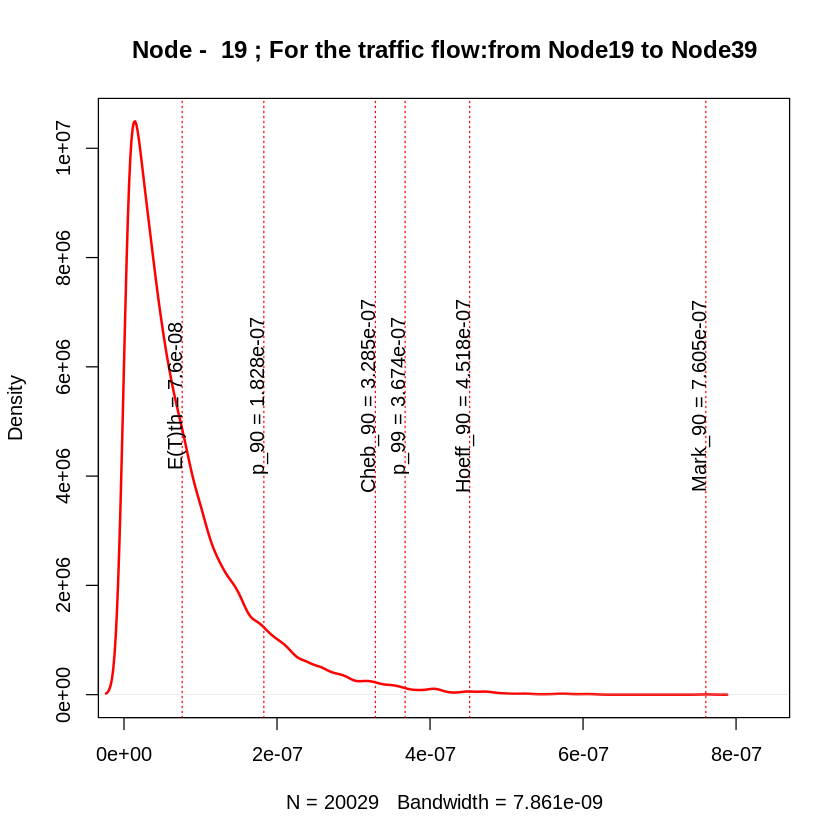

[1] 92
[1] "no info of traffic"
 [1] 8.005539e-06 8.008184e-06 3.006111e-06 3.005349e-06 3.004616e-06
 [6] 3.003062e-06 7.003539e-06 3.001299e-06 0.000000e+00 0.000000e+00
[11] 0.000000e+00 0.000000e+00 0.000000e+00 0.000000e+00 0.000000e+00
[16] 0.000000e+00 0.000000e+00 0.000000e+00 0.000000e+00 3.001689e-06
[21] 3.002273e-06 3.005242e-06 3.005605e-06 3.003239e-06 2.001487e-06
[26] 2.005659e-06 2.004245e-06 2.005752e-06 2.005420e-06 2.002807e-06
[31] 2.002393e-06 2.001848e-06 2.007887e-06 2.007426e-06 2.003477e-06
[36] 2.004624e-06 2.001988e-06 2.002497e-06 2.007551e-06 0.000000e+00
[41] 0.000000e+00 0.000000e+00 0.000000e+00 0.000000e+00 2.015275e-06
[46] 2.006777e-06 2.001808e-06 2.005324e-06 2.005674e-06 2.025597e-06
[51] 2.002633e-06 5.010681e-06 8.052855e-06 8.052404e-06 3.070135e-06
[56] 3.031688e-06 3.018471e-06 3.015544e-06 7.039120e-06 3.014427e-06
[61] 0.000000e+00 0.000000e+00 0.000000e+00 0.000000e+00 0.000000e+00
[66] 0.000000e+00 0.000000e+00 0.000000e+00 0.000000e+00 0

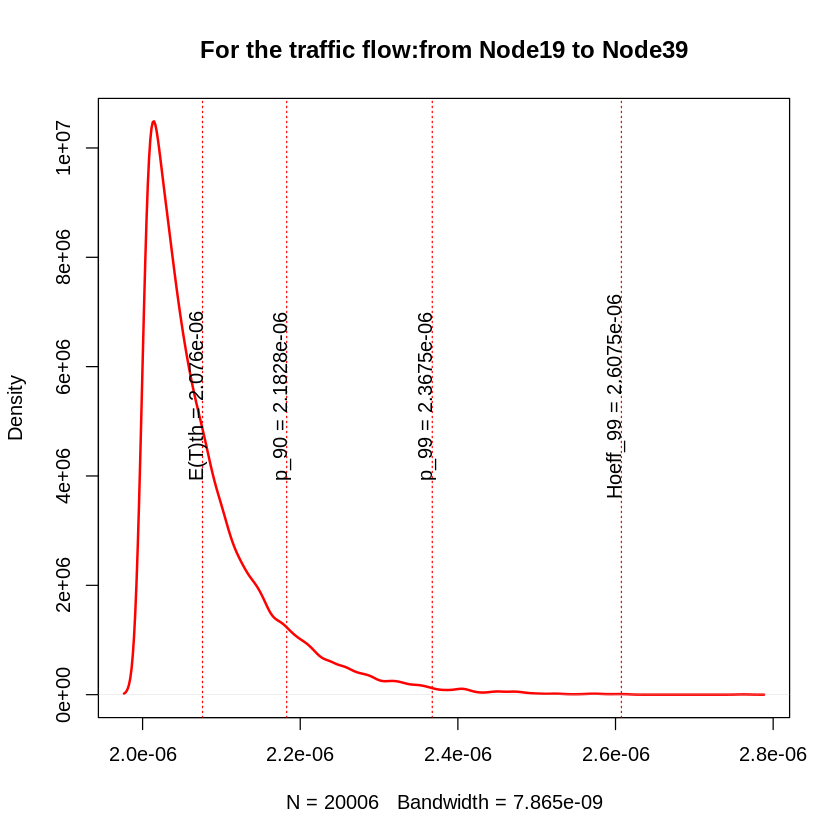

+ 1/202 edge from edd41aa (vertex names):
[1] Node44->Node45
[1] "variance= 1.99935348793264e-14"
[1] "sigma2= 1.41398496736445e-07"
[1] "igraph E(T) = 2.12741030166367e-06"
[1] "simmer E(T) = 2.13345644766888e-06"


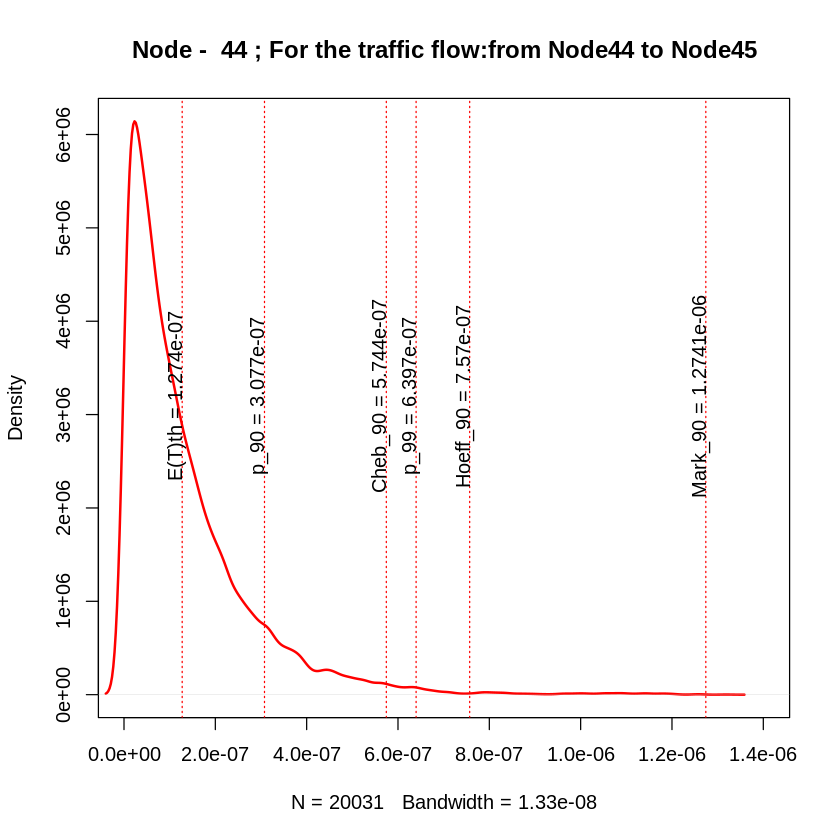

[1] 98
+ 1/202 edge from edd41aa (vertex names):
[1] Node44->Node46
[1] "traffic_Node44_Node46_"
[1] 44
[1] "Node -  44 :"
[1] "variance= 2.10251424931727e-15"
[1] "sigma2= 4.5853181452515e-08"
[1] "igraph E(T) = 4.56385559800954e-08"
[1] "simmer E(T) = 4.60583010757328e-08"


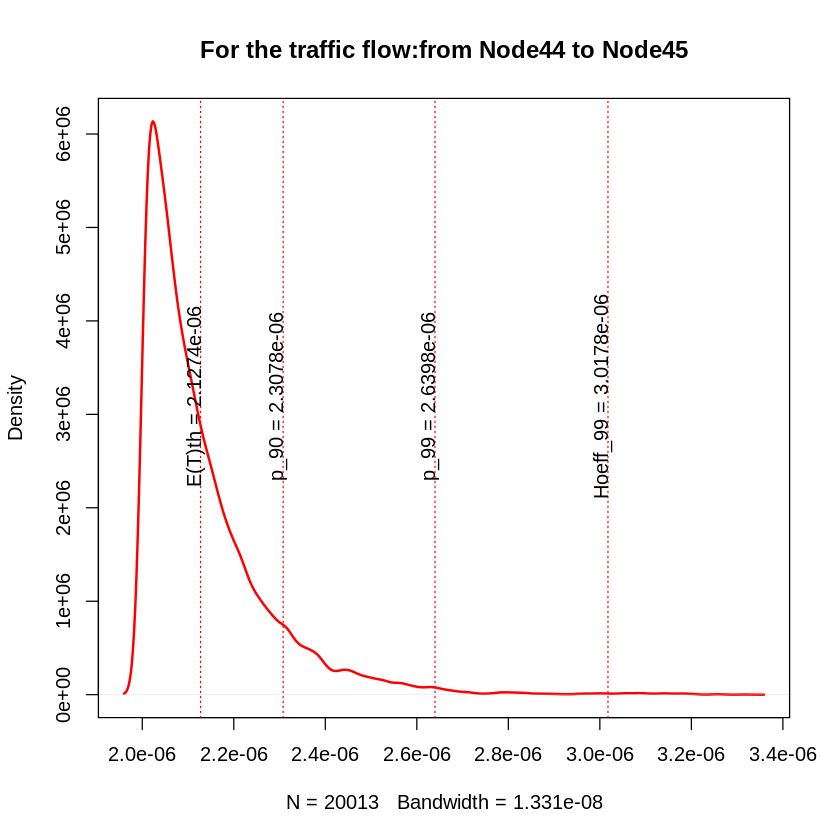

+ 1/202 edge from edd41aa (vertex names):
[1] Node44->Node46
[1] "variance= 2.10508300770344e-15"
[1] "sigma2= 4.58811835909171e-08"
[1] "igraph E(T) = 2.0456385559801e-06"
[1] "simmer E(T) = 2.04605246083035e-06"


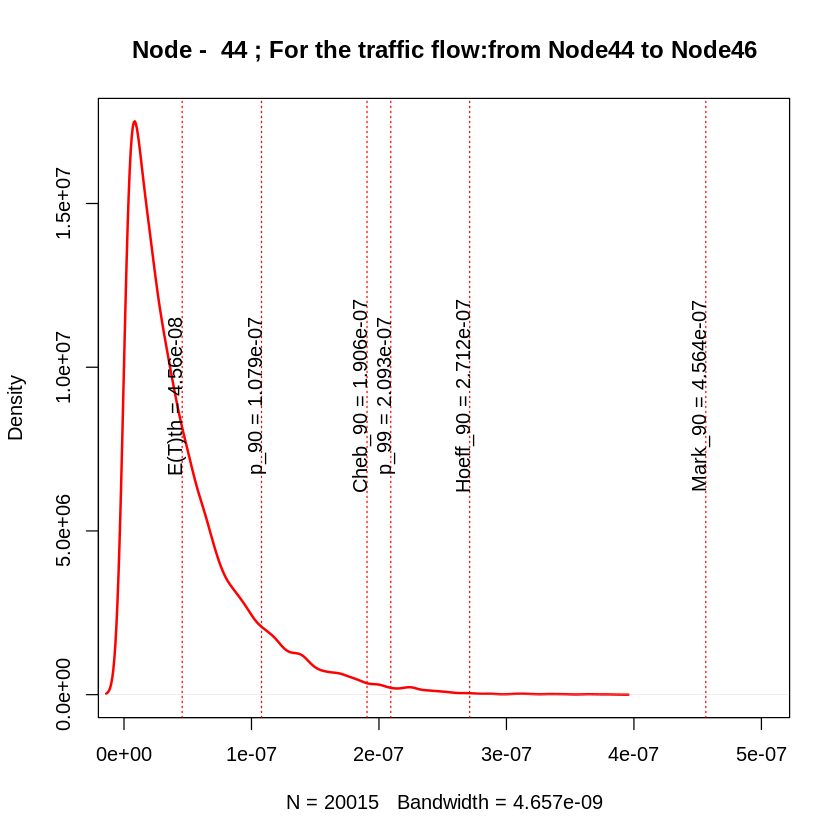

[1] 99
+ 1/202 edge from edd41aa (vertex names):
[1] Node43->Node47
[1] "traffic_Node43_Node47_"
[1] 43
[1] "Node -  43 :"
[1] "variance= 8.86460830658588e-16"
[1] "sigma2= 2.97734920803487e-08"
[1] "igraph E(T) = 2.56333441925315e-08"
[1] "simmer E(T) = 2.72042128703789e-08"


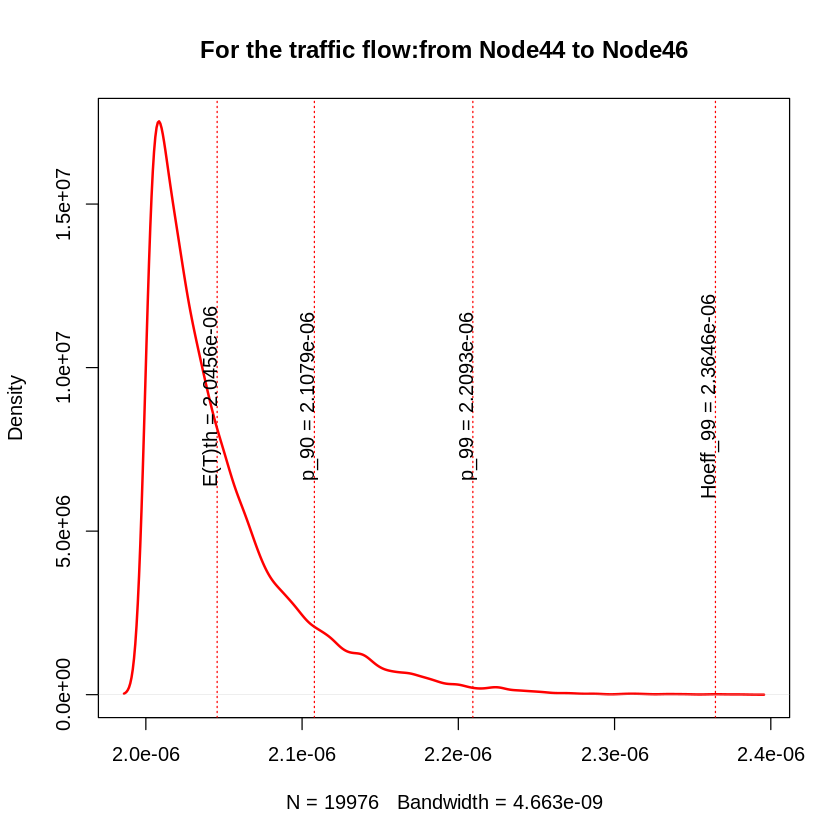

+ 1/202 edge from edd41aa (vertex names):
[1] Node43->Node47
[1] "variance= 8.88867739253253e-16"
[1] "sigma2= 2.9813885007715e-08"
[1] "igraph E(T) = 2.02563334419253e-06"
[1] "simmer E(T) = 2.0272353745839e-06"


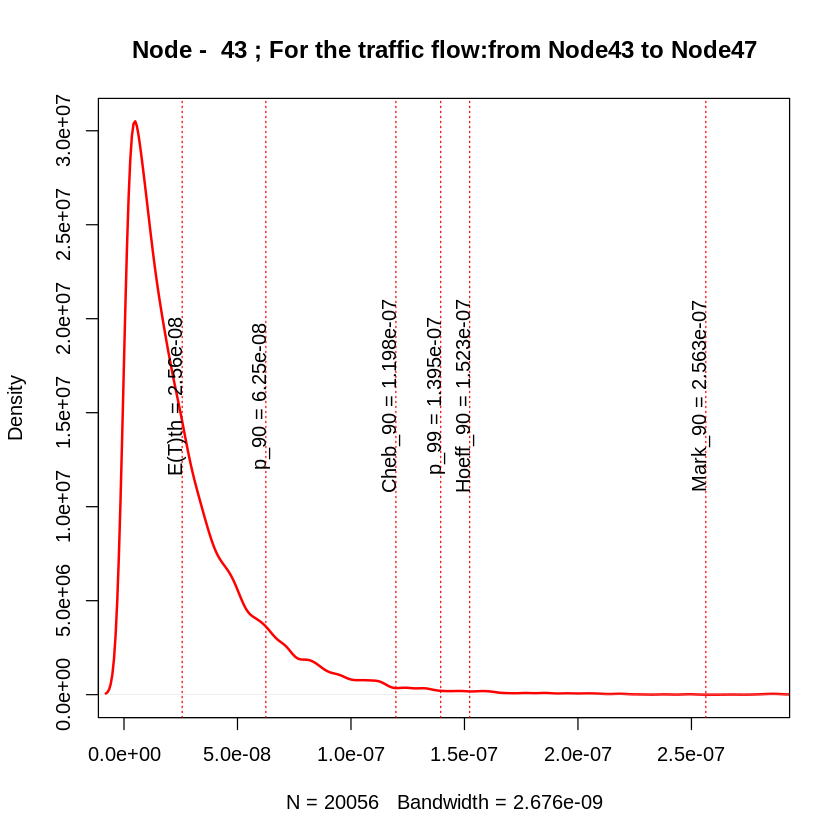

[1] 100
+ 1/202 edge from edd41aa (vertex names):
[1] Node43->Node48
[1] "traffic_Node43_Node48_"
[1] 43
[1] "Node -  43 :"
[1] "variance= 1.37038826109236e-15"
[1] "sigma2= 3.70187555313838e-08"
[1] "igraph E(T) = 3.67359730473004e-08"
[1] "simmer E(T) = 3.72299938453065e-08"


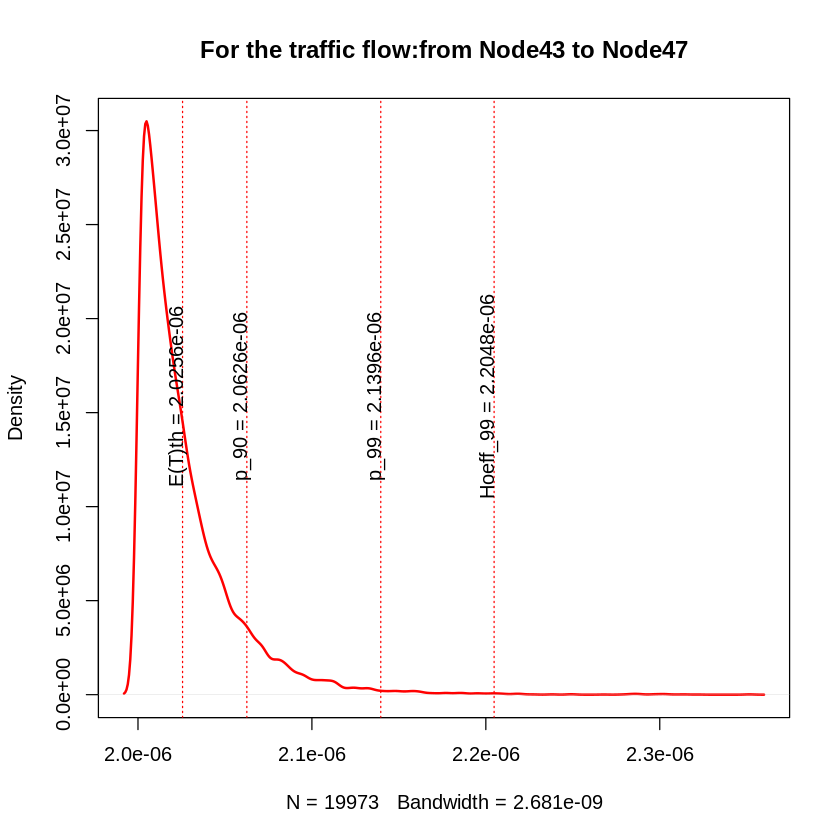

+ 1/202 edge from edd41aa (vertex names):
[1] Node43->Node48
[1] "variance= 1.37202435609064e-15"
[1] "sigma2= 3.70408471297652e-08"
[1] "igraph E(T) = 2.0367359730473e-06"
[1] "simmer E(T) = 2.03726408866878e-06"


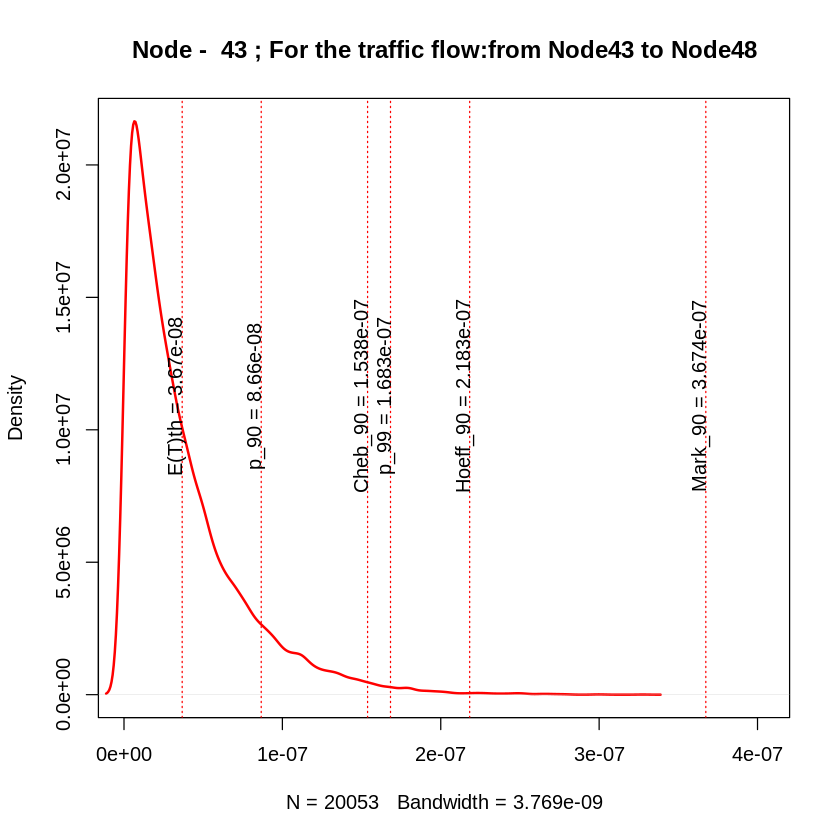

[1] 101
+ 1/202 edge from edd41aa (vertex names):
[1] Node42->Node49
[1] "traffic_Node42_Node49_"
[1] 42
[1] "Node -  42 :"
[1] "variance= 4.16828139574769e-16"
[1] "sigma2= 2.04163694023881e-08"
[1] "igraph E(T) = 1.97935812481855e-08"
[1] "simmer E(T) = 2.01616260872321e-08"


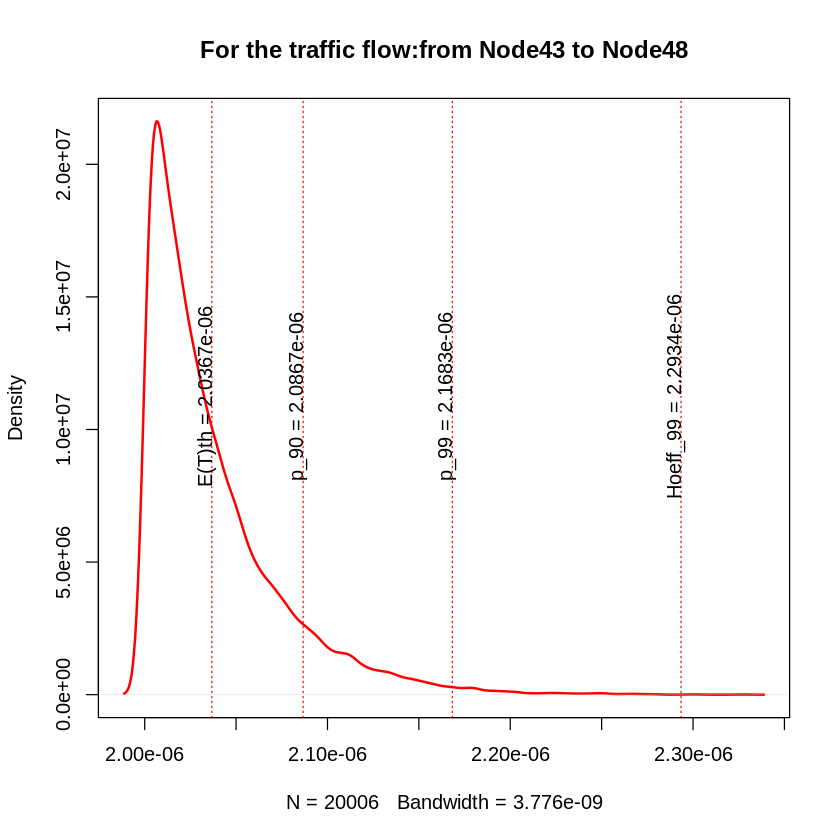

+ 1/202 edge from edd41aa (vertex names):
[1] Node42->Node49
[1] "variance= 4.16880034953065e-16"
[1] "sigma2= 2.04176402885609e-08"
[1] "igraph E(T) = 2.01979358124819e-06"
[1] "simmer E(T) = 2.02015317000415e-06"


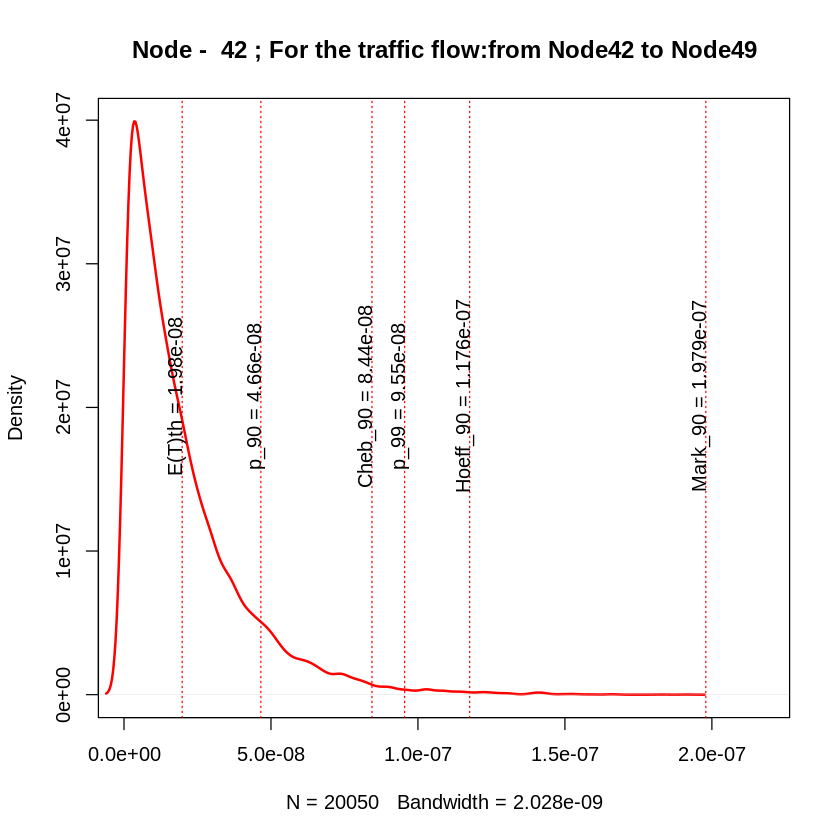

[1] 102
+ 1/202 edge from edd41aa (vertex names):
[1] Node41->Node50
[1] "traffic_Node41_Node50_"
[1] 41
[1] "Node -  41 :"
[1] "variance= 9.53630462286421e-14"
[1] "sigma2= 3.08809077309334e-07"
[1] "igraph E(T) = 2.9704674555052e-07"
[1] "simmer E(T) = 3.02531650440469e-07"


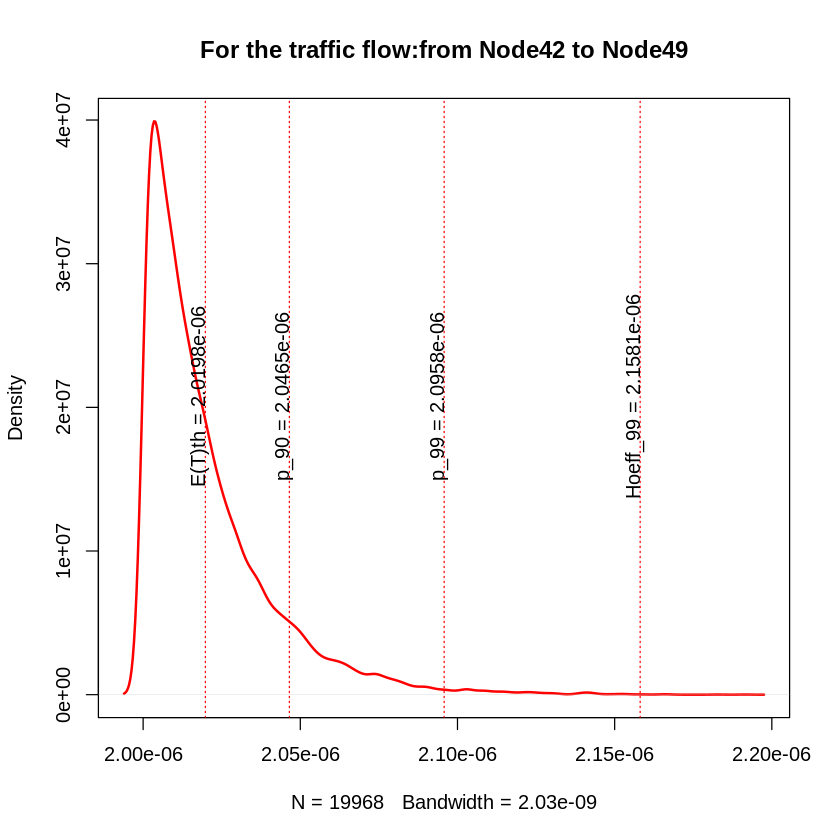

+ 1/202 edge from edd41aa (vertex names):
[1] Node41->Node50
[1] "variance= 9.53774433240546e-14"
[1] "sigma2= 3.08832387103514e-07"
[1] "igraph E(T) = 2.29704674555052e-06"
[1] "simmer E(T) = 2.30256847500519e-06"


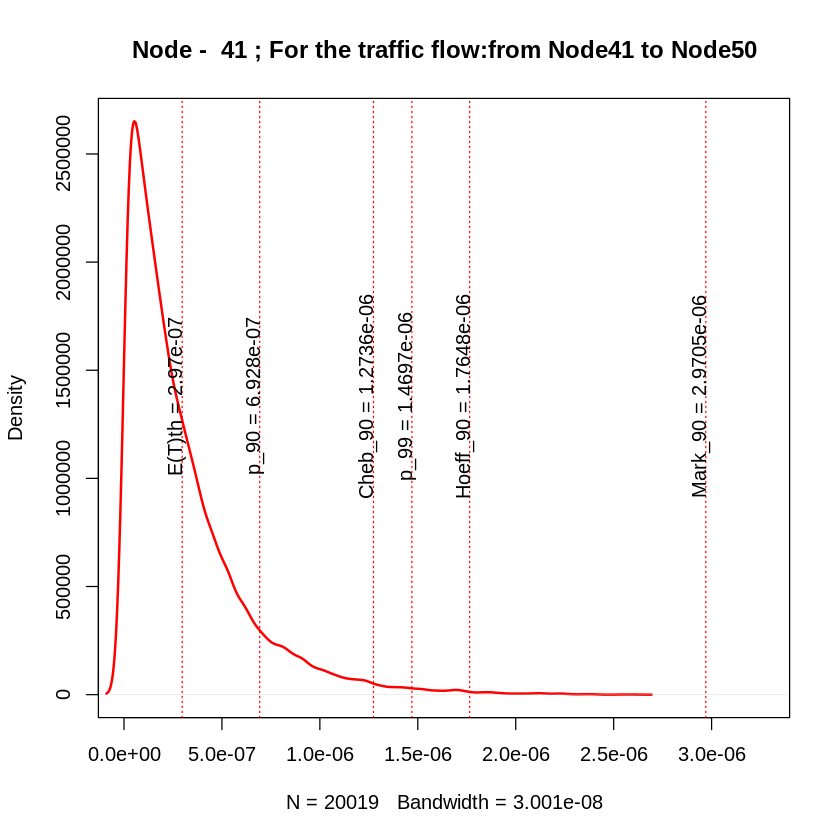

[1] 103
+ 1/202 edge from edd41aa (vertex names):
[1] Node40->Node51
[1] "traffic_Node40_Node51_"
[1] 40
[1] "Node -  40 :"
[1] "variance= 1.3411439114128e-15"
[1] "sigma2= 3.66216317415376e-08"
[1] "igraph E(T) = 3.4785115855675e-08"
[1] "simmer E(T) = 3.53622578029898e-08"


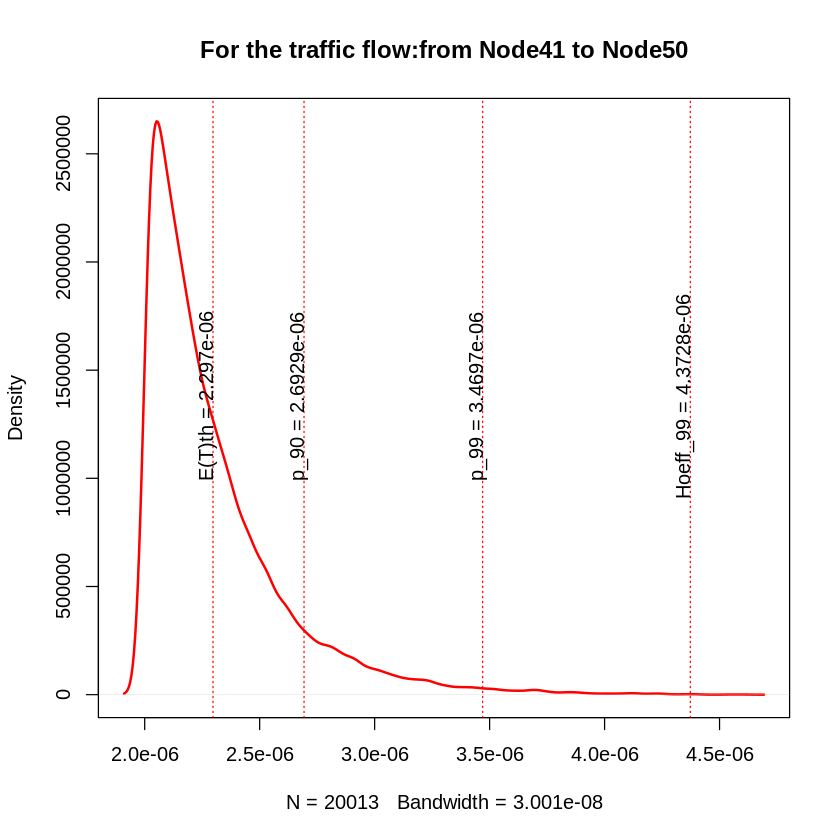

+ 1/202 edge from edd41aa (vertex names):
[1] Node40->Node51
[1] "variance= 1.34290459985665e-15"
[1] "sigma2= 3.66456627700557e-08"
[1] "igraph E(T) = 2.03478511585567e-06"
[1] "simmer E(T) = 2.03537824607836e-06"


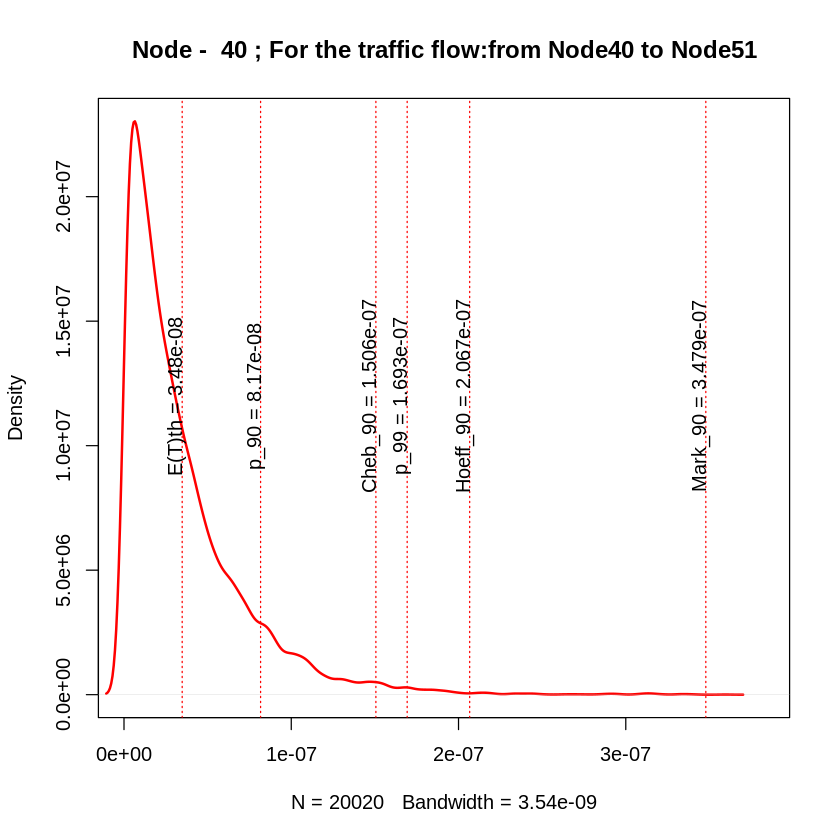

[1] 104
[1] "node_19"
[1] 106780051
[1] 0.5176778
[1] 37960546
+ 1/202 edge from edd41aa (vertex names):
[1] Node19->Node20
+ 1/202 edge from edd41aa (vertex names):
[1] Node20->Node52
[1] "traffic_Node19_Node52_"
[1] 19
[1] "Node -  19 :"
[1] "variance= 3.67679256133442e-16"
[1] "sigma2= 1.91749643059236e-08"
[1] "igraph E(T) = 1.94165759732964e-08"
[1] "simmer E(T) = 1.94536158861658e-08"


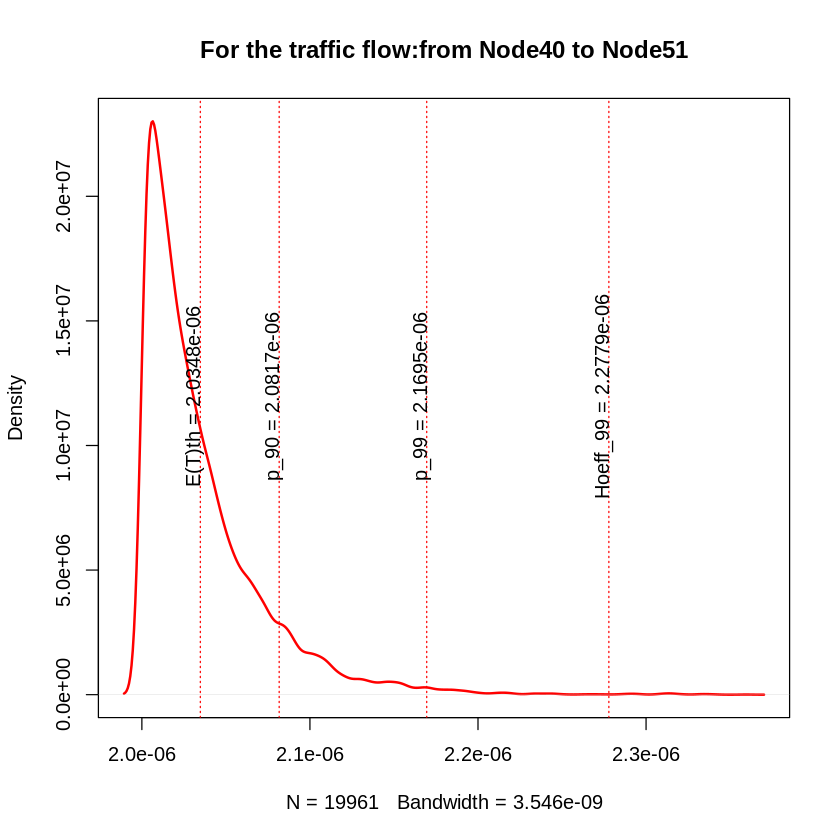

+ 1/202 edge from edd41aa (vertex names):
[1] Node19->Node20
[1] 20
[1] "Node -  20 :"
[1] "variance= 5.05404465124968e-15"
[1] "sigma2= 7.10918043887598e-08"
[1] "igraph E(T) = 7.04581013034233e-08"
[1] "simmer E(T) = 6.9489745616551e-08"


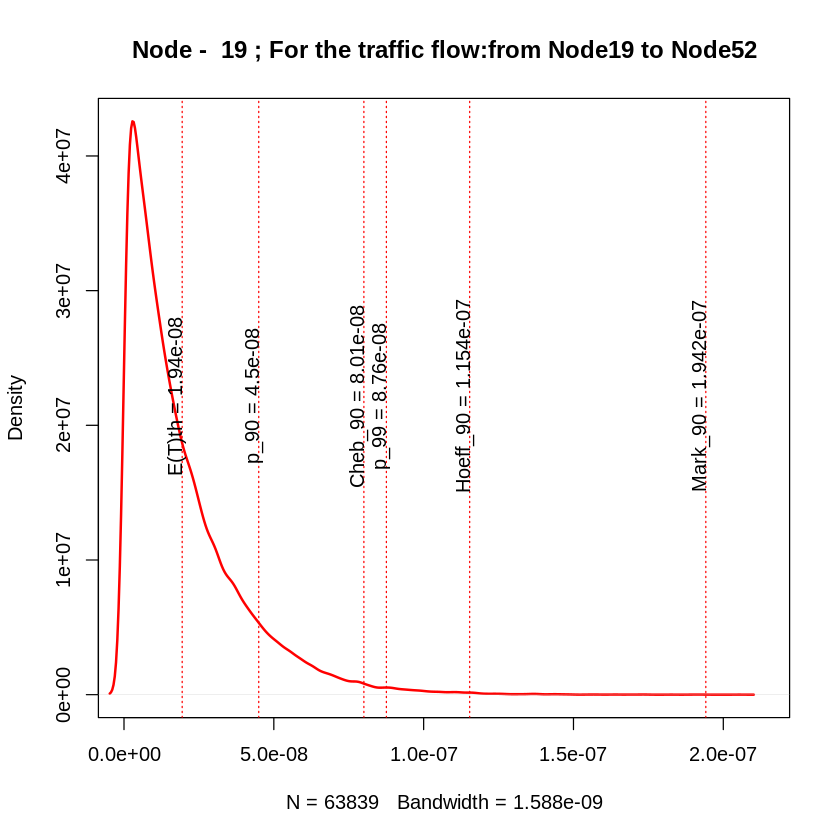

+ 1/202 edge from edd41aa (vertex names):
[1] Node20->Node52
[1] "variance= 5.37774999062261e-15"
[1] "sigma2= 7.33331438752125e-08"
[1] "igraph E(T) = 5.08987467727672e-06"
[1] "simmer E(T) = 5.08886602190596e-06"


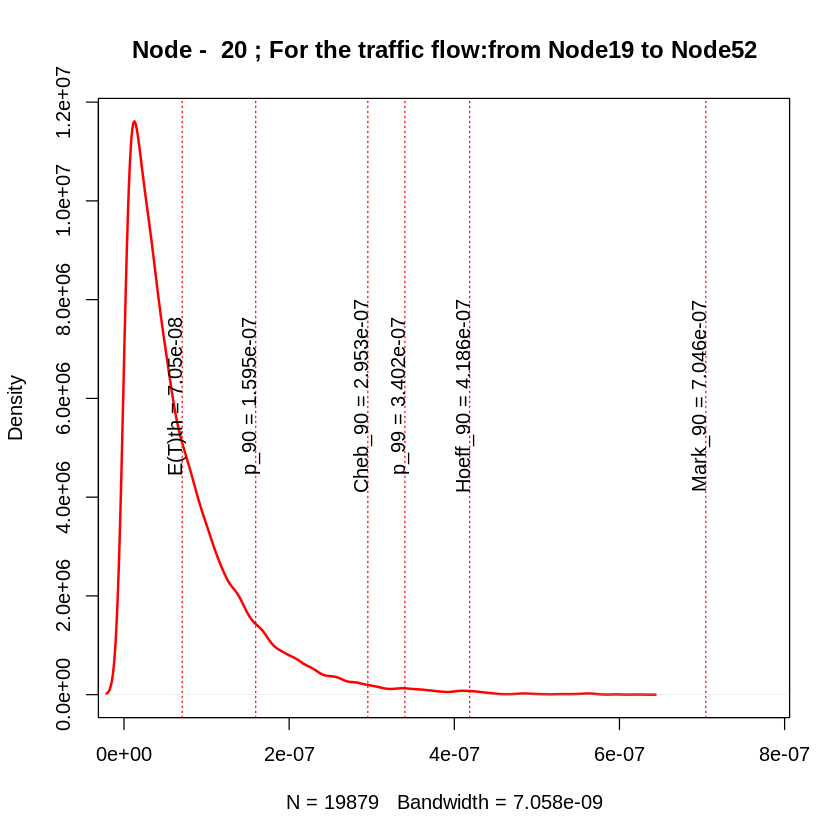

[1] "igraph E(T) = 9.18933187298427e-09"
[1] "simmer E(T) = 9.40277808350642e-09"


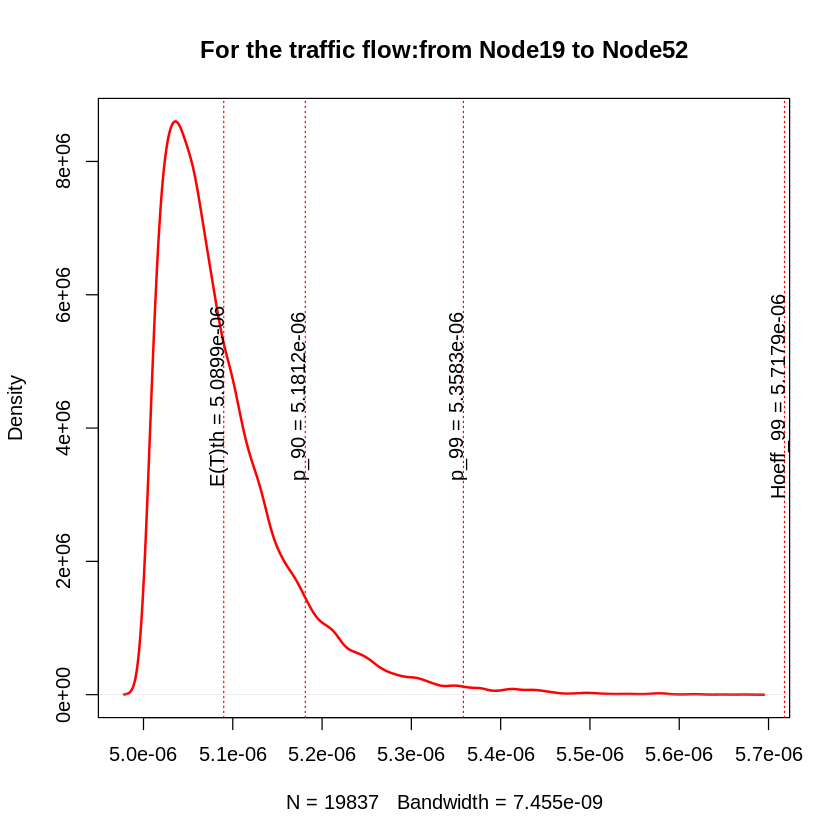

In [ ]:
c(traffic_file$Delay_sim_s, traffic_file$Delay_th_s, traffic_file$D99_sim_s, traffic_file$Hoeff_99th_s, g) := simulation_simmer(g, traffic_file)

print(paste("igraph E(T) =", mean(E(g)$Queue_Delay)))
print(paste("simmer E(T) =", mean(E(g)$Queue_Delay_sim)))

#Output table of traffic flows with delays: theoretic, simulated average packet delay and D.99

In [ ]:
traffic_file

sourceID,destinationID,trafficGbps,service,traffic_ps,Delay_sim_s,Delay_th_s,D99_sim_s,Hoeff_99th_s
<chr>,<chr>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Node1,Node9,1944.972,CWB,238580127,8.005539e-06,8.005646e-06,8.020809e-06,8.037311e-06
Node2,Node16,1670.904,CWB,204961557,8.008184e-06,8.008154e-06,8.025794e-06,8.048839e-06
Node3,Node11,1498.266,CWB,183784904,3.006111e-06,3.005895e-06,3.028990e-06,3.047089e-06
Node4,Node13,3015.369,CWB,369880451,3.005349e-06,3.005259e-06,3.025912e-06,3.042009e-06
Node5,Node16,1804.626,CWB,221364575,3.004616e-06,3.004650e-06,3.021592e-06,3.037142e-06
Node6,Node19,3564.954,CWB,437295333,3.003062e-06,3.003017e-06,3.014738e-06,3.024103e-06
Node7,Node9,2618.136,CWB,321153837,7.003539e-06,7.003513e-06,7.012130e-06,7.021428e-06
Node8,Node9,1915.578,CWB,234974510,3.001299e-06,3.001308e-06,3.005984e-06,3.010446e-06
Node9,Node9,3798.036,CWB,465886353,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00


#Calculation of delays for different capacities

In [ ]:
c(g_c10_dg_l05, data_av_c10_dg_l05, data_99_c10_dg_l05) := simulation_igraph(nodes_info, links_info, traffic_file, Capacity = 10, calc_dist = 0, distance = 5, Load_local = 0.5, Load_regional = 0.6, Load_national = 0.5, prefix_base, national_nodes, regional_nodes, N)
c(g_c40_dg_l05, data_av_c40_dg_l05, data_99_c40_dg_l05) := simulation_igraph(nodes_info, links_info, traffic_file, Capacity = 40, calc_dist = 0,  distance = 5, Load_local = 0.5, Load_regional = 0.6, Load_national = 0.5, prefix_base, national_nodes, regional_nodes, N)
c(g_c100_dg_l05, data_av_c100_dg_l05, data_99_c100_dg_l05) := simulation_igraph(nodes_info, links_info, traffic_file, Capacity = 100, calc_dist = 0,  distance = 5, Load_local = 0.5, Load_regional = 0.6, Load_national = 0.5, prefix_base, national_nodes, regional_nodes, N)
c(g_c400_dg_l05, data_av_c400_dg_l05, data_99_c400_dg_l05) := simulation_igraph(nodes_info, links_info, traffic_file, Capacity = 400, calc_dist = 0,  distance = 5, Load_local = 0.5, Load_regional = 0.6, Load_national = 0.5, prefix_base, national_nodes, regional_nodes, N)


#Calculation of delays for different distances

In [ ]:
c(g_c100_d05g_l05, data_av_c100_d05g_l05, data_99_c100_d05g_l05) :=simulation_igraph(nodes_info, links_info, traffic_file, Capacity = 100, calc_dist = 1, distance = 0.5, Load_local = 0.5, Load_regional = 0.6, Load_national = 0.5, prefix_base, national_nodes, regional_nodes, N)
c(g_c100_d2g_l05, data_av_c100_d2g_l05, data_99_c100_d2g_l05) :=simulation_igraph(nodes_info, links_info, traffic_file, Capacity = 100, calc_dist = 1, distance = 2, Load_local = 0.5, Load_regional = 0.6, Load_national = 0.5, prefix_base, national_nodes, regional_nodes, N)
c(g_c100_d4g_l05, data_av_c100_d4g_l05, data_99_c100_d4g_l05) :=simulation_igraph(nodes_info, links_info, traffic_file, Capacity = 100, calc_dist = 1, distance = 4, Load_local = 0.5, Load_regional = 0.6, Load_national = 0.5, prefix_base, national_nodes, regional_nodes, N)


#Boxplots

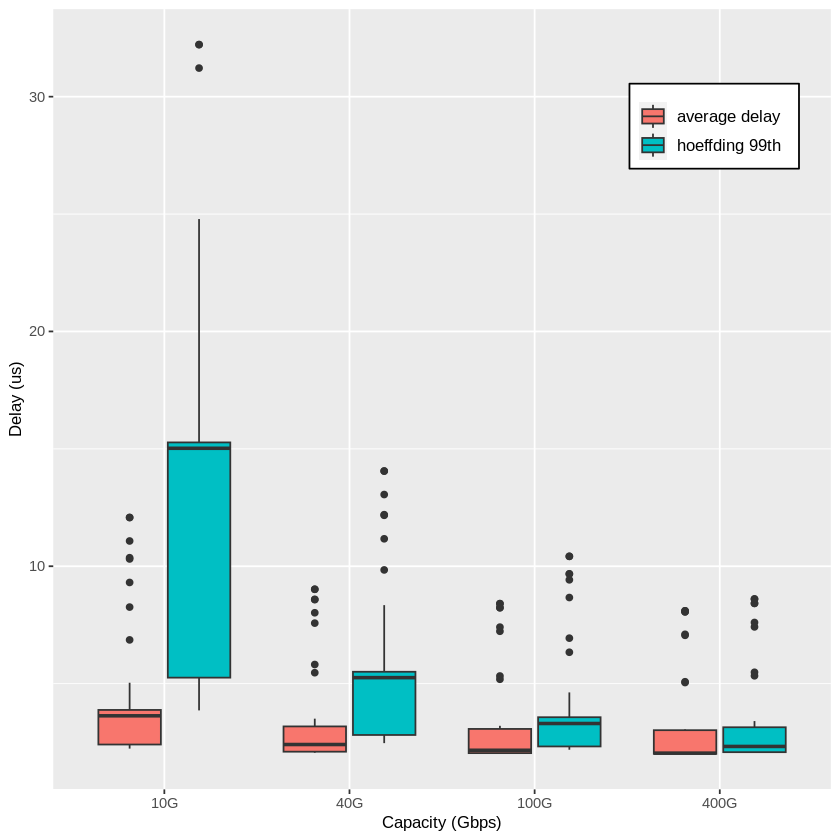

In [ ]:
df_plot_capacity <- data.frame(capacity = c(rep("10G", length(data_99_c10_dg_l05)),
                                            rep("40G", length(data_99_c40_dg_l05)),
                                            rep("100G", length(data_99_c100_dg_l05)),
                                            rep("400G", length(data_99_c400_dg_l05)),
                                            rep("10G", length(data_av_c10_dg_l05)),
                                            rep("40G", length(data_av_c40_dg_l05)),
                                            rep("100G", length(data_av_c100_dg_l05)),
                                            rep("400G", length(data_av_c400_dg_l05))),
                               value = c(data_99_c10_dg_l05,
                                         data_99_c40_dg_l05,
                                         data_99_c100_dg_l05,
                                         data_99_c400_dg_l05,
                                         data_av_c10_dg_l05,
                                         data_av_c40_dg_l05,
                                         data_av_c100_dg_l05,
                                         data_av_c400_dg_l05),
                               type_of_calc = c(rep("hoeffding 99th",length(data_99_c10_dg_l05)*4),
                                                rep("average delay",length(data_99_c10_dg_l05)*4)))



# grouped boxplot
ggplot(df_plot_capacity, aes(x=fct_reorder(capacity,value, .desc = TRUE), y=value*1000000, fill=type_of_calc)) +
geom_boxplot()+
theme(legend.title = element_blank(), legend.position = c(0.85, 0.85), axis.title.y = element_text(size = 10), axis.title.x = element_text(size = 10),
  legend.text = element_text(size = 10), legend.background = element_rect(colour = "black")
  ) +
ylab("Delay (us)") +
xlab("Capacity (Gbps)")


[1] "0.5x diam 2.3 km av link dist 0.282 km"

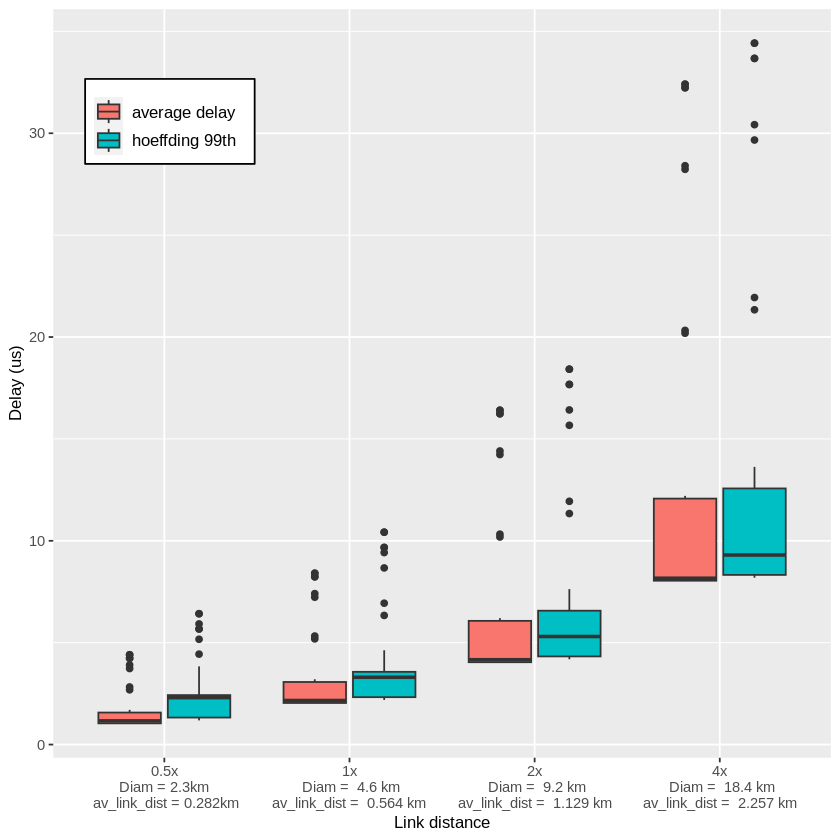

In [ ]:
diam_km <-  round(diameter(g_c100_d05g_l05, directed = TRUE, unconnected = TRUE, weights = E(g_c100_d05g_l05)$Distance), digits = 3)
av_link_km <- round(mean(E(g_c100_d05g_l05)$Distance), digits = 3)
name_05 <- paste0("0.5x\n", "Diam = ", diam_km, "km\n av_link_dist", " = ", av_link_km, "km")
name_1 <- paste("1x\n", "Diam = ", round(diameter(g_c100_dg_l05, directed = TRUE, unconnected = TRUE, weights = E(g_c100_dg_l05)$Distance), digits = 3), "km\nav_link_dist = ", round(mean(E(g_c100_dg_l05)$Distance), digits = 3), "km")
name_2 <- paste("2x\n", "Diam = ", round(diameter(g_c100_d2g_l05, directed = TRUE, unconnected = TRUE, weights = E(g_c100_d2g_l05)$Distance), digits = 3), "km\nav_link_dist = ", round(mean(E(g_c100_d2g_l05)$Distance), digits = 3), "km")
name_4 <- paste("4x\n", "Diam = ", round(diameter(g_c100_d4g_l05, directed = TRUE, unconnected = TRUE, weights = E(g_c100_d4g_l05)$Distance), digits = 3), "km\nav_link_dist = ", round(mean(E(g_c100_d4g_l05)$Distance), digits = 3), "km")

####distanceVSdelay
distance = c(rep(name_05, length(data_99_c100_d05g_l05)),
             rep(name_1, length(data_99_c100_dg_l05)),
             rep(name_2, length(data_99_c100_d2g_l05)),
             rep(name_4, length(data_99_c100_d4g_l05)),
             rep(name_05, length(data_av_c100_d05g_l05)),
             rep(name_1, length(data_av_c100_dg_l05)),
             rep(name_2, length(data_av_c100_d2g_l05)),
             rep(name_4, length(data_av_c100_d4g_l05)))

type_of_calc = c(rep("hoeffding 99th",length(distance)/2),
                 rep("average delay",length(distance)/2))

paste("0.5x", "diam", diam_km, "km av link dist", av_link_km, "km")
value = c(data_99_c100_d05g_l05,
          data_99_c100_dg_l05,
          data_99_c100_d2g_l05,
          data_99_c100_d4g_l05,
          data_av_c100_d05g_l05,
          data_av_c100_dg_l05,
          data_av_c100_d2g_l05,
          data_av_c100_d4g_l05)

df_plot_dist <- data.frame(distance, value, type_of_calc)


# grouped df_plot_dist
ggplot(df_plot_dist, aes(x=distance, y=value*1000000, fill=type_of_calc)) +
  geom_boxplot()+
  theme(
    legend.title = element_blank(), legend.position = c(0.15, 0.85), axis.title.y = element_text(size = 10), axis.title.x = element_text(size = 10),
    legend.text = element_text(size = 10), legend.background = element_rect(colour = "black")
  ) +
  ylab("Delay (us)") +
  xlab("Link distance")


#Creating the report file

In [ ]:
update_file <- function(links_info_df, traffic_file, file_name = "Milano_topology_result.xlsx", file_old_name)
{
    wb <- createWorkbook()
    addWorksheet(wb, sheetName = "Nodes")
    writeData(wb, sheet = 1, read_excel(file_old_name, sheet = 1))
    addWorksheet(wb, sheetName = "Links")
    writeData(wb, sheet = 2, links_info_df)
    addWorksheet(wb, sheetName = "Services")
    writeData(wb, sheet = 3, traffic_file)
    saveWorkbook(wb, file_name, overwrite = TRUE)
}